## Correlação entre empresas

In [4]:
## Bibliotecas

import pandas as pd
import matplotlib.pyplot as plt
import os

c:\Users\thgcn\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:20: UserWarning: Pandas requires version '2.7.3' or newer of 'numexpr' (version '2.7.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


In [3]:
stock1_data = pd.read_csv(f"dataset/prices_processed/sanb11.SA.csv")

In [4]:
stock1_data

,Date,event,Open,High,Low,Close,Adj Close,Volume,WClose,Daily_Return,Week_Return,Month_Return,Cumulative_std_Daily_Return,Cumulative_std_Week_Return,Cumulative_std_Month_Return,Indicator_Daily_Return,Indicator_Week_Return,Indicator_Month_Return
0,2010-01-04,0,22.753260,23.089277,22.743658,22.801262,9.608073,1566475,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
1,2010-01-05,0,22.791660,23.031675,22.503645,23.022074,9.701120,1334926,NaN,0.009638,NaN,NaN,NaN,NaN,NaN,0,0,0
2,2010-01-06,0,22.849264,22.993273,22.618853,22.906868,9.652574,818392,NaN,-0.005017,NaN,NaN,0.010362,NaN,NaN,-1,0,0
3,2010-01-07,0,22.743658,22.839664,22.570848,22.743658,9.583801,1114417,NaN,-0.007150,NaN,NaN,0.009139,NaN,NaN,-1,0,0
4,2010-01-08,0,22.618853,22.753260,21.841209,22.513247,9.486708,1196704,NaN,-0.010183,NaN,NaN,0.008803,NaN,NaN,-1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3468,2023-12-21,0,31.490000,31.790001,31.260000,31.379999,29.719650,2041100,24.223626,0.002233,-0.011722,0.021908,0.021645,0.049252,0.094164,1,-1,1
3469,2023-12-22,0,31.389999,31.959999,31.360001,31.540001,29.871185,1518700,25.144359,0.005086,-0.008210,0.016947,0.021642,0.049245,0.094151,1,-1,1
3470,2023-12-26,0,31.549999,31.870001,31.540001,31.700001,30.022720,768800,25.173496,0.005060,0.009190,0.023944,0.021639,0.049238,0.094138,1,1,1
3471,2023-12-27,0,31.700001,32.189999,31.559999,32.080002,30.382616,1021000,25.740616,0.011916,0.014127,0.043970,0.021637,0.049231,0.094126,1,1,1


In [5]:
## Função
def corr_pair(stock1, stock2, start_date, end_date, window_size):
    # Carregar os dados
    stock1_data = pd.read_csv(f"dataset/prices_processed/{stock1}.SA.csv")
    stock2_data = pd.read_csv(f"dataset/prices_processed/{stock2}.SA.csv")
    
    # Filtrar as colunas relevantes
    stock1_return = stock1_data[['Date', 'event', 'Daily_Return']]
    stock2_return = stock2_data[['Date', 'event', 'Daily_Return']]
    
    # Mesclar os dados com base na data
    merged_data = pd.merge(stock1_return, stock2_return, on='Date', suffixes=(f'_{stock1}', f'_{stock2}'))
    
    # Calcular a correlação móvel entre os retornos diários
    merged_data['Rolling_Correlation'] = merged_data[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(merged_data[f'Daily_Return_{stock2}'])
    
    # Filtrar o DataFrame com base nas datas fornecidas
    filtered_data = merged_data[(merged_data['Date'] >= start_date) & (merged_data['Date'] <= end_date)]
    
    # Criar o gráfico
    plt.figure(figsize=(20, 7))
    
    # Plotar a correlação diária
    plt.plot(filtered_data['Date'], filtered_data['Rolling_Correlation'], label=f'Correlação Diária ({window_size}-dias)', color='black')
    
    # Adicionar marcações verticais para eventos
    event_stock1_dates = filtered_data[filtered_data[f'event_{stock1}'] == 1]['Date'].values
    event_stock2_dates = filtered_data[filtered_data[f'event_{stock2}'] == 1]['Date'].values
    
    # Adicionar linhas verticais para eventos do stock1
    for date in event_stock1_dates:
        plt.axvline(x=date, color='blue', linestyle='--', linewidth=0.8, label=f'Evento {stock1}' if date == event_stock1_dates[0] else "")
    
    # Adicionar linhas verticais para eventos do stock2
    for date in event_stock2_dates:
        plt.axvline(x=date, color='red', linestyle='--', linewidth=0.8, label=f'Evento {stock2}' if date == event_stock2_dates[0] else "")
    
    # Configurar o gráfico
    plt.xlabel('Data')
    plt.ylabel('Correlação')
    plt.title(f'Correlação Diária entre os Retornos de {stock1} e {stock2}')
    plt.legend()
    plt.grid(True)
    
    # Exibir o gráfico
    plt.show()

    # Imprimir as datas dos eventos
    print(f"Datas das publicações '{stock1}':")
    for date in event_stock1_dates:
        print(date)
    
    print(f"\nDatas das publicações '{stock2}':")
    for date in event_stock2_dates:
        print(date)

def count_publications_per_year(companies, start_date, end_date):
    # Inicializar um dicionário para armazenar os dados
    data = {}

    # Iterar sobre a lista de empresas
    for company in companies:
        # Ler o arquivo CSV para cada empresa
        stock_data = pd.read_csv(f"dataset/prices_processed/{company}")
        
        # Garantir que a coluna 'Date' esteja no formato datetime
        stock_data['Date'] = pd.to_datetime(stock_data['Date'])
        
        # Filtrar os dados pelo intervalo de datas fornecido
        filtered_data = stock_data[(stock_data['Date'] >= start_date) & (stock_data['Date'] <= end_date)].copy()
        
        # Filtrar apenas onde 'event' == 1
        filtered_data = filtered_data[filtered_data['event'] == 1]
        
        # Extrair o ano das datas usando .loc para evitar o SettingWithCopyWarning
        filtered_data.loc[:, 'Year'] = filtered_data['Date'].dt.year
        
        # Contar o número de publicações por ano
        year_counts = filtered_data.groupby('Year').size()
        
        # Adicionar os contadores ao dicionário
        for year, count in year_counts.items():
            if year not in data:
                data[year] = {}
            data[year][company] = count

    # Converter o dicionário para um DataFrame e transpor
    df = pd.DataFrame.from_dict(data, orient='index').fillna(0).T
    
    # Adicionar uma coluna com a contagem de publicações para cada empresa
    df.index.name = 'Ano'
    
    return df

In [6]:
companies = ['ABEV3.SA.csv',
 'ANIM3.SA.csv',
 'AZUL4.SA.csv',
 'B3SA3.SA.csv',
 'BBAS3.csv',
 'BBAS3.SA.csv',
 'BBDC3.SA.csv',
 'BBDC4.csv',
 'BBDC4.SA.csv',
 'BOVA11.SA.csv',
 'BPAC11.csv',
 'BPAC11.SA.csv',
 'BRAP4.SA.csv',
 'BRFS3.SA.csv',
 'BRKM5.SA.csv',
 'CIEL3.SA.csv',
 'CMIG4.SA.csv',
 'CPLE6.SA.csv',
 'CSAN3.SA.csv',
 'CSNA3.SA.csv',
 'CYRE3.SA.csv',
 'ECOR3.SA.csv',
 'ELET3.SA.csv',
 'ELET6.SA.csv',
 'EMBR3.SA.csv',
 'ENBR3.SA.csv',
 'ENGI11.SA.csv',
 'EQTL3.SA.csv',
 'GGBR4.SA.csv',
 'GOAU4.SA.csv',
 'GOLL4.SA.csv',
 'HAPV3.SA.csv',
 'HYPE3.SA.csv',
 'IBOV.csv',
 'IBOV.SA.csv',
 'ITSA4.SA.csv',
 'ITUB4.csv',
 'ITUB4.SA.csv',
 'JBSS3.SA.csv',
 'KLBN11.SA.csv',
 'LREN3.SA.csv',
 'MGLU3.SA.csv',
 'MRFG3.SA.csv',
 'MRVE3.SA.csv',
 'MULT3.SA.csv',
 'NTCO3.SA.csv',
 'PCAR3.SA.csv',
 'PETR3.SA.csv',
 'PETR4.SA.csv',
 'PRIO3.SA.csv',
 'RADL3.SA.csv',
 'RAIL3.SA.csv',
 'RENT3.SA.csv',
 'SANB11.csv',
 'SANB11.SA.csv',
 'SBSP3.SA.csv',
 'SLCE3.SA.csv',
 'SMTO3.SA.csv',
 'SULA11.SA.csv',
 'SUZB3.SA.csv',
 'TAEE11.SA.csv',
 'TIMS3.SA.csv',
 'TOTS3.SA.csv',
 'UGPA3.SA.csv',
 'USIM5.SA.csv',
 'VALE3.SA.csv',
 'VBBR3.SA.csv',
 'VIIA3.SA.csv',
 'VVAR4.SA.csv',
 'WEGE3.SA.csv',
 'YDUQ3.SA.csv']
start_date = '2013-01-01'
end_date = '2023-12-31'
publication_counts_table = count_publications_per_year(companies, start_date, end_date)
print(publication_counts_table)
publication_counts_table.to_csv("publicacao.csv")


FileNotFoundError: [Errno 2] No such file or directory: 'dataset/prices_processed/ABEV3.SA.csv'

In [ ]:
import pandas as pd

# Dataset fornecido
data = {
    'Ano': ['ABEV3.SA.csv', 'ANIM3.SA.csv', 'B3SA3.SA.csv', 'BBAS3.SA.csv', 'BBDC3.SA.csv', 'BBDC4.SA.csv', 
            'BRAP4.SA.csv', 'BRFS3.SA.csv', 'BRKM5.SA.csv', 'CIEL3.SA.csv', 'CMIG4.SA.csv', 'CPLE6.SA.csv', 
            'CSAN3.SA.csv', 'CSNA3.SA.csv', 'CYRE3.SA.csv', 'ECOR3.SA.csv', 'ELET3.SA.csv', 'ELET6.SA.csv', 
            'EMBR3.SA.csv', 'ENGI11.SA.csv', 'EQTL3.SA.csv', 'GGBR4.SA.csv', 'GOAU4.SA.csv', 'GOLL4.SA.csv', 
            'HYPE3.SA.csv', 'ITSA4.SA.csv', 'ITUB4.SA.csv', 'JBSS3.SA.csv', 'LREN3.SA.csv', 'MGLU3.SA.csv', 
            'MRFG3.SA.csv', 'MRVE3.SA.csv', 'MULT3.SA.csv', 'PCAR3.SA.csv', 'PETR3.SA.csv', 'PETR4.SA.csv', 
            'PRIO3.SA.csv', 'RADL3.SA.csv', 'RENT3.SA.csv', 'SANB11.SA.csv', 'SBSP3.SA.csv', 'SLCE3.SA.csv', 
            'SMTO3.SA.csv', 'SUZB3.SA.csv', 'TAEE11.SA.csv', 'TOTS3.SA.csv', 'UGPA3.SA.csv', 'USIM5.SA.csv', 
            'VALE3.SA.csv', 'WEGE3.SA.csv', 'YDUQ3.SA.csv', 'KLBN11.SA.csv', 'RAIL3.SA.csv', 'VVAR4.SA.csv', 
            'AZUL4.SA.csv', 'BPAC11.SA.csv', 'HAPV3.SA.csv', 'VBBR3.SA.csv', 'NTCO3.SA.csv', 'TIMS3.SA.csv'],
    '2013': [1.0, 1.0, 4.0, 1.0, 1.0, 1.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 3.0, 4.0, 4.0, 4.0, 4.0, 3.0, 3.0, 5.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
    '2014': [4.0, 4.0, 4.0, 1.0, 1.0, 1.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
    '2015': [4.0, 4.0, 4.0, 1.0, 1.0, 1.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 4.0, 4.0, 4.0, 4.0, 4.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 1.0, 5.0, 5.0, 4.0, 4.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
    '2016': [4.0, 4.0, 4.0, 1.0, 1.0, 1.0, 4.0, 4.0, 4.0, 4.0, 0.0, 4.0, 4.0, 1.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 1.0, 4.0, 4.0, 4.0, 5.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
    '2017': [3.0, 4.0, 4.0, 1.0, 1.0, 1.0, 4.0, 4.0, 2.0, 4.0, 4.0, 1.0, 4.0, 2.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 3.0, 4.0, 4.0, 5.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 1.0, 1.0, 0.0, 4.0, 4.0, 0.0],
    '2018': [4.0, 4.0, 4.0, 1.0, 1.0, 1.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 3.0, 4.0, 4.0, 4.0, 3.0, 3.0, 4.0, 3.0, 3.0, 4.0, 3.0, 3.0],
    '2019': [3.0, 3.0, 4.0, 4.0, 1.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 3.0, 4.0, 4.0, 4.0, 4.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0],
    '2020': [4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0],
    '2021': [4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0],
    '2022': [4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0],
    '2023': [4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0],
    'Setor': ['Consumo', 'Consumo', 'Financeiro', 'Financeiro', 'Financeiro', 'Financeiro', 'Financeiro', 'Consumo', 
              'Financeiro', 'Consumo', 'Utilities', 'Utilities', 'Energia', 'Energia', 'Consumo', 'Energia', 
              'Energia', 'Energia', 'Utilities', 'Energia', 'Consumo', 'Consumo', 'Consumo', 'Consumo', 
              'Consumo', 'Energia', 'Financeiro', 'Consumo', 'Energia', 'Energia', 'Consumo', 'Energia', 
              'Consumo', 'Consumo', 'Consumo', 'Energia', 'Consumo', 'Consumo', 'Energia', 'Energia', 
              'Consumo', 'Energia', 'Energia', 'Consumo', 'Energia', 'Energia', 'Energia', 'Energia', 
              'Consumo', 'Energia', 'Consumo', 'Consumo', 'Energia']
}

# Criar um DataFrame
df = pd.DataFrame(data)

# Agrupar por setor
#df_grouped = df.groupby('Setor').mean()

# Exibir o resultado
print(df_grouped)


In [7]:
os.listdir('dataset/prices_processed')

['ANIM3.SA.csv',
 'AZUL4.SA.csv',
 'BBAS3.SA.csv',
 'BBDC3.SA.csv',
 'BBDC4.SA.csv',
 'BPAC11.SA.csv',
 'GOLL4.SA.csv',
 'ITUB4.SA.csv',
 'MGLU3.SA.csv',
 'NTCO3.SA.csv',
 'PETR4.SA.csv',
 'SANB11.SA.csv',
 'TOTS3.SA.csv',
 'VALE3.SA.csv',
 'VVAR4.SA.csv']

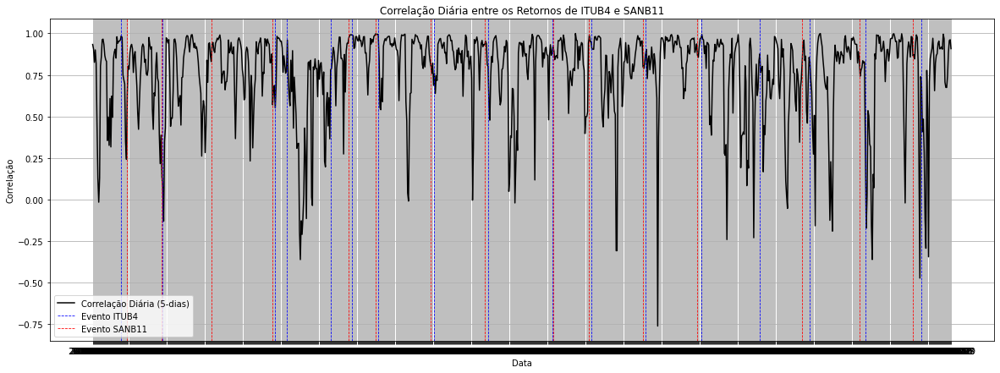

Datas das publicações 'ITUB4':
2019-02-19
2019-05-02
2019-11-04
2019-11-25
2020-02-10
2020-03-18
2020-05-04
2020-08-03
2020-11-03
2021-02-25
2021-05-03
2021-08-02
2021-11-03
2022-02-10
2022-05-09
2022-08-08
2022-11-10

Datas das publicações 'SANB11':
2019-02-28
2019-04-30
2019-07-23
2019-10-30
2020-03-12
2020-04-28
2020-07-29
2020-10-27
2021-02-26
2021-04-28
2021-07-28
2021-10-27
2022-04-26
2022-07-28
2022-10-26


In [9]:
corr_pair("ITUB4", "SANB11", '2019-01-01', '2022-12-31', '5')

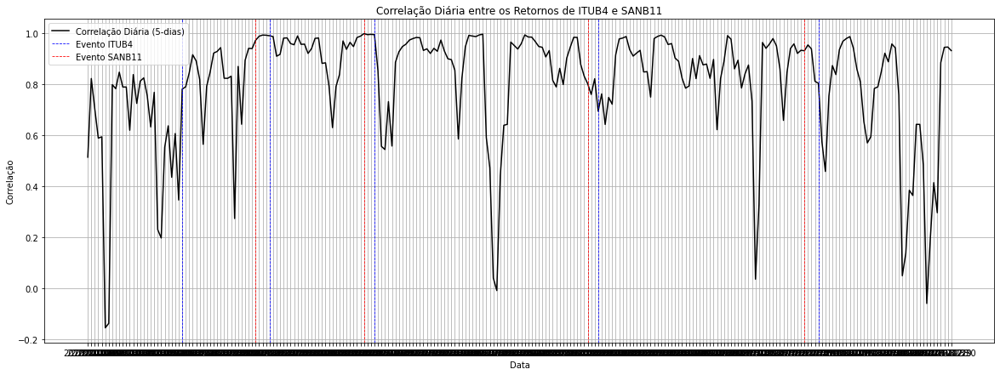

Datas das publicações 'ITUB4':
2020-02-10
2020-03-18
2020-05-04
2020-08-03
2020-11-03

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29
2020-10-27


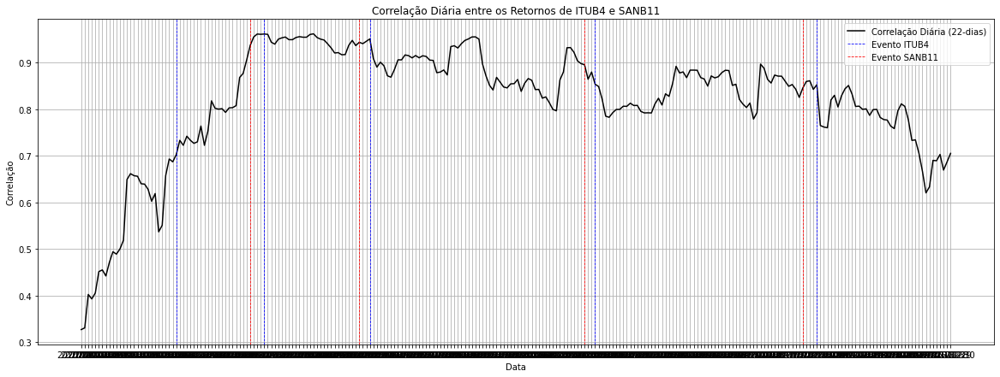

Datas das publicações 'ITUB4':
2020-02-10
2020-03-18
2020-05-04
2020-08-03
2020-11-03

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29
2020-10-27


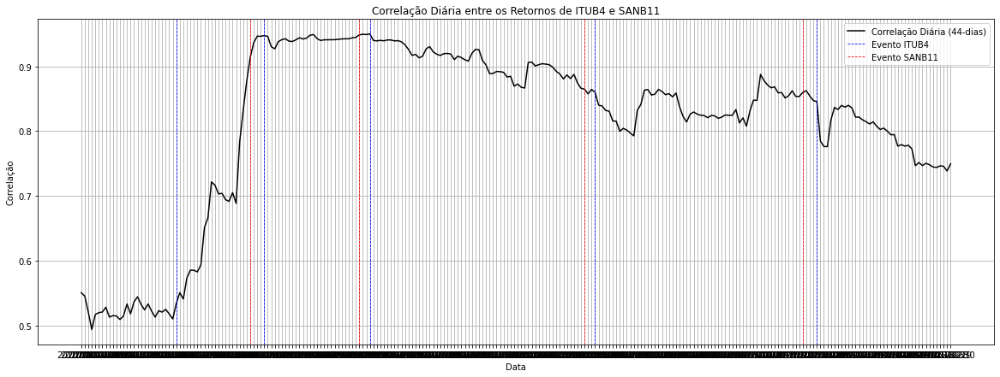

Datas das publicações 'ITUB4':
2020-02-10
2020-03-18
2020-05-04
2020-08-03
2020-11-03

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29
2020-10-27


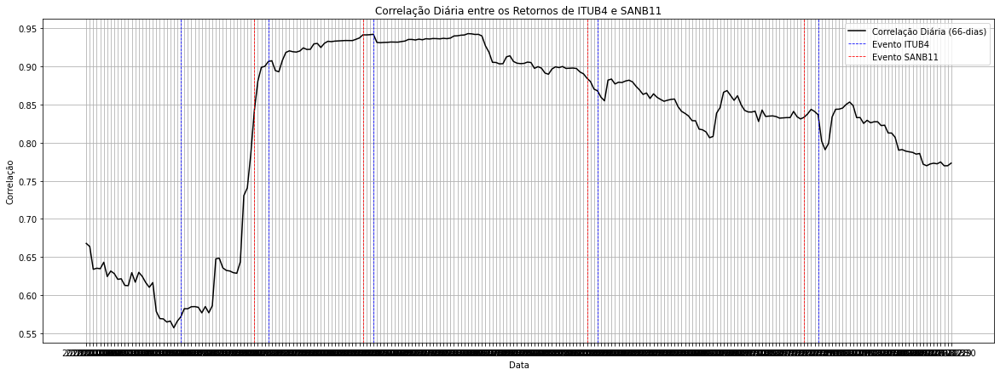

Datas das publicações 'ITUB4':
2020-02-10
2020-03-18
2020-05-04
2020-08-03
2020-11-03

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29
2020-10-27


In [125]:
corr_pair("ITUB4", "SANB11", '2020-01-01', '2020-12-31', '5')
corr_pair("ITUB4", "SANB11", '2020-01-01', '2020-12-31', '22')
corr_pair("ITUB4", "SANB11", '2020-01-01', '2020-12-31', '44')
corr_pair("ITUB4", "SANB11", '2020-01-01', '2020-12-31', '66')

Setor Bancário


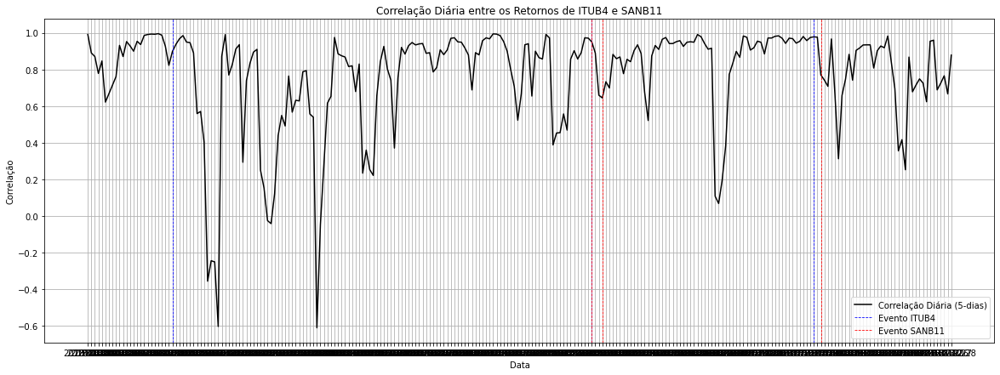

Datas das publicações 'ITUB4':
2018-02-05
2018-07-30
2018-10-29

Datas das publicações 'SANB11':
2018-07-30
2018-08-02
2018-10-31
Setor Bancário


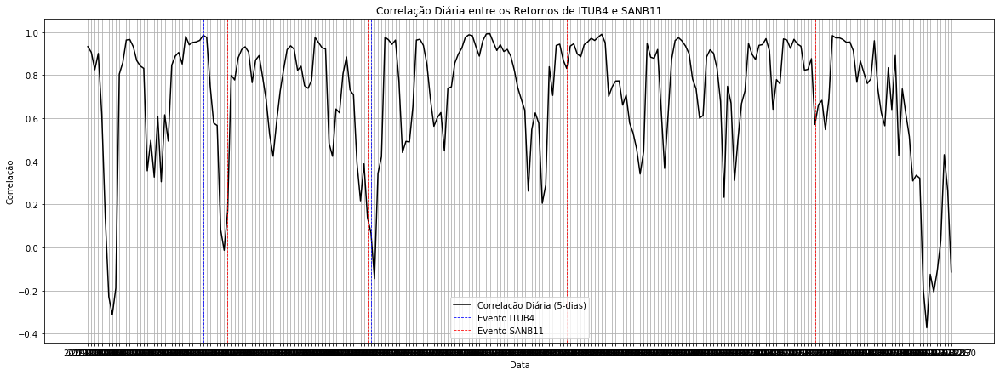

Datas das publicações 'ITUB4':
2019-02-19
2019-05-02
2019-11-04
2019-11-25

Datas das publicações 'SANB11':
2019-02-28
2019-04-30
2019-07-23
2019-10-30
Setor Bancário


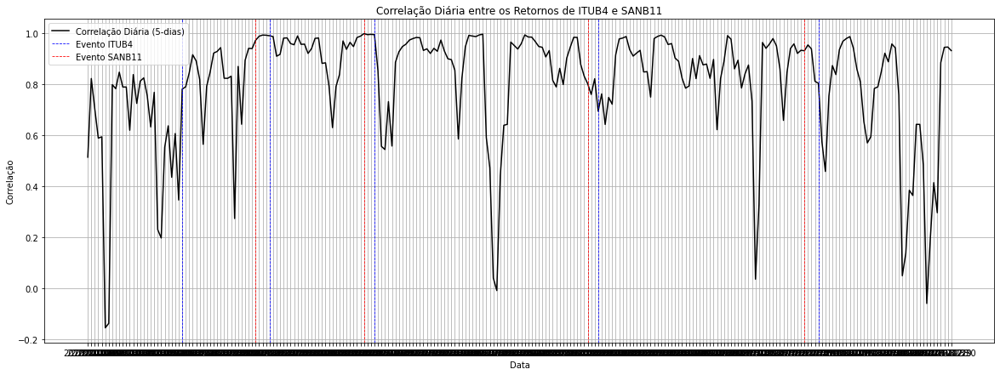

Datas das publicações 'ITUB4':
2020-02-10
2020-03-18
2020-05-04
2020-08-03
2020-11-03

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29
2020-10-27
Setor Bancário


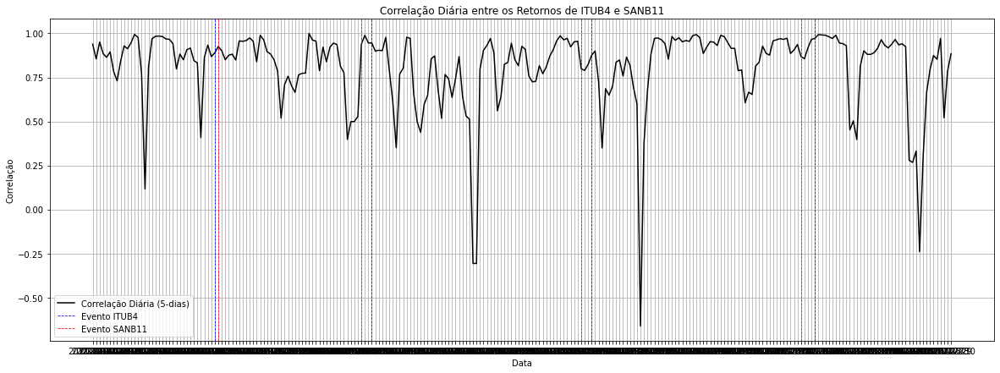

Datas das publicações 'ITUB4':
2021-02-25
2021-05-03
2021-08-02
2021-11-03

Datas das publicações 'SANB11':
2021-02-26
2021-04-28
2021-07-28
2021-10-27
Setor Bancário


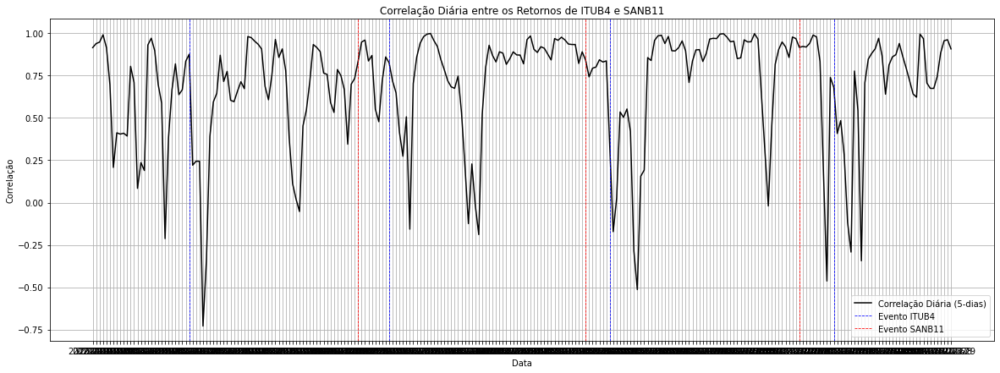

Datas das publicações 'ITUB4':
2022-02-10
2022-05-09
2022-08-08
2022-11-10

Datas das publicações 'SANB11':
2022-04-26
2022-07-28
2022-10-26
Setor Bancário


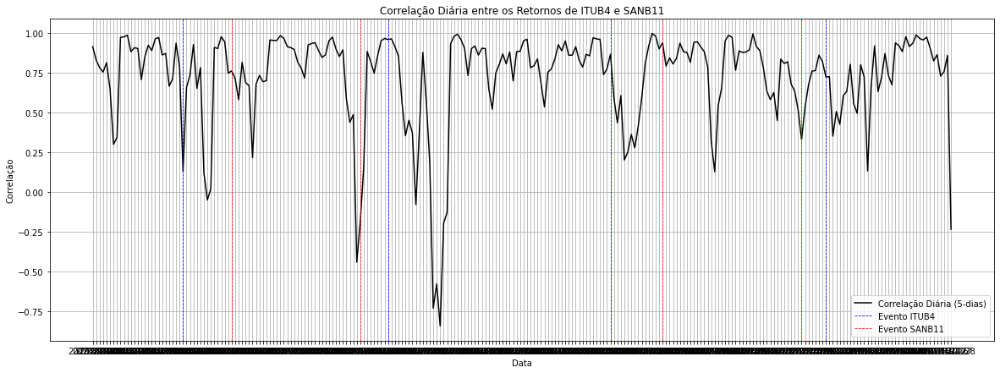

Datas das publicações 'ITUB4':
2023-02-07
2023-05-08
2023-08-07
2023-11-06

Datas das publicações 'SANB11':
2023-03-01
2023-04-25
2023-08-28
2023-10-25


In [113]:
# Chamada da função
for a in range(2018,2024):
   #print("Setor de Aviação")
   #corr_pair("GOLL4", "AZUL4", f'{a}-01-01', f'{a}-12-31', '30')
   print("Setor Bancário")
   #corr_pair("ITUB4", "BBDC4", f'{a}-01-01', f'{a}-12-31', '30')
   #corr_pair("BBAS3", "SANB11", f'{a}-01-01', f'{a}-12-31', '30')
   corr_pair("ITUB4", "SANB11", f'{a}-01-01', f'{a}-12-31', '5')





Ano: 2018
Setor de Aviação


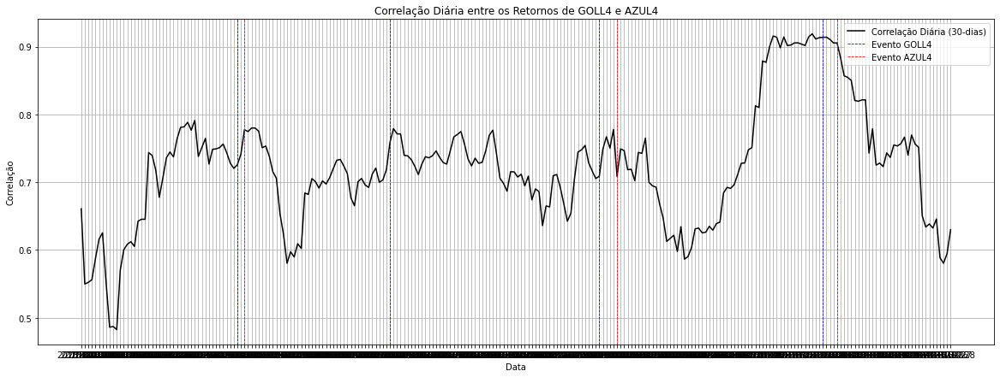

Datas das publicações 'GOLL4':
2018-03-07
2018-05-09
2018-08-02
2018-11-01

Datas das publicações 'AZUL4':
2018-03-09
2018-08-09
2018-11-08
############################################################
Setor Bancário


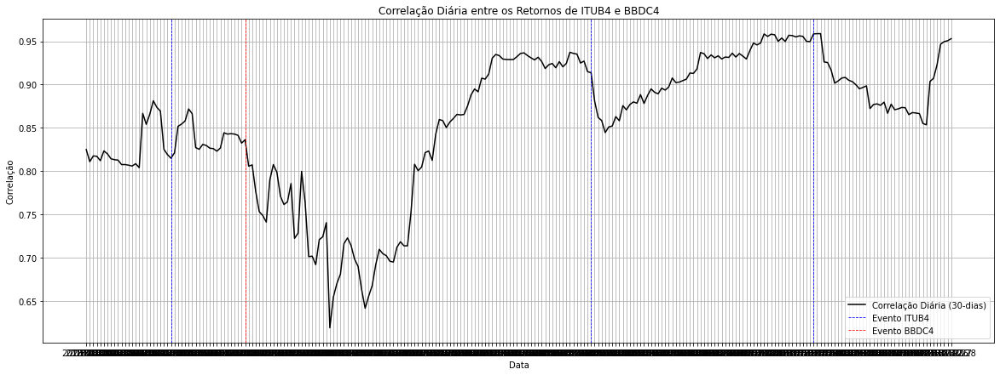

Datas das publicações 'ITUB4':
2018-02-05
2018-07-30
2018-10-29

Datas das publicações 'BBDC4':
2018-03-08


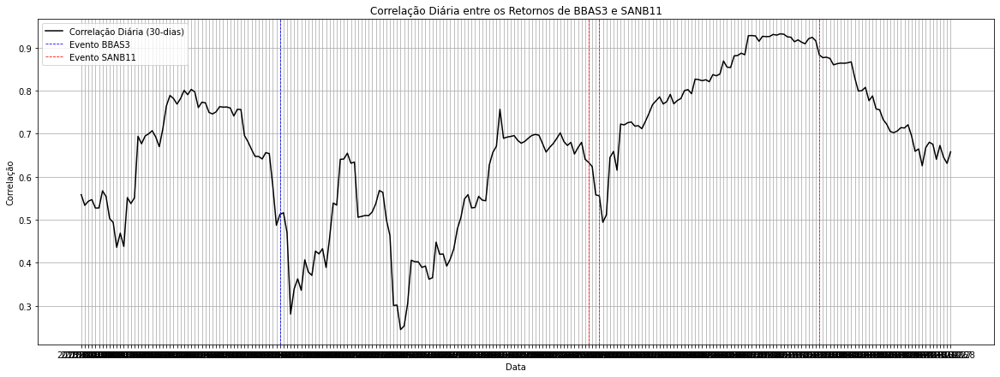

Datas das publicações 'BBAS3':
2018-03-23

Datas das publicações 'SANB11':
2018-07-30
2018-08-02
2018-10-31
############################################################
Setor de Energia Elétrica


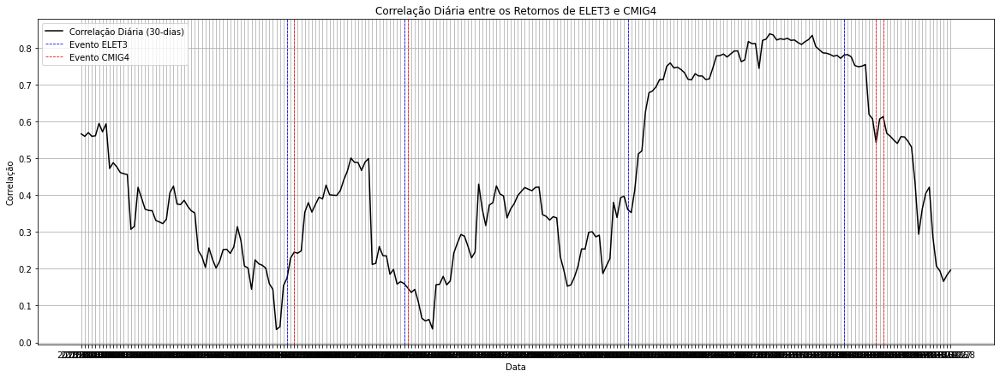

Datas das publicações 'ELET3':
2018-03-27
2018-05-15
2018-08-14
2018-11-12

Datas das publicações 'CMIG4':
2018-03-29
2018-05-16
2018-11-27
2018-11-29


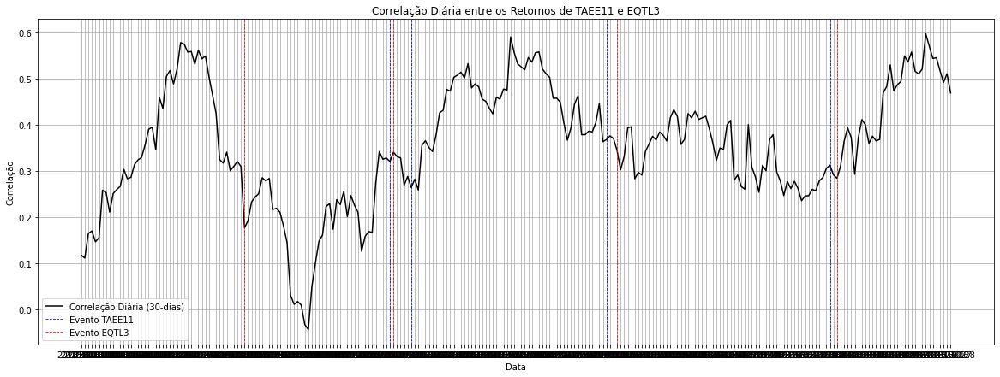

Datas das publicações 'TAEE11':
2018-05-09
2018-05-17
2018-08-06
2018-11-06

Datas das publicações 'EQTL3':
2018-03-09
2018-05-10
2018-08-09
2018-11-08
############################################################
Setor de Siderurgia e Mineração


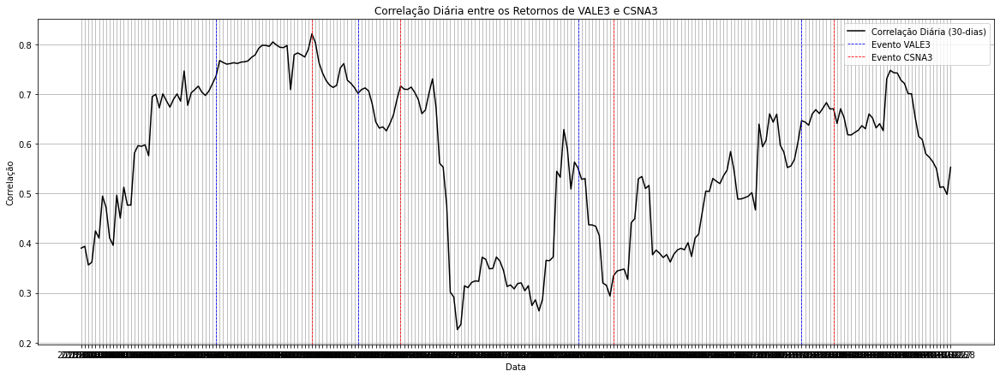

Datas das publicações 'VALE3':
2018-02-27
2018-04-25
2018-07-25
2018-10-24

Datas das publicações 'CSNA3':
2018-04-06
2018-05-14
2018-08-08
2018-11-07


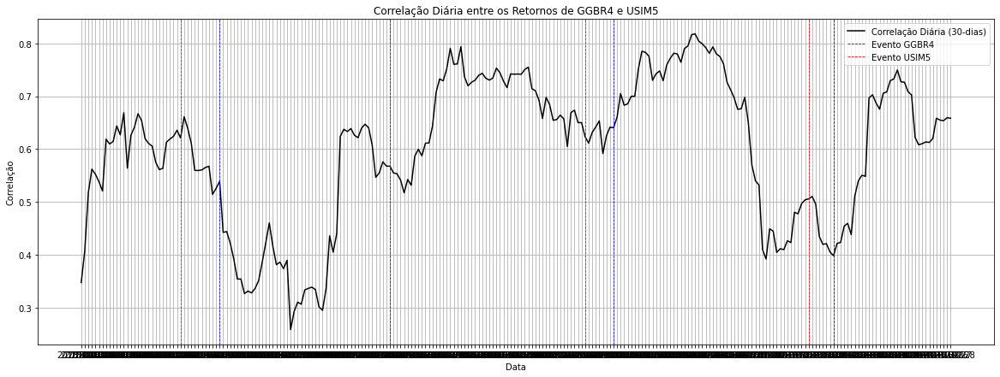

Datas das publicações 'GGBR4':
2018-02-28
2018-05-09
2018-08-08
2018-11-07

Datas das publicações 'USIM5':
2018-02-09
2018-05-09
2018-07-27
2018-10-26
############################################################
Setor de Varejo


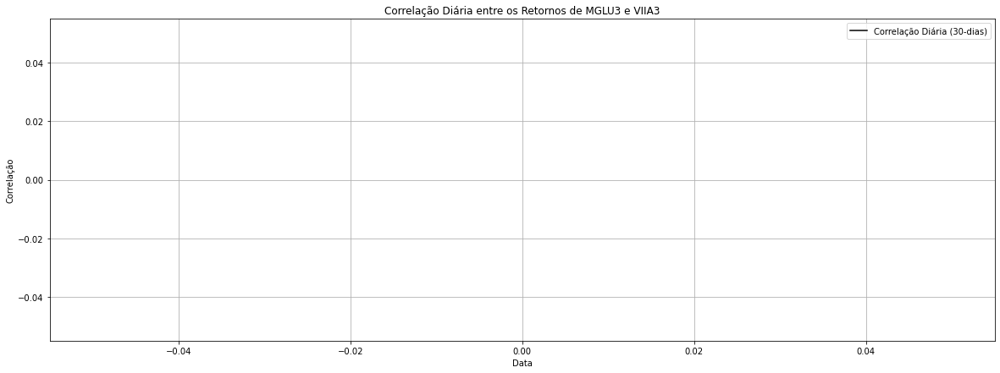

Datas das publicações 'MGLU3':

Datas das publicações 'VIIA3':
Erro na correlação do setor de varejo em 2018: [Errno 2] No such file or directory: 'dataset/prices_processed/AMER3.SA.csv'
############################################################
Setor de Papel e Celulose


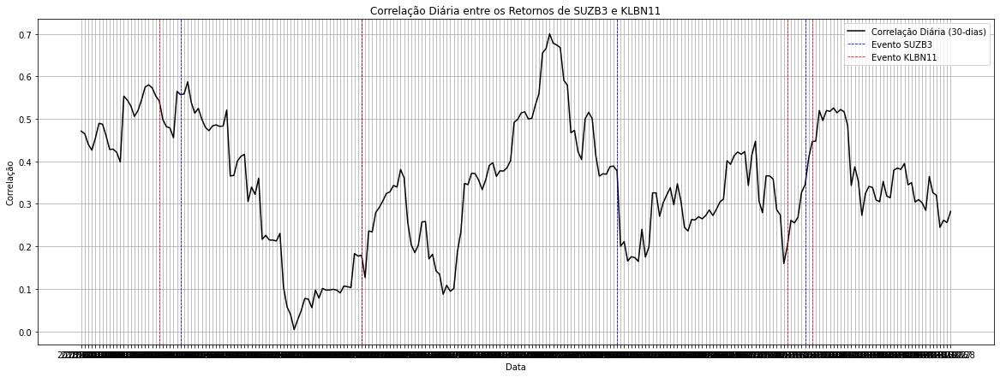

Datas das publicações 'SUZB3':
2018-02-09
2018-04-26
2018-08-09
2018-10-25

Datas das publicações 'KLBN11':
2018-02-01
2018-04-26
2018-10-18
2018-10-29
############################################################
Setor de Petróleo e Gás


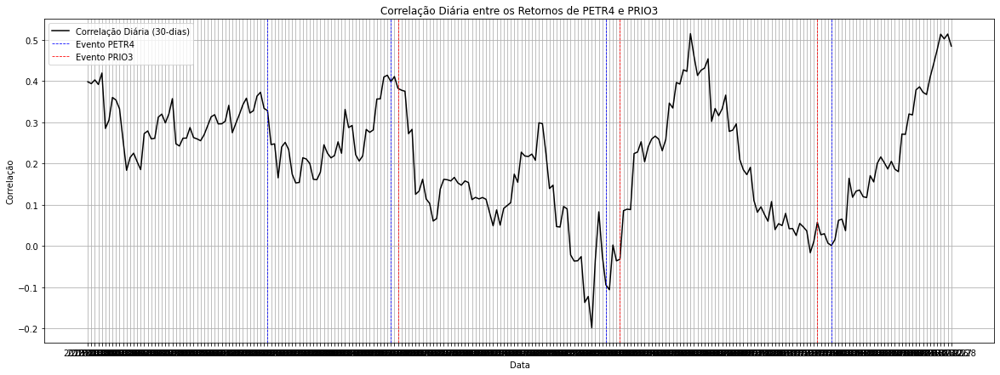

Datas das publicações 'PETR4':
2018-03-16
2018-05-08
2018-08-03
2018-11-06

Datas das publicações 'PRIO3':
2018-05-10
2018-08-09
2018-10-30


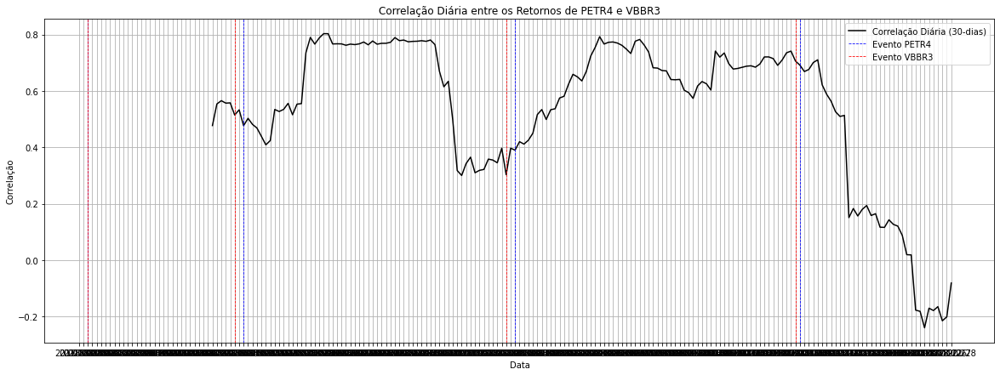

Datas das publicações 'PETR4':
2018-03-16
2018-05-08
2018-08-03
2018-11-06

Datas das publicações 'VBBR3':
2018-03-16
2018-05-04
2018-08-01
2018-11-05


Ano: 2019
Setor de Aviação


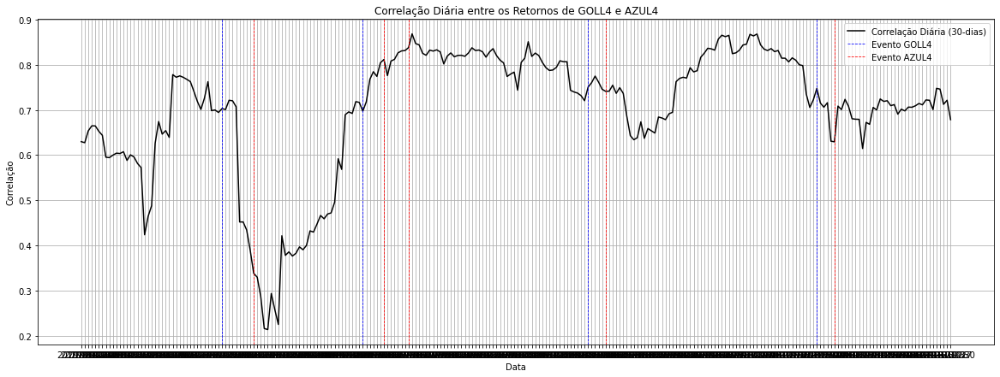

Datas das publicações 'GOLL4':
2019-02-28
2019-04-30
2019-08-01
2019-10-31

Datas das publicações 'AZUL4':
2019-03-15
2019-05-09
2019-05-20
2019-08-08
2019-11-07
############################################################
Setor Bancário


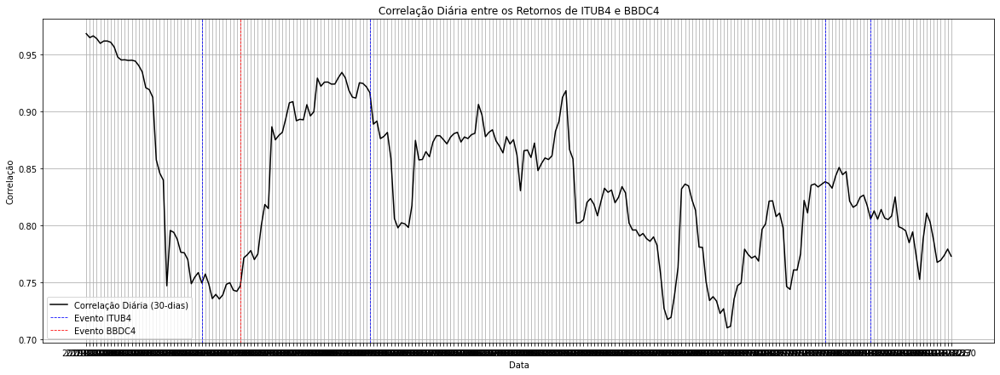

Datas das publicações 'ITUB4':
2019-02-19
2019-05-02
2019-11-04
2019-11-25

Datas das publicações 'BBDC4':
2019-03-08


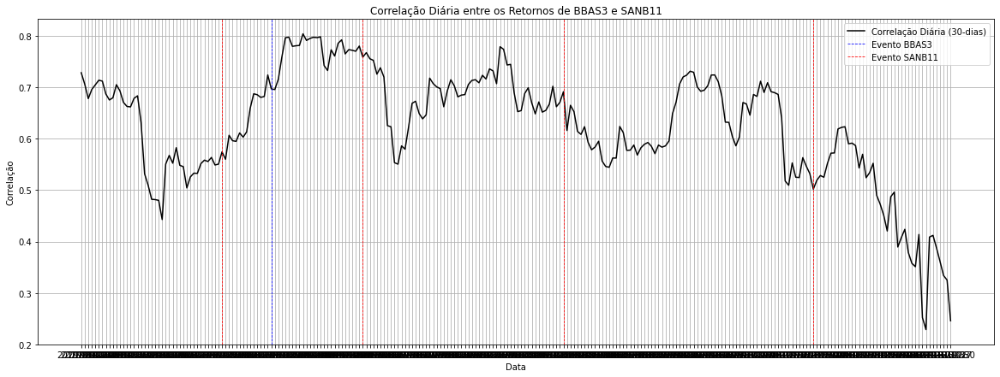

Datas das publicações 'BBAS3':
2019-03-22

Datas das publicações 'SANB11':
2019-02-28
2019-04-30
2019-07-23
2019-10-30
############################################################
Setor de Energia Elétrica


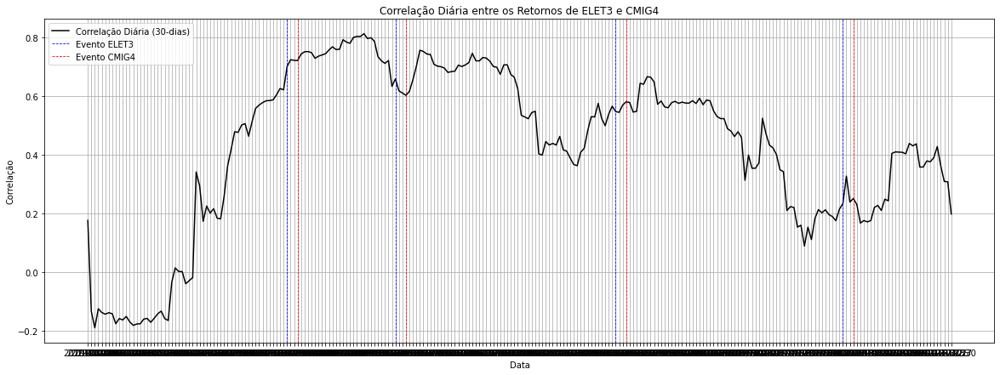

Datas das publicações 'ELET3':
2019-03-27
2019-05-13
2019-08-12
2019-11-11

Datas das publicações 'CMIG4':
2019-04-01
2019-05-16
2019-08-15
2019-11-14


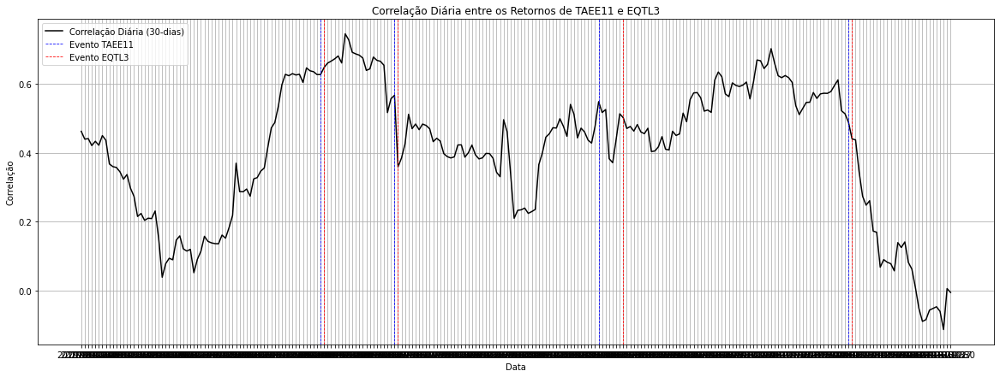

Datas das publicações 'TAEE11':
2019-04-11
2019-05-14
2019-08-06
2019-11-13

Datas das publicações 'EQTL3':
2019-04-12
2019-05-15
2019-08-15
2019-11-14
############################################################
Setor de Siderurgia e Mineração


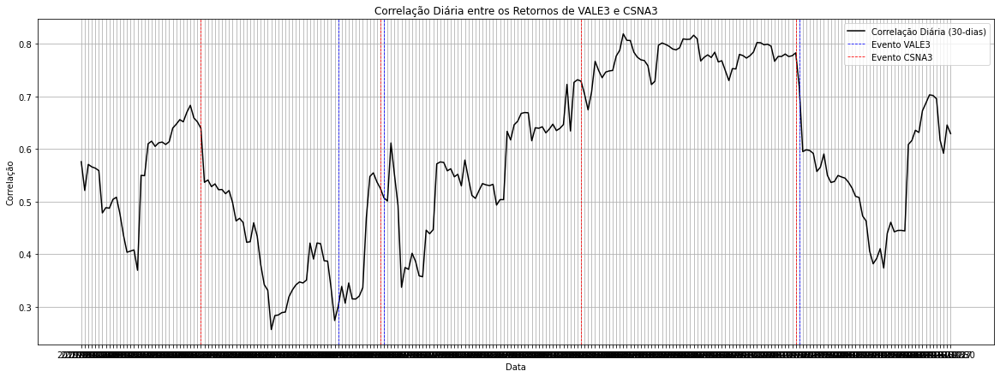

Datas das publicações 'VALE3':
2019-04-18
2019-05-09
2019-10-24

Datas das publicações 'CSNA3':
2019-02-20
2019-05-08
2019-07-30
2019-10-23


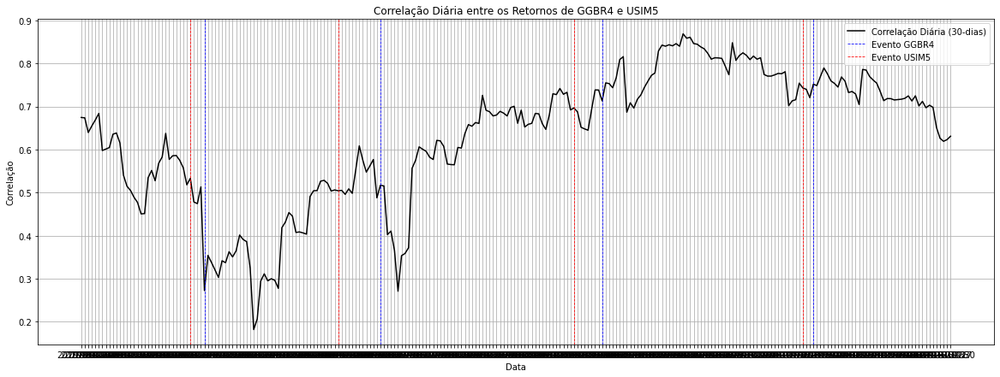

Datas das publicações 'GGBR4':
2019-02-21
2019-05-08
2019-08-07
2019-10-30

Datas das publicações 'USIM5':
2019-02-15
2019-04-18
2019-07-26
2019-10-25
############################################################
Setor de Varejo


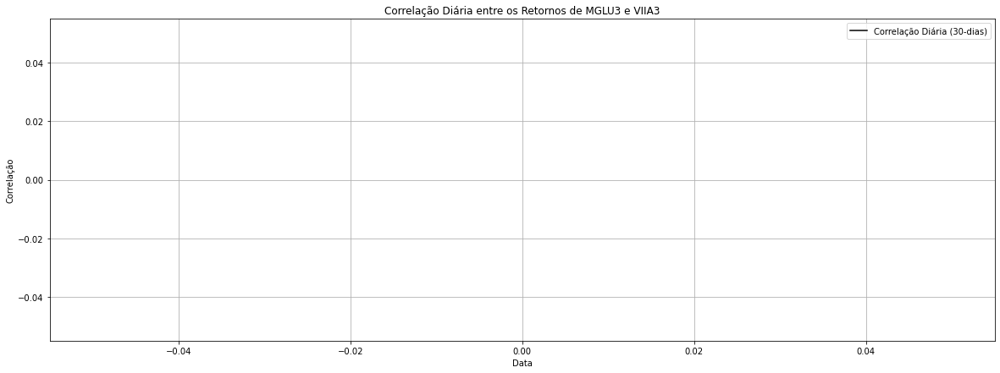

Datas das publicações 'MGLU3':

Datas das publicações 'VIIA3':
Erro na correlação do setor de varejo em 2019: [Errno 2] No such file or directory: 'dataset/prices_processed/AMER3.SA.csv'
############################################################
Setor de Papel e Celulose


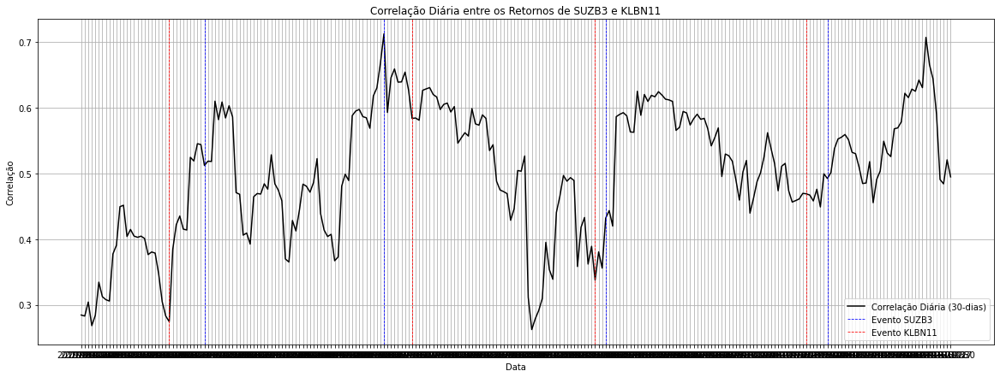

Datas das publicações 'SUZB3':
2019-02-21
2019-05-09
2019-08-08
2019-11-05

Datas das publicações 'KLBN11':
2019-02-07
2019-05-21
2019-08-05
2019-10-28
############################################################
Setor de Petróleo e Gás


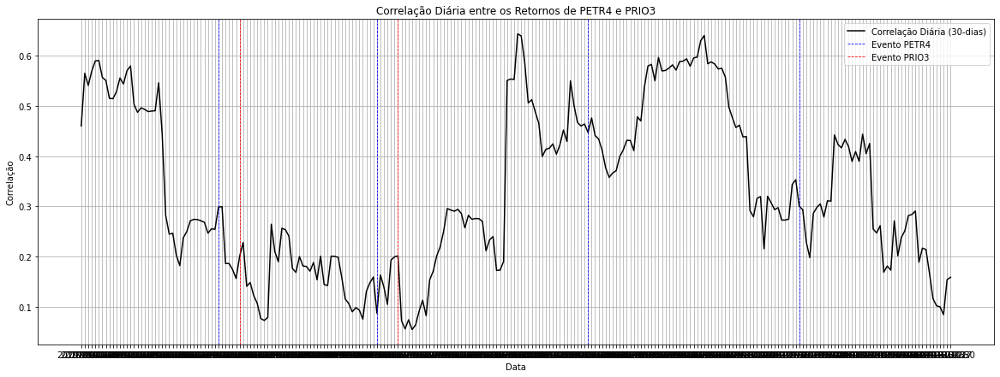

Datas das publicações 'PETR4':
2019-02-27
2019-05-07
2019-08-01
2019-10-24

Datas das publicações 'PRIO3':
2019-03-11
2019-05-15


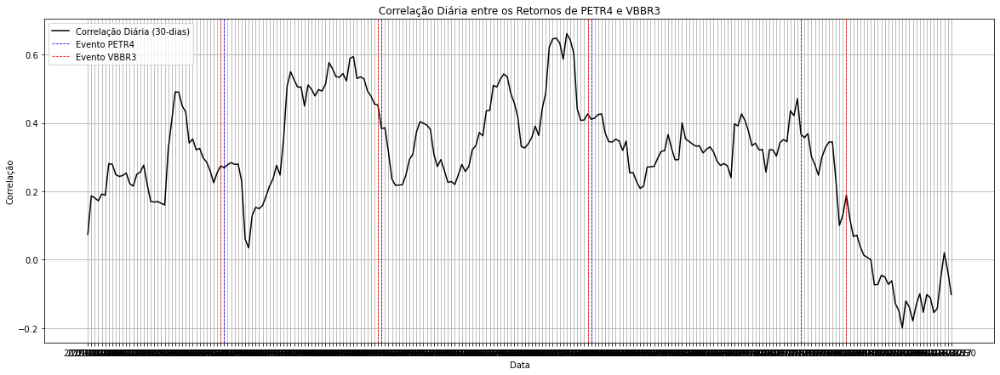

Datas das publicações 'PETR4':
2019-02-27
2019-05-07
2019-08-01
2019-10-24

Datas das publicações 'VBBR3':
2019-02-26
2019-05-06
2019-07-31
2019-11-12


Ano: 2020
Setor de Aviação


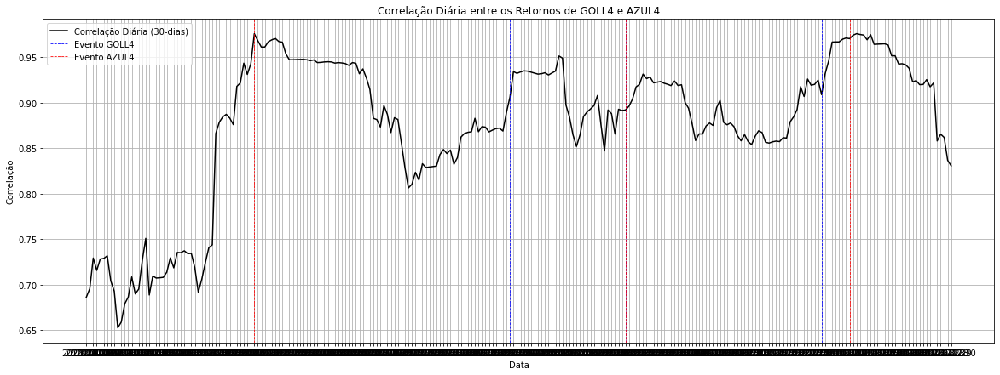

Datas das publicações 'GOLL4':
2020-02-28
2020-06-29
2020-08-13
2020-11-04

Datas das publicações 'AZUL4':
2020-03-12
2020-05-14
2020-08-13
2020-11-16
############################################################
Setor Bancário


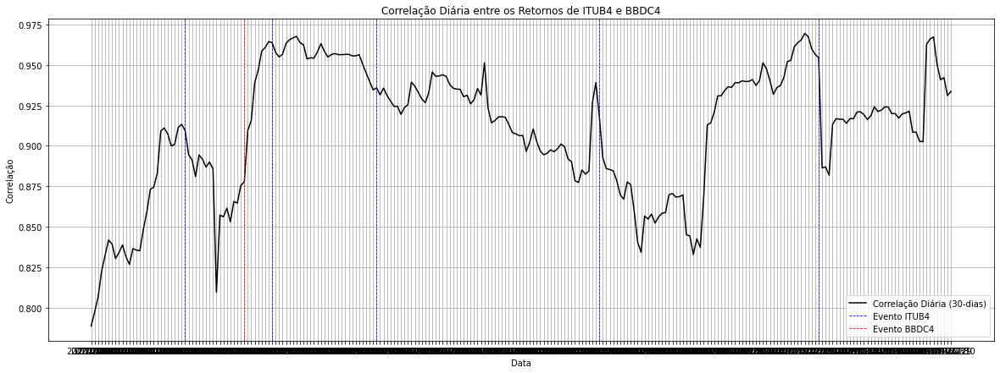

Datas das publicações 'ITUB4':
2020-02-10
2020-03-18
2020-05-04
2020-08-03
2020-11-03

Datas das publicações 'BBDC4':
2020-03-06


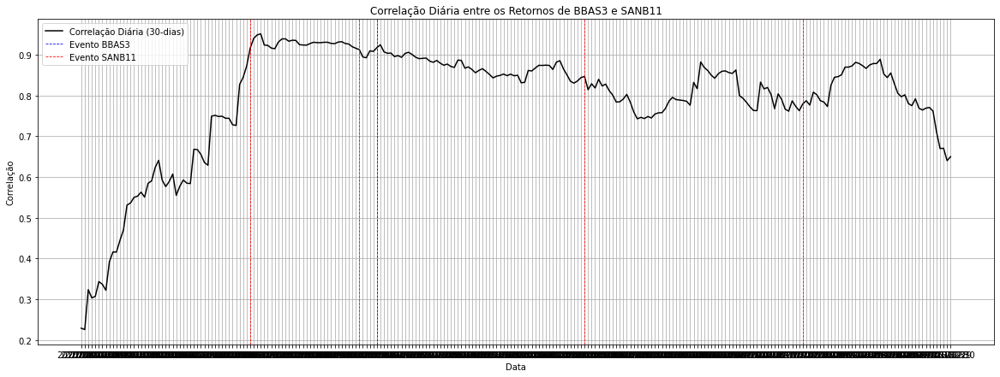

Datas das publicações 'BBAS3':
2020-05-06

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29
2020-10-27
############################################################
Setor de Energia Elétrica


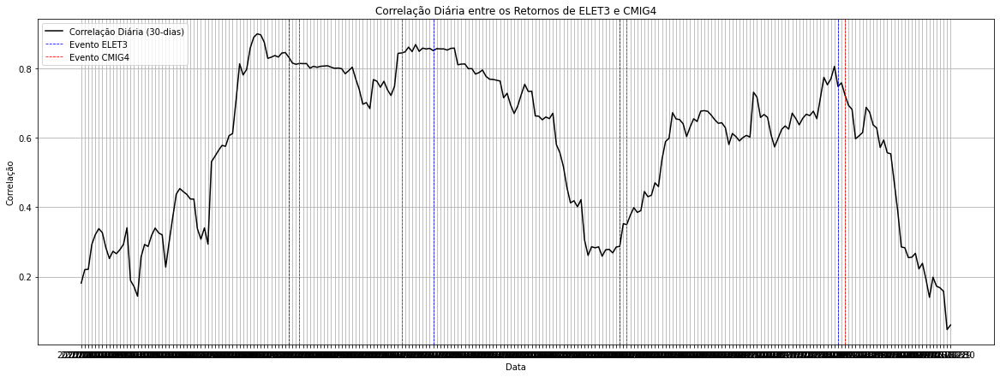

Datas das publicações 'ELET3':
2020-03-27
2020-05-28
2020-08-12
2020-11-11

Datas das publicações 'CMIG4':
2020-04-01
2020-05-15
2020-08-14
2020-11-13


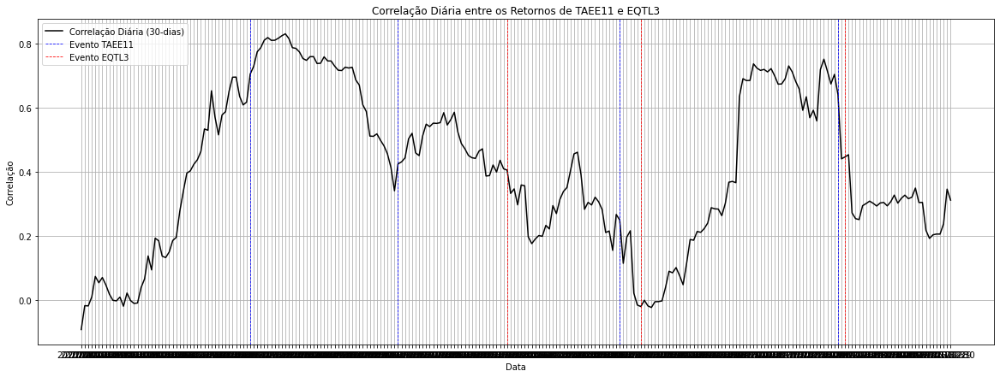

Datas das publicações 'TAEE11':
2020-03-12
2020-05-14
2020-08-12
2020-11-11

Datas das publicações 'EQTL3':
2020-06-29
2020-08-20
2020-11-13
############################################################
Setor de Siderurgia e Mineração


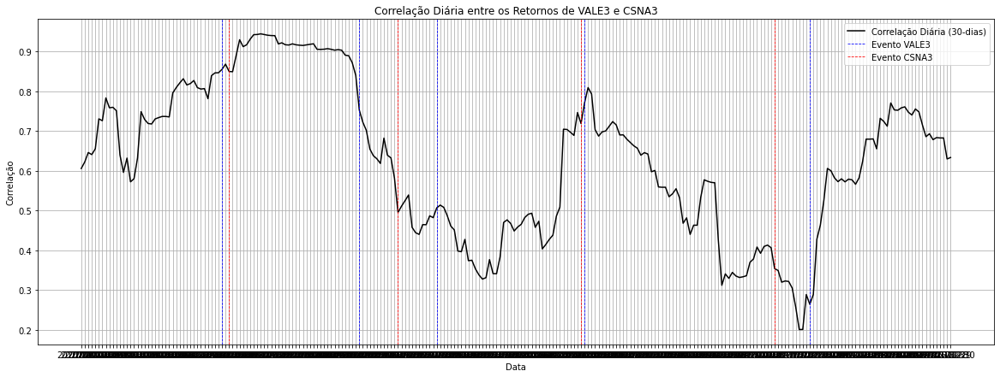

Datas das publicações 'VALE3':
2020-03-02
2020-04-28
2020-05-29
2020-07-29
2020-10-29

Datas das publicações 'CSNA3':
2020-03-04
2020-05-14
2020-07-28
2020-10-15


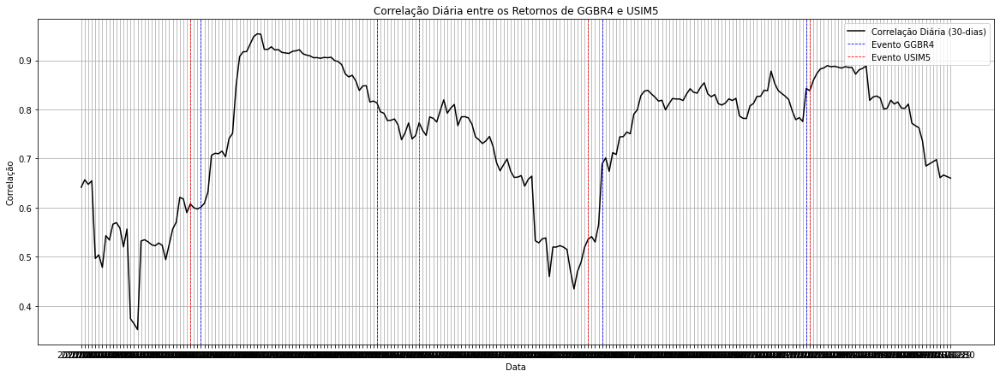

Datas das publicações 'GGBR4':
2020-02-19
2020-05-06
2020-08-05
2020-10-28

Datas das publicações 'USIM5':
2020-02-14
2020-05-22
2020-07-30
2020-10-29
############################################################
Setor de Varejo


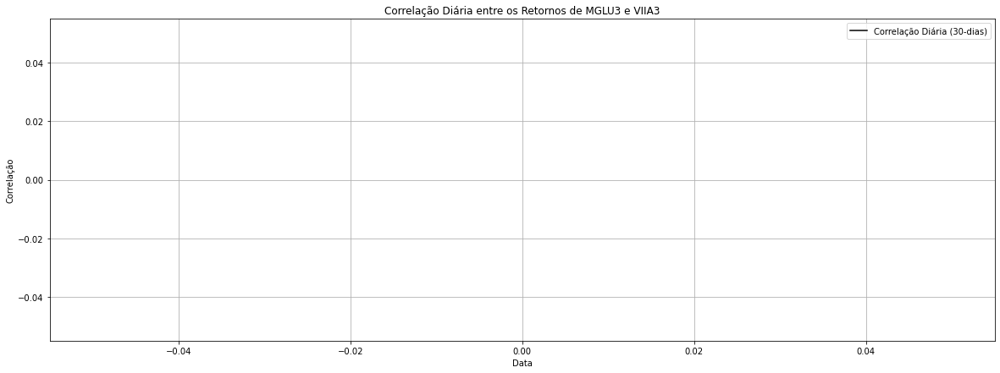

Datas das publicações 'MGLU3':

Datas das publicações 'VIIA3':
Erro na correlação do setor de varejo em 2020: [Errno 2] No such file or directory: 'dataset/prices_processed/AMER3.SA.csv'
############################################################
Setor de Papel e Celulose


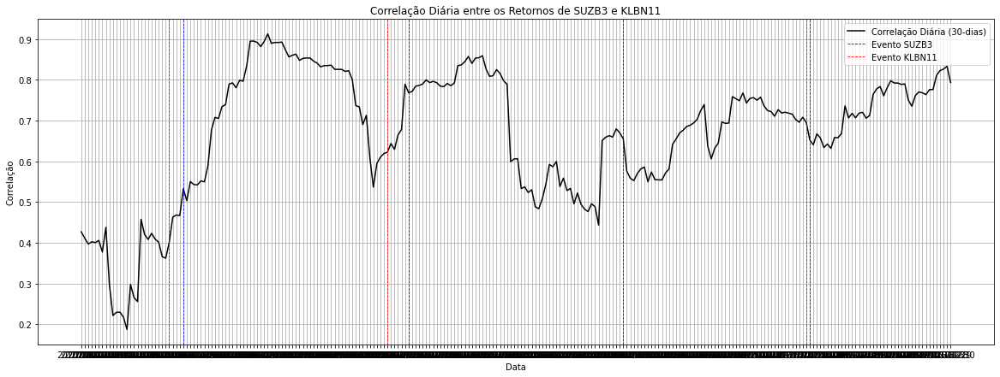

Datas das publicações 'SUZB3':
2020-02-12
2020-05-19
2020-08-13
2020-10-29

Datas das publicações 'KLBN11':
2020-02-06
2020-05-11
2020-10-28
############################################################
Setor de Petróleo e Gás


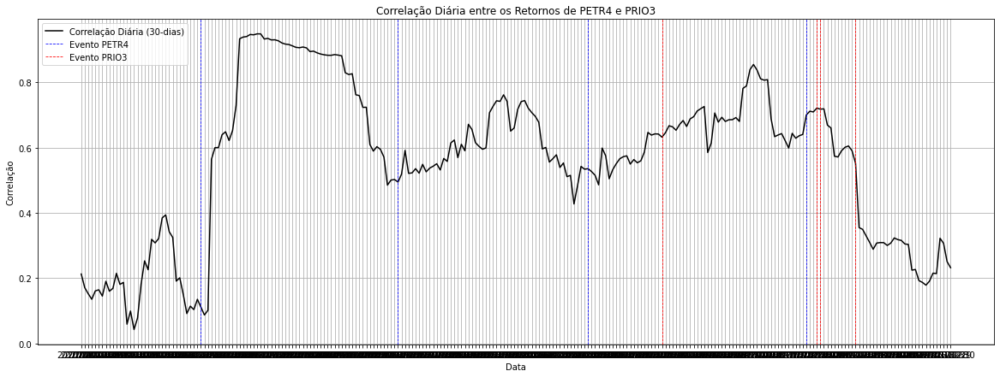

Datas das publicações 'PETR4':
2020-02-19
2020-05-14
2020-07-30
2020-10-28

Datas das publicações 'PRIO3':
2020-08-28
2020-11-03
2020-11-04
2020-11-18


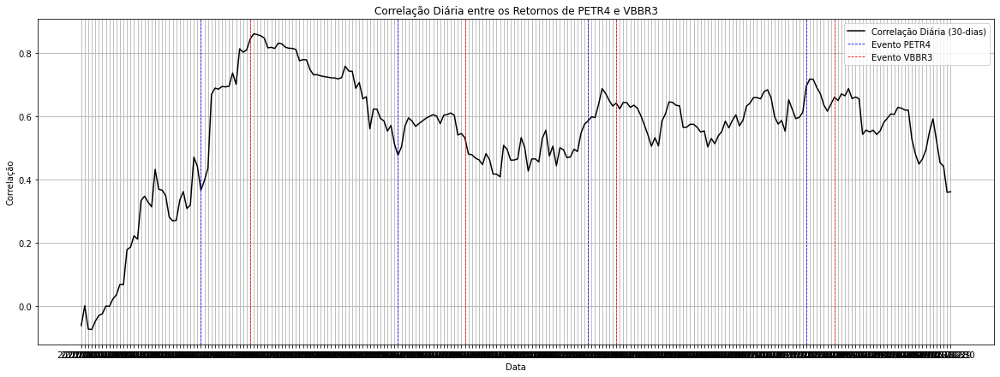

Datas das publicações 'PETR4':
2020-02-19
2020-05-14
2020-07-30
2020-10-28

Datas das publicações 'VBBR3':
2020-03-12
2020-06-10
2020-08-11
2020-11-10


Ano: 2021
Setor de Aviação


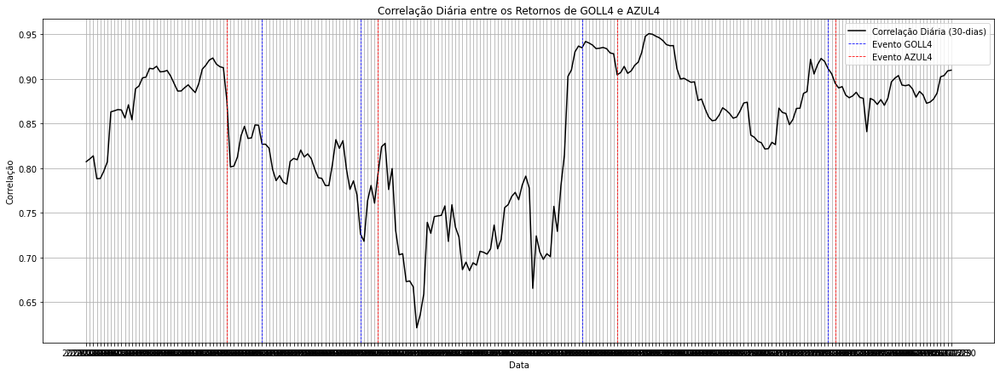

Datas das publicações 'GOLL4':
2021-03-18
2021-04-29
2021-07-29
2021-11-09

Datas das publicações 'AZUL4':
2021-03-04
2021-05-06
2021-08-12
2021-11-11
############################################################
Setor Bancário


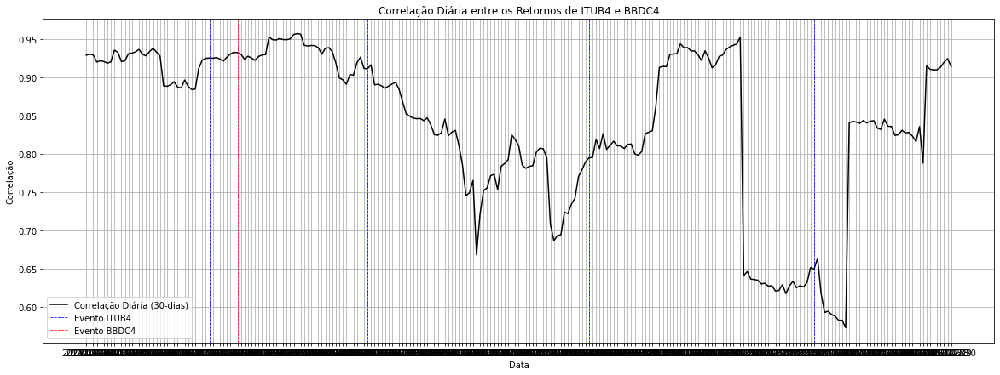

Datas das publicações 'ITUB4':
2021-02-25
2021-05-03
2021-08-02
2021-11-03

Datas das publicações 'BBDC4':
2021-03-09


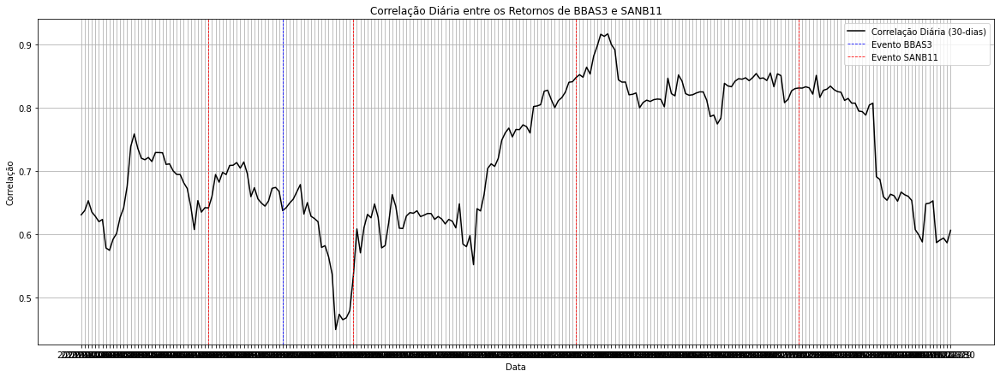

Datas das publicações 'BBAS3':
2021-03-29

Datas das publicações 'SANB11':
2021-02-26
2021-04-28
2021-07-28
2021-10-27
############################################################
Setor de Energia Elétrica


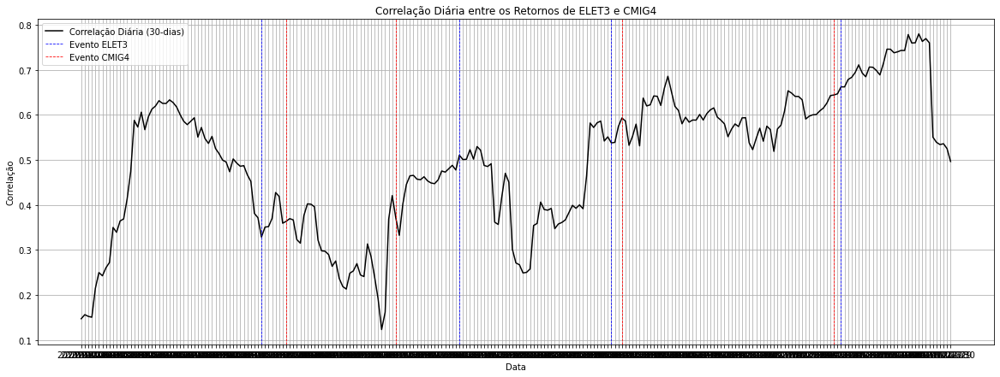

Datas das publicações 'ELET3':
2021-03-19
2021-06-10
2021-08-11
2021-11-16

Datas das publicações 'CMIG4':
2021-03-30
2021-05-14
2021-08-16
2021-11-11


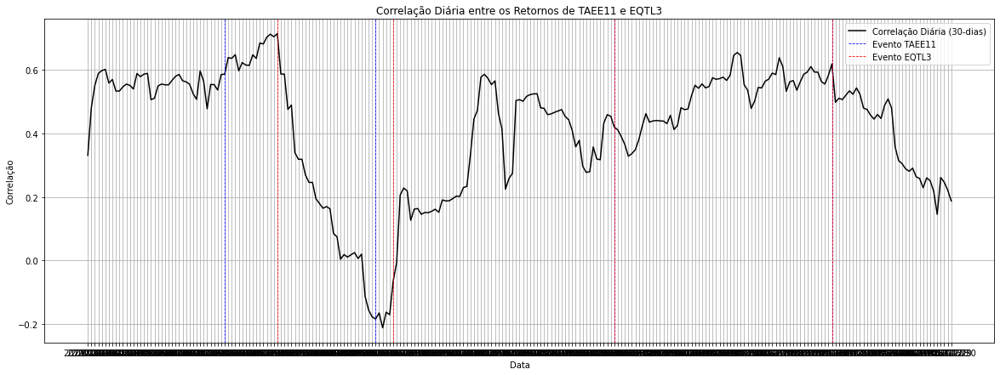

Datas das publicações 'TAEE11':
2021-03-03
2021-05-05
2021-08-11
2021-11-10

Datas das publicações 'EQTL3':
2021-03-24
2021-05-12
2021-08-11
2021-11-10
############################################################
Setor de Siderurgia e Mineração


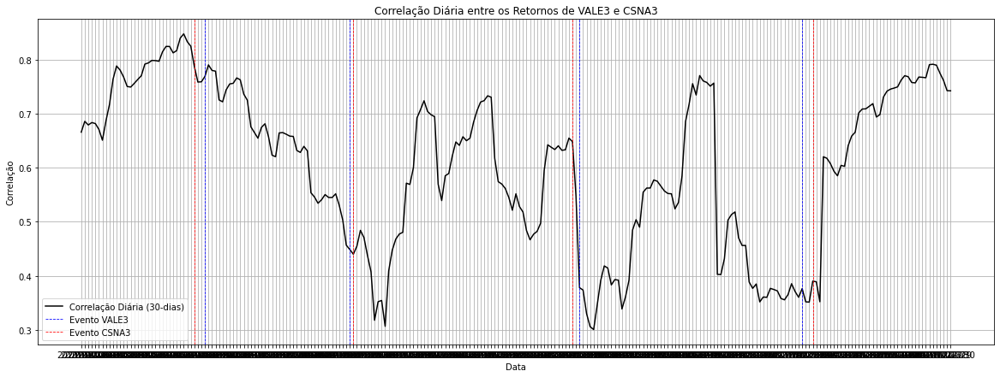

Datas das publicações 'VALE3':
2021-02-25
2021-04-27
2021-07-29
2021-10-28

Datas das publicações 'CSNA3':
2021-02-22
2021-04-28
2021-07-27
2021-11-03


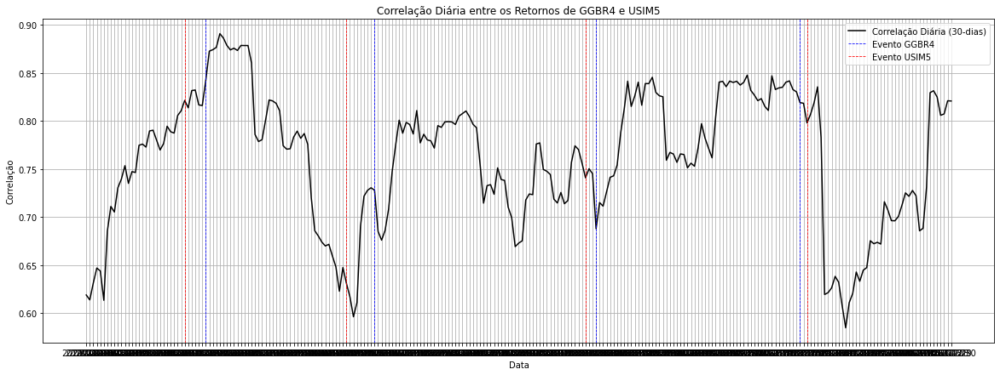

Datas das publicações 'GGBR4':
2021-02-24
2021-05-05
2021-08-04
2021-10-27

Datas das publicações 'USIM5':
2021-02-12
2021-04-23
2021-07-30
2021-10-29
############################################################
Setor de Varejo


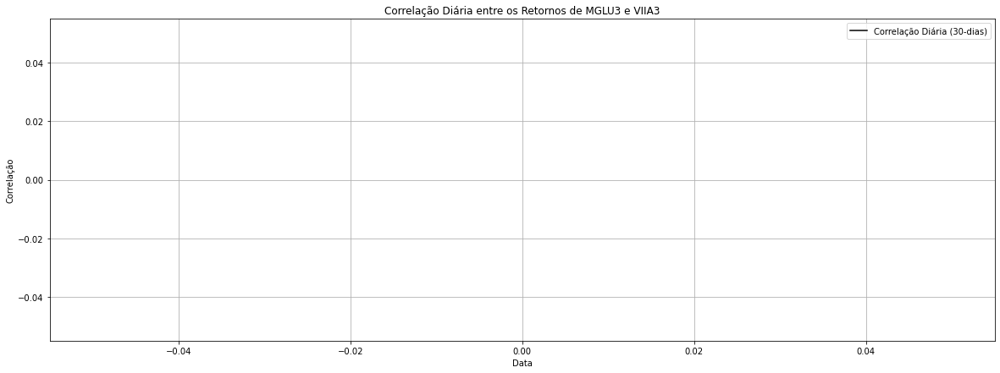

Datas das publicações 'MGLU3':

Datas das publicações 'VIIA3':
Erro na correlação do setor de varejo em 2021: [Errno 2] No such file or directory: 'dataset/prices_processed/AMER3.SA.csv'
############################################################
Setor de Papel e Celulose


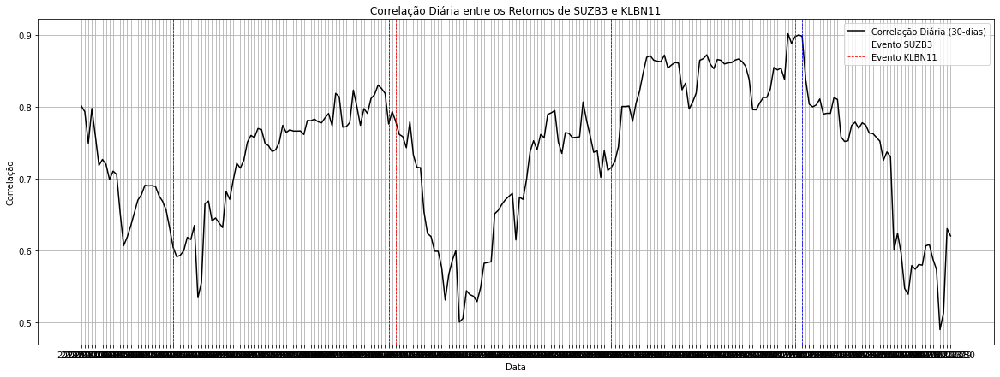

Datas das publicações 'SUZB3':
2021-02-10
2021-05-12
2021-08-11
2021-10-28

Datas das publicações 'KLBN11':
2021-02-10
2021-05-14
2021-08-11
2021-10-26
############################################################
Setor de Petróleo e Gás


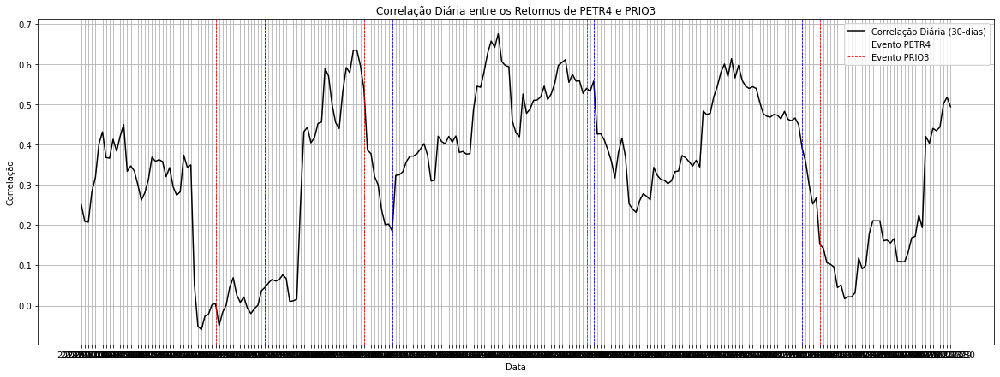

Datas das publicações 'PETR4':
2021-03-22
2021-05-13
2021-08-04
2021-10-28

Datas das publicações 'PRIO3':
2021-03-02
2021-05-03
2021-08-02
2021-11-05


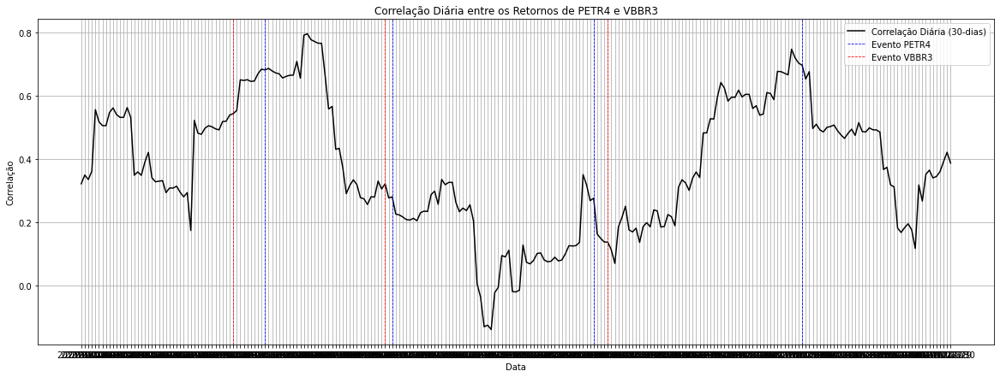

Datas das publicações 'PETR4':
2021-03-22
2021-05-13
2021-08-04
2021-10-28

Datas das publicações 'VBBR3':
2021-03-09
2021-05-11
2021-08-10


Ano: 2022
Setor de Aviação


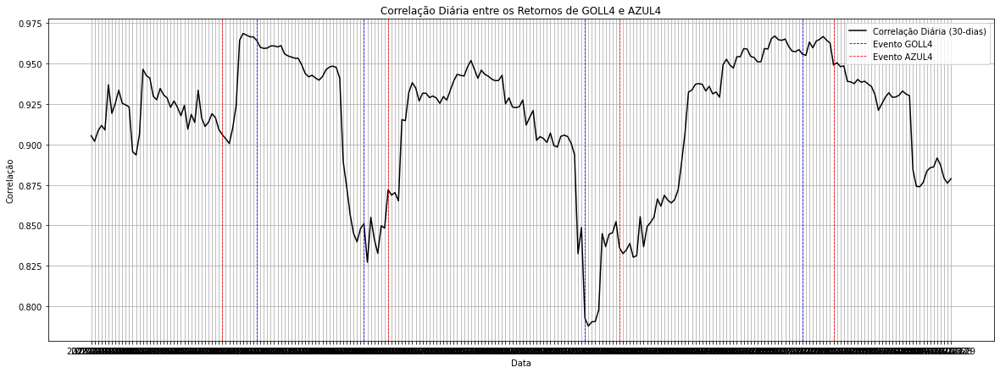

Datas das publicações 'GOLL4':
2022-03-14
2022-04-28
2022-07-28
2022-10-27

Datas das publicações 'AZUL4':
2022-02-24
2022-05-09
2022-08-11
2022-11-10
############################################################
Setor Bancário


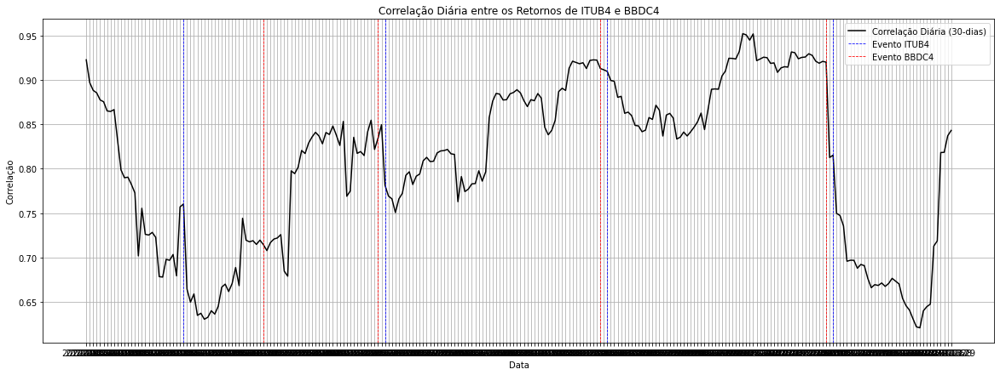

Datas das publicações 'ITUB4':
2022-02-10
2022-05-09
2022-08-08
2022-11-10

Datas das publicações 'BBDC4':
2022-03-17
2022-05-05
2022-08-04
2022-11-08


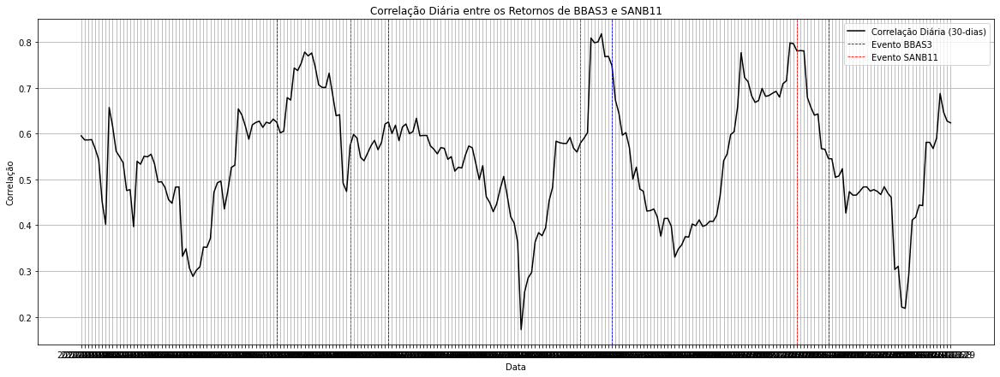

Datas das publicações 'BBAS3':
2022-03-24
2022-05-11
2022-08-10
2022-11-09

Datas das publicações 'SANB11':
2022-04-26
2022-07-28
2022-10-26
############################################################
Setor de Energia Elétrica


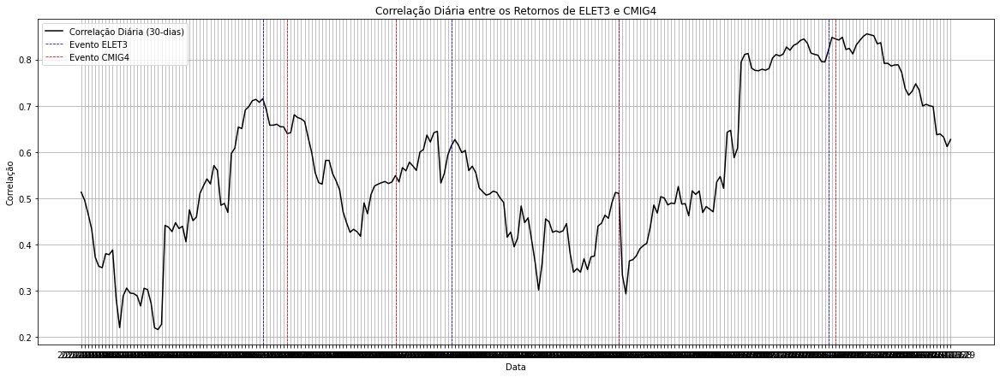

Datas das publicações 'ELET3':
2022-03-18
2022-06-06
2022-08-12
2022-11-09

Datas das publicações 'CMIG4':
2022-03-29
2022-05-13
2022-08-12
2022-11-11


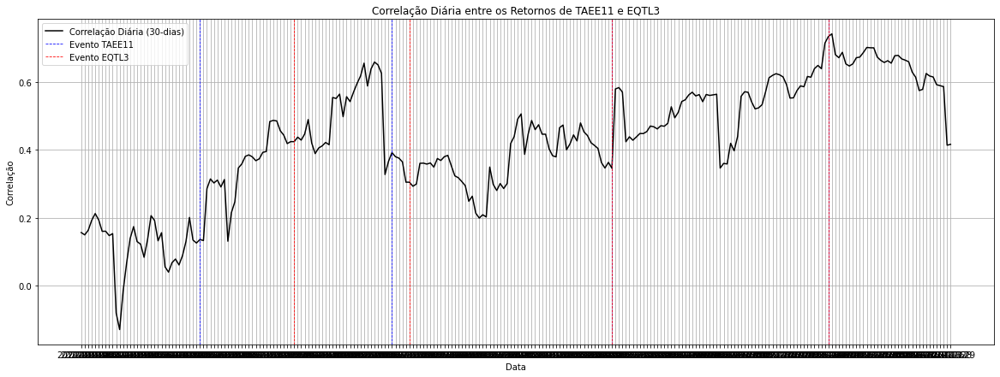

Datas das publicações 'TAEE11':
2022-02-18
2022-05-12
2022-08-10
2022-11-09

Datas das publicações 'EQTL3':
2022-03-31
2022-05-19
2022-08-10
2022-11-09
############################################################
Setor de Siderurgia e Mineração


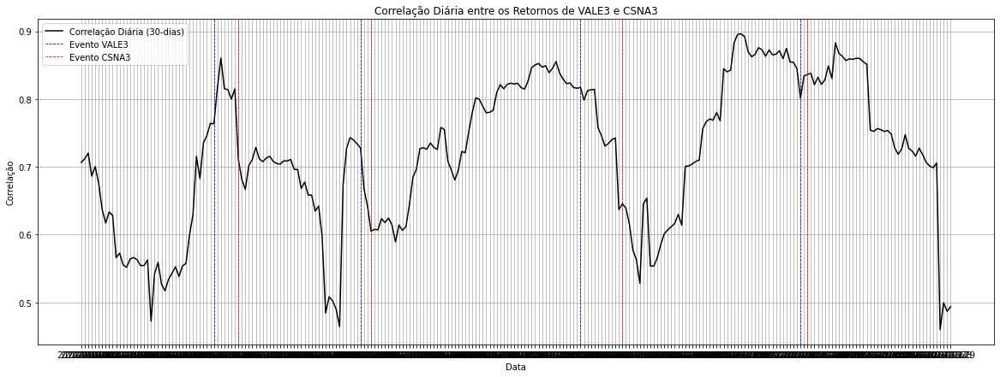

Datas das publicações 'VALE3':
2022-02-24
2022-04-29
2022-07-28
2022-10-27

Datas das publicações 'CSNA3':
2022-03-09
2022-05-04
2022-08-15
2022-10-31


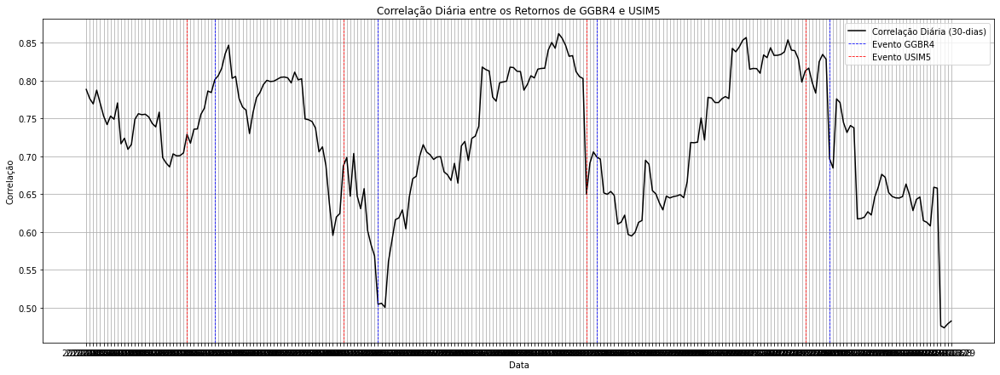

Datas das publicações 'GGBR4':
2022-02-23
2022-05-05
2022-08-03
2022-11-09

Datas das publicações 'USIM5':
2022-02-11
2022-04-20
2022-07-29
2022-10-28
############################################################
Setor de Varejo


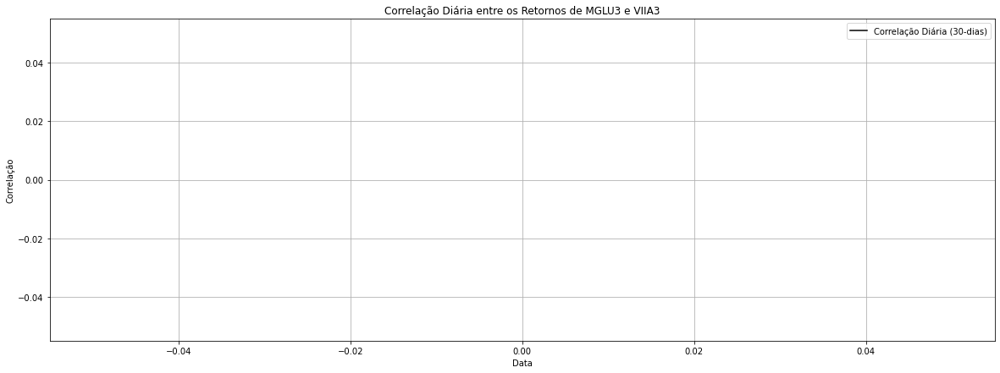

Datas das publicações 'MGLU3':

Datas das publicações 'VIIA3':
Erro na correlação do setor de varejo em 2022: [Errno 2] No such file or directory: 'dataset/prices_processed/AMER3.SA.csv'
############################################################
Setor de Papel e Celulose


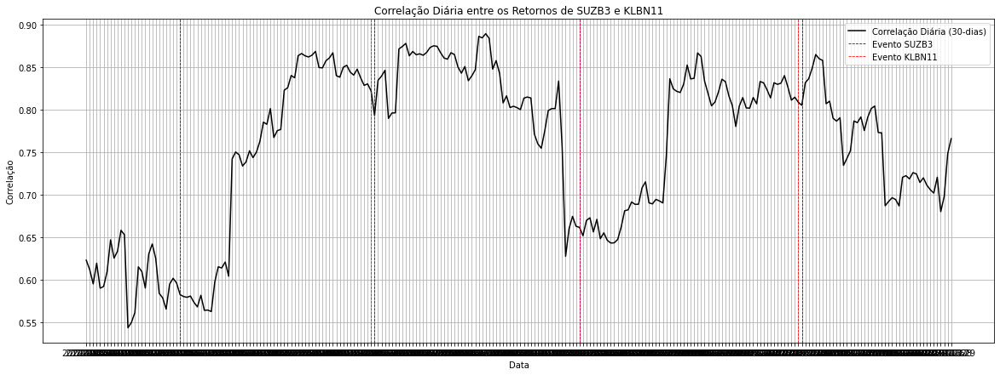

Datas das publicações 'SUZB3':
2022-02-09
2022-05-04
2022-07-27
2022-10-27

Datas das publicações 'KLBN11':
2022-05-03
2022-07-27
2022-10-26
############################################################
Setor de Petróleo e Gás


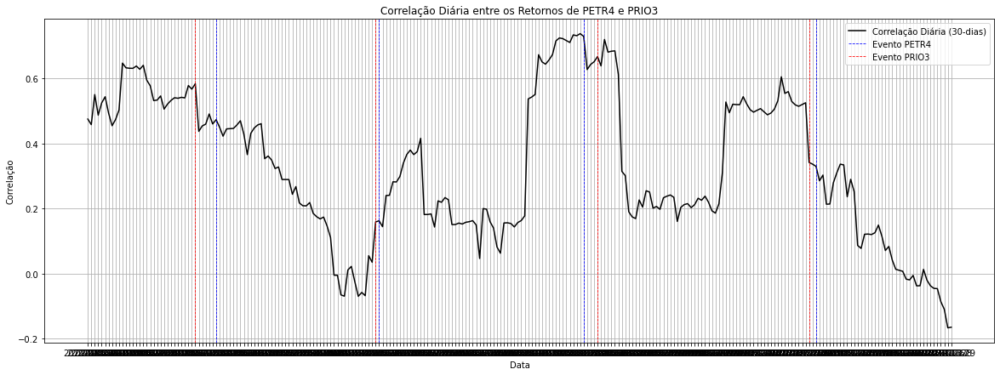

Datas das publicações 'PETR4':
2022-02-23
2022-05-05
2022-07-28
2022-11-03

Datas das publicações 'PRIO3':
2022-02-15
2022-05-04
2022-08-03
2022-10-31


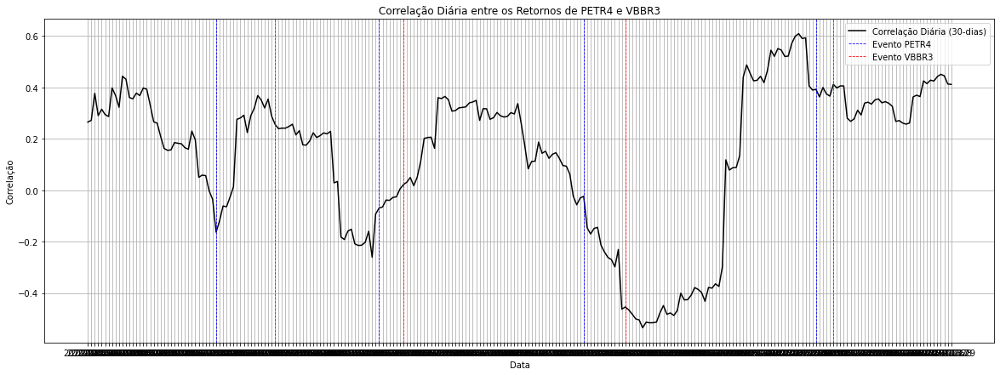

Datas das publicações 'PETR4':
2022-02-23
2022-05-05
2022-07-28
2022-11-03

Datas das publicações 'VBBR3':
2022-03-22
2022-05-16
2022-08-15
2022-11-10


Ano: 2023
Setor de Aviação


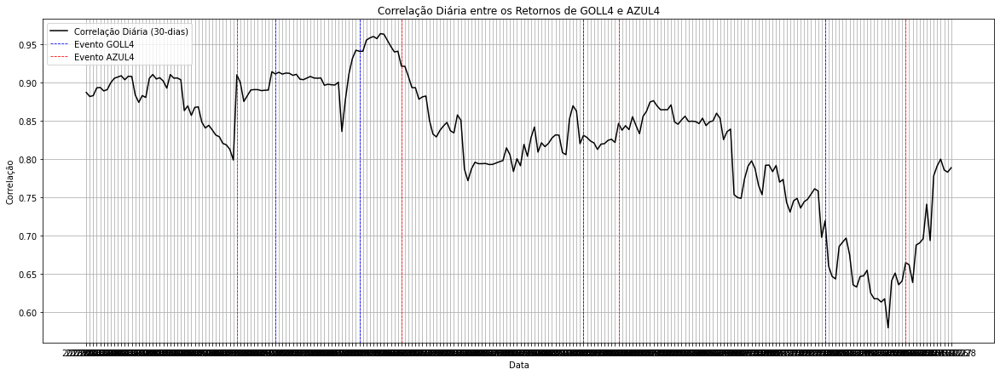

Datas das publicações 'GOLL4':
2023-03-21
2023-04-26
2023-07-27
2023-11-06

Datas das publicações 'AZUL4':
2023-03-06
2023-05-15
2023-08-10
2023-12-08
############################################################
Setor Bancário


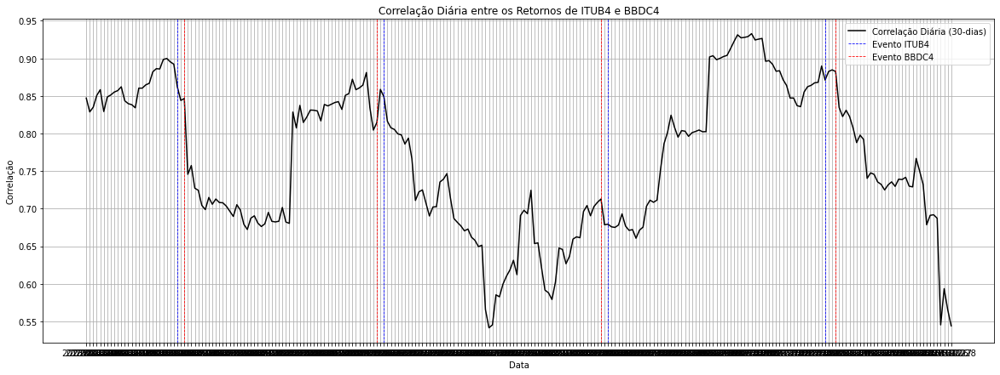

Datas das publicações 'ITUB4':
2023-02-07
2023-05-08
2023-08-07
2023-11-06

Datas das publicações 'BBDC4':
2023-02-09
2023-05-04
2023-08-03
2023-11-09


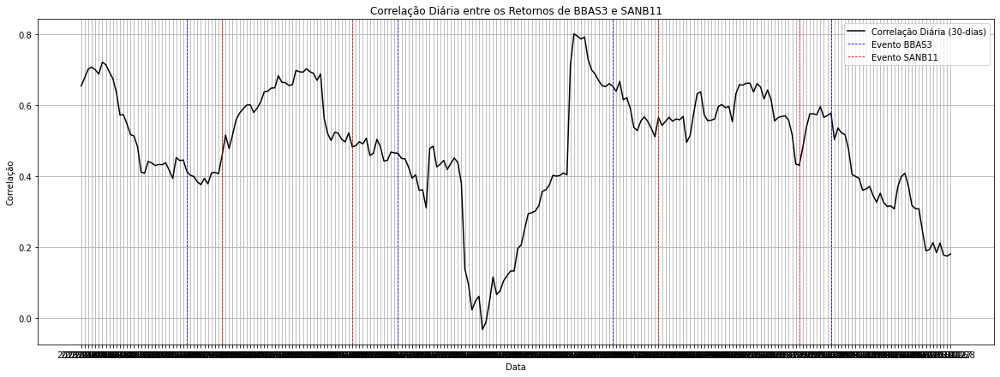

Datas das publicações 'BBAS3':
2023-02-13
2023-05-15
2023-08-09
2023-11-08

Datas das publicações 'SANB11':
2023-03-01
2023-04-25
2023-08-28
2023-10-25
############################################################
Setor de Energia Elétrica


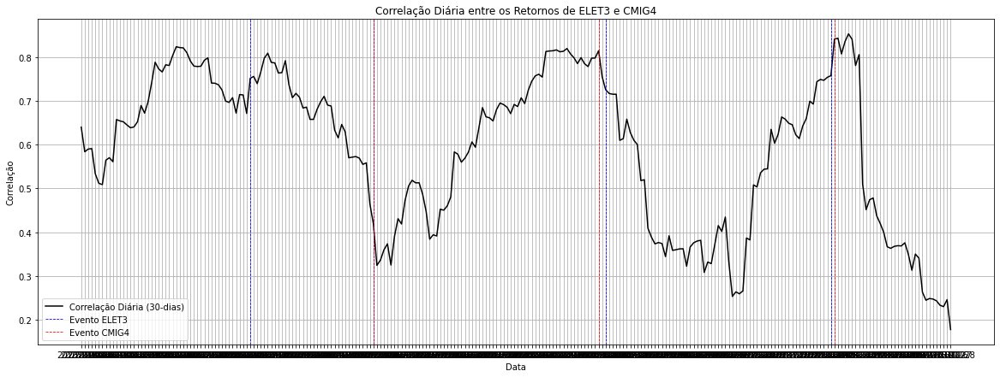

Datas das publicações 'ELET3':
2023-03-13
2023-05-04
2023-08-07
2023-11-08

Datas das publicações 'CMIG4':
2023-05-04
2023-08-03
2023-11-09


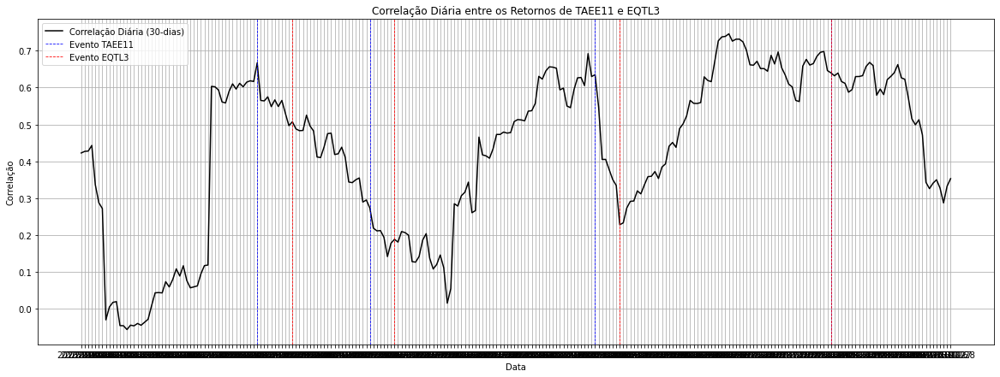

Datas das publicações 'TAEE11':
2023-03-15
2023-05-03
2023-08-02
2023-11-08

Datas das publicações 'EQTL3':
2023-03-29
2023-05-12
2023-08-11
2023-11-08
############################################################
Setor de Siderurgia e Mineração


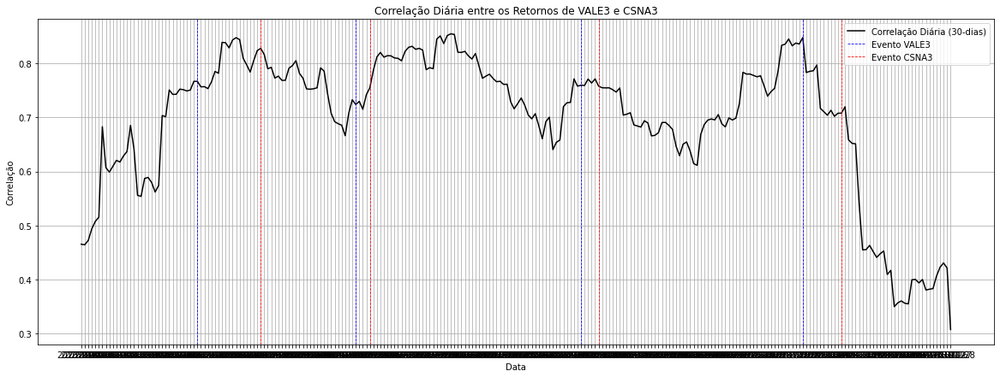

Datas das publicações 'VALE3':
2023-02-16
2023-04-26
2023-07-27
2023-10-26

Datas das publicações 'CSNA3':
2023-03-16
2023-05-03
2023-08-03
2023-11-13


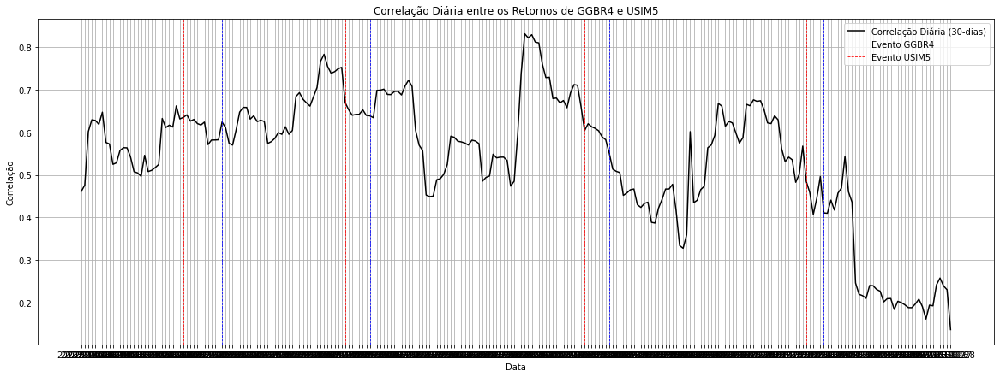

Datas das publicações 'GGBR4':
2023-03-01
2023-05-03
2023-08-08
2023-11-06

Datas das publicações 'USIM5':
2023-02-10
2023-04-20
2023-07-28
2023-10-27
############################################################
Setor de Varejo


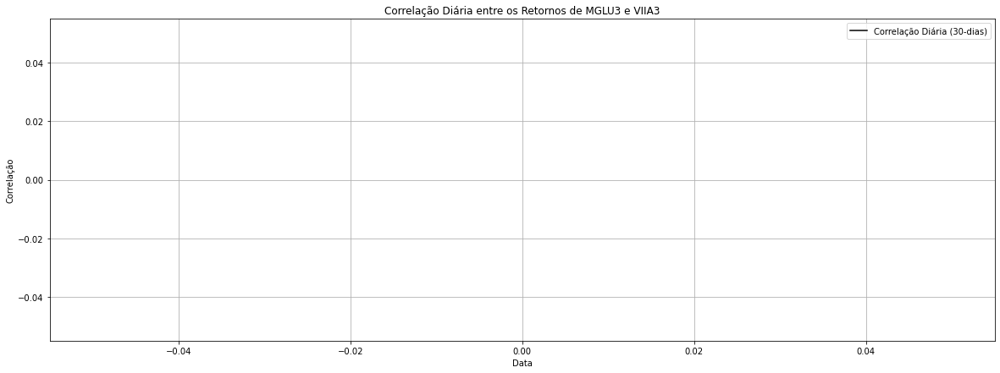

Datas das publicações 'MGLU3':

Datas das publicações 'VIIA3':
Erro na correlação do setor de varejo em 2023: [Errno 2] No such file or directory: 'dataset/prices_processed/AMER3.SA.csv'
############################################################
Setor de Papel e Celulose


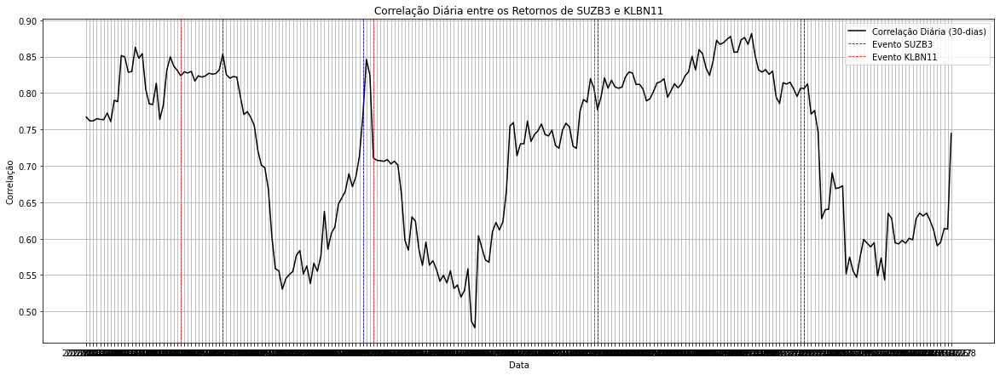

Datas das publicações 'SUZB3':
2023-02-28
2023-04-27
2023-08-02
2023-10-26

Datas das publicações 'KLBN11':
2023-02-08
2023-05-03
2023-08-01
2023-10-25
############################################################
Setor de Petróleo e Gás


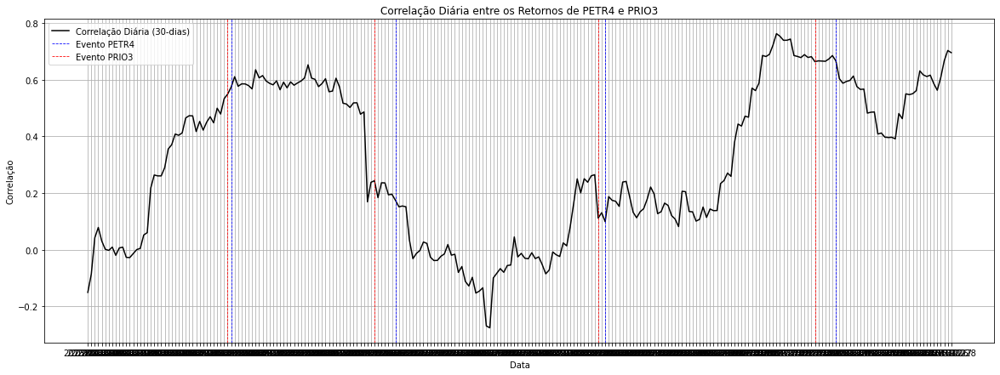

Datas das publicações 'PETR4':
2023-03-02
2023-05-11
2023-08-04
2023-11-09

Datas das publicações 'PRIO3':
2023-03-01
2023-05-03
2023-08-02
2023-10-31


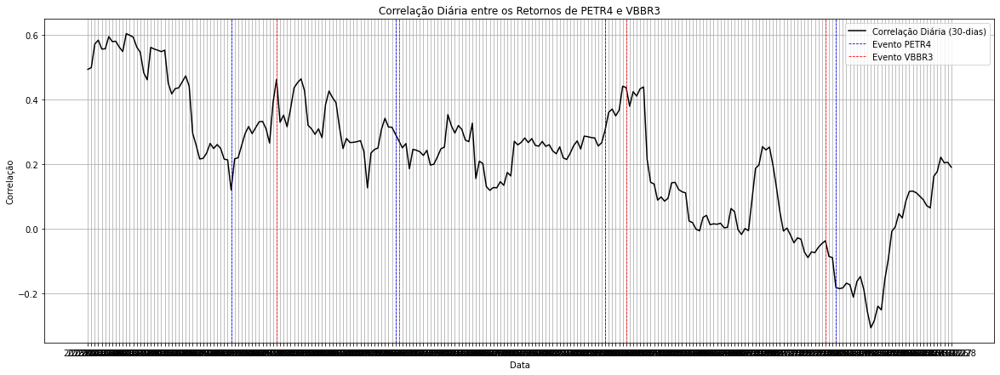

Datas das publicações 'PETR4':
2023-03-02
2023-05-11
2023-08-04
2023-11-09

Datas das publicações 'VBBR3':
2023-03-21
2023-05-12
2023-08-14
2023-11-06




In [109]:
for a in range(2018, 2024):
    print(f"Ano: {a}")
    
    print("Setor de Aviação")
    try:
        corr_pair("GOLL4", "AZUL4", f'{a}-01-01', f'{a}-12-31', '30')
    except Exception as e:
        print(f"Erro na correlação entre GOLL4 e AZUL4 em {a}: {e}")
    print("############################################################")
    
    print("Setor Bancário")
    try:
        corr_pair("ITUB4", "BBDC4", f'{a}-01-01', f'{a}-12-31', '30')
        corr_pair("BBAS3", "SANB11", f'{a}-01-01', f'{a}-12-31', '30')
    except Exception as e:
        print(f"Erro na correlação do setor bancário em {a}: {e}")
    print("############################################################")
    
    print("Setor de Energia Elétrica")
    try:
        corr_pair("ELET3", "CMIG4", f'{a}-01-01', f'{a}-12-31', '30')
        corr_pair("TAEE11", "EQTL3", f'{a}-01-01', f'{a}-12-31', '30')
    except Exception as e:
        print(f"Erro na correlação do setor de energia elétrica em {a}: {e}")
    print("############################################################")
    
    print("Setor de Siderurgia e Mineração")
    try:
        corr_pair("VALE3", "CSNA3", f'{a}-01-01', f'{a}-12-31', '30')
        corr_pair("GGBR4", "USIM5", f'{a}-01-01', f'{a}-12-31', '30')
    except Exception as e:
        print(f"Erro na correlação do setor de siderurgia e mineração em {a}: {e}")
    print("############################################################")
    
    print("Setor de Varejo")
    try:
        corr_pair("MGLU3", "VIIA3", f'{a}-01-01', f'{a}-12-31', '30')
        corr_pair("LREN3", "AMER3", f'{a}-01-01', f'{a}-12-31', '30')
    except Exception as e:
        print(f"Erro na correlação do setor de varejo em {a}: {e}")
    print("############################################################")
    
    print("Setor de Papel e Celulose")
    try:
        corr_pair("SUZB3", "KLBN11", f'{a}-01-01', f'{a}-12-31', '30')
    except Exception as e:
        print(f"Erro na correlação do setor de papel e celulose em {a}: {e}")
    print("############################################################")
    
    print("Setor de Petróleo e Gás")
    try:
        corr_pair("PETR4", "PRIO3", f'{a}-01-01', f'{a}-12-31', '30')
        corr_pair("PETR4", "VBBR3", f'{a}-01-01', f'{a}-12-31', '30')
    except Exception as e:
        print(f"Erro na correlação do setor de petróleo e gás em {a}: {e}")
    
    print("\n")


Correlação média geral: 0.8040
Correlação média durante os períodos de publicação: 0.8847
Correlação média fora dos períodos de publicação: 0.8010


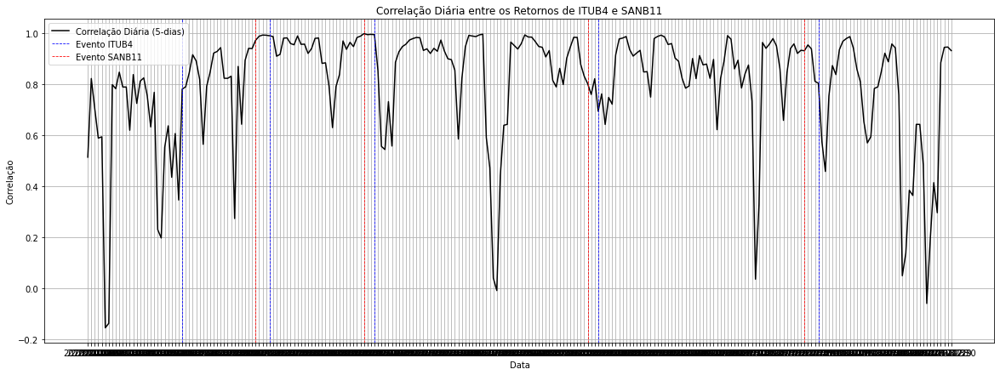

Datas das publicações 'ITUB4':
2020-02-10
2020-03-18
2020-05-04
2020-08-03
2020-11-03

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29
2020-10-27


In [130]:
def corr_pair(stock1, stock2, start_date, end_date, window_size):
    # Carregar os dados
    stock1_data = pd.read_csv(f"dataset/prices_processed/{stock1}.SA.csv")
    stock2_data = pd.read_csv(f"dataset/prices_processed/{stock2}.SA.csv")
    
    # Filtrar as colunas relevantes
    stock1_return = stock1_data[['Date', 'event', 'Daily_Return']]
    stock2_return = stock2_data[['Date', 'event', 'Daily_Return']]
    
    # Mesclar os dados com base na data
    merged_data = pd.merge(stock1_return, stock2_return, on='Date', suffixes=(f'_{stock1}', f'_{stock2}'))
    
    # Calcular a correlação móvel entre os retornos diários
    merged_data['Rolling_Correlation'] = merged_data[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(merged_data[f'Daily_Return_{stock2}'])
    
    # Filtrar o DataFrame com base nas datas fornecidas
    filtered_data = merged_data[(merged_data['Date'] >= start_date) & (merged_data['Date'] <= end_date)]
    
    # Separar os dados entre os períodos de publicação e fora deles
    period_event = filtered_data[(filtered_data[f'event_{stock1}'] == 1) | (filtered_data[f'event_{stock2}'] == 1)]
    period_non_event = filtered_data[(filtered_data[f'event_{stock1}'] == 0) & (filtered_data[f'event_{stock2}'] == 0)]
    
    # Calcular correlações médias nos diferentes períodos
    overall_corr = filtered_data['Rolling_Correlation'].mean()
    event_corr = period_event['Rolling_Correlation'].mean()
    non_event_corr = period_non_event['Rolling_Correlation'].mean()
    
    # Exibir as correlações médias
    print(f"Correlação média geral: {overall_corr:.4f}")
    print(f"Correlação média durante os períodos de publicação: {event_corr:.4f}")
    print(f"Correlação média fora dos períodos de publicação: {non_event_corr:.4f}")
    
    # Criar o gráfico
    plt.figure(figsize=(20, 7))
    
    # Plotar a correlação diária
    plt.plot(filtered_data['Date'], filtered_data['Rolling_Correlation'], label=f'Correlação Diária ({window_size}-dias)', color='black')
    
    # Adicionar marcações verticais para eventos
    event_stock1_dates = filtered_data[filtered_data[f'event_{stock1}'] == 1]['Date'].values
    event_stock2_dates = filtered_data[filtered_data[f'event_{stock2}'] == 1]['Date'].values
    
    # Adicionar linhas verticais para eventos do stock1
    for date in event_stock1_dates:
        plt.axvline(x=date, color='blue', linestyle='--', linewidth=0.8, label=f'Evento {stock1}' if date == event_stock1_dates[0] else "")
    
    # Adicionar linhas verticais para eventos do stock2
    for date in event_stock2_dates:
        plt.axvline(x=date, color='red', linestyle='--', linewidth=0.8, label=f'Evento {stock2}' if date == event_stock2_dates[0] else "")
    
    # Configurar o gráfico
    plt.xlabel('Data')
    plt.ylabel('Correlação')
    plt.title(f'Correlação Diária entre os Retornos de {stock1} e {stock2}')
    plt.legend()
    plt.grid(True)
    
    # Exibir o gráfico
    plt.show()

    # Imprimir as datas dos eventos
    print(f"Datas das publicações '{stock1}':")
    for date in event_stock1_dates:
        print(date)
    
    print(f"\nDatas das publicações '{stock2}':")
    for date in event_stock2_dates:
        print(date)

# Chame a função com os parâmetros desejados
corr_pair('ITUB4', 'SANB11', '2020-01-01', '2020-12-31', 5)

In [278]:
stock1_data = pd.read_csv(f"dataset/prices_processed/ITUB4.SA.csv")
stock2_data = pd.read_csv(f"dataset/prices_processed/SANB11.SA.csv")


In [279]:
stock1_return = stock1_data[['Date', 'event', 'Daily_Return']]
stock2_return = stock2_data[['Date', 'event', 'Daily_Return']]


In [280]:
merged_data = pd.merge(stock1_return, stock2_return, on='Date', suffixes=('_ITUB4', '_SANB11'))

In [281]:
stock2_return.head(10)

,Date,event,Daily_Return
0,2010-01-04,0,NaN
1,2010-01-05,0,0.009638
2,2010-01-06,0,-0.005017
3,2010-01-07,0,-0.007150
4,2010-01-08,0,-0.010182
5,2010-01-11,0,0.010605
6,2010-01-12,0,0.001686
7,2010-01-13,0,0.006717
8,2010-01-14,0,-0.027573
9,2010-01-15,0,-0.015168


In [282]:
stock1_return.head(10)

,Date,event,Daily_Return
0,2010-01-04,0,NaN
1,2010-01-05,0,0.006460
2,2010-01-06,0,-0.008705
3,2010-01-07,0,-0.010295
4,2010-01-08,0,-0.015260
5,2010-01-11,0,-0.008752
6,2010-01-12,0,-0.009351
7,2010-01-13,0,0.003127
8,2010-01-14,0,-0.013884
9,2010-01-15,0,-0.017026


In [283]:
merged_data.head(10)

,Date,event_ITUB4,Daily_Return_ITUB4,event_SANB11,Daily_Return_SANB11
0,2010-01-04,0,NaN,0,NaN
1,2010-01-05,0,0.006460,0,0.009638
2,2010-01-06,0,-0.008705,0,-0.005017
3,2010-01-07,0,-0.010295,0,-0.007150
4,2010-01-08,0,-0.015260,0,-0.010182
5,2010-01-11,0,-0.008752,0,0.010605
6,2010-01-12,0,-0.009351,0,0.001686
7,2010-01-13,0,0.003127,0,0.006717
8,2010-01-14,0,-0.013884,0,-0.027573
9,2010-01-15,0,-0.017026,0,-0.015168


In [284]:
merged_data['Rolling_Correlation'] = merged_data['Daily_Return_ITUB4'].rolling(window=int(4)).corr(merged_data['Daily_Return_SANB11'])

In [285]:
merged_data.head(25)

,Date,event_ITUB4,Daily_Return_ITUB4,event_SANB11,Daily_Return_SANB11,Rolling_Correlation
0,2010-01-04,0,NaN,0,NaN,NaN
1,2010-01-05,0,0.006460,0,0.009638,NaN
2,2010-01-06,0,-0.008705,0,-0.005017,NaN
3,2010-01-07,0,-0.010295,0,-0.007150,NaN
4,2010-01-08,0,-0.015260,0,-0.010182,0.996954
5,2010-01-11,0,-0.008752,0,0.010605,0.622379
6,2010-01-12,0,-0.009351,0,0.001686,0.783805
7,2010-01-13,0,0.003127,0,0.006717,0.644435
8,2010-01-14,0,-0.013884,0,-0.027573,0.617592
9,2010-01-15,0,-0.017026,0,-0.015168,0.783339


In [287]:
filtered_data = merged_data[(merged_data['Date'] >= '2020-01-01') & (merged_data['Date'] <= '2020-12-31')]

In [288]:
filtered_data

,Date,event_ITUB4,Daily_Return_ITUB4,event_SANB11,Daily_Return_SANB11,Rolling_Correlation
2480,2020-01-02,0,0.024758,0,0.034686,0.730290
2481,2020-01-03,0,-0.010574,0,-0.000588,0.866342
2482,2020-01-06,0,-0.014994,0,-0.071081,0.710276
2483,2020-01-07,0,-0.023473,0,-0.002107,0.617973
2484,2020-01-08,0,-0.016428,0,-0.007835,-0.157079
...,...,...,...,...,...,...
2723,2020-12-22,0,0.004812,0,0.014987,0.747354
2724,2020-12-23,0,0.021840,0,0.022288,0.962076
2725,2020-12-28,0,0.007175,0,0.017912,0.957161
2726,2020-12-29,0,-0.002178,0,-0.000650,0.850660


In [289]:
period_event = filtered_data[(filtered_data['event_ITUB4'] == 1) | (filtered_data['event_SANB11'] == 1)]

In [290]:
period_event

,Date,event_ITUB4,Daily_Return_ITUB4,event_SANB11,Daily_Return_SANB11,Rolling_Correlation
2507,2020-02-10,1,0.016768,0,0.024458,0.784074
2528,2020-03-12,0,-0.103367,1,-0.144725,0.970670
2532,2020-03-18,1,-0.071973,0,-0.067829,0.989852
2559,2020-04-28,0,0.079294,1,0.106913,0.999685
2562,2020-05-04,1,-0.039414,0,-0.047791,0.995011
2623,2020-07-29,0,0.023244,1,0.031499,0.671245
2626,2020-08-03,1,0.014399,0,-0.012406,0.731092
2685,2020-10-27,0,-0.028907,1,-0.028438,0.931549
2689,2020-11-03,1,0.023570,0,0.015886,0.780064


In [292]:
event_window = set()
window_size=4

In [293]:
event_indices = period_event.index

In [294]:
for idx in event_indices:
    # Adicionar o intervalo de - (window-1) até + (window-1) em torno do índice do evento
    for offset in range(- (int(window_size) - 1), int(window_size)):
        event_window.add(idx + offset)

In [295]:
event_indices

Index([2507, 2528, 2532, 2559, 2562, 2623, 2626, 2685, 2689], dtype='int64')

In [265]:
event_window

{2504,
 2505,
 2506,
 2507,
 2508,
 2509,
 2510,
 2525,
 2526,
 2527,
 2528,
 2529,
 2530,
 2531,
 2532,
 2533,
 2534,
 2535,
 2556,
 2557,
 2558,
 2559,
 2560,
 2561,
 2562,
 2563,
 2564,
 2565,
 2620,
 2621,
 2622,
 2623,
 2624,
 2625,
 2626,
 2627,
 2628,
 2629,
 2682,
 2683,
 2684,
 2685,
 2686,
 2687,
 2688,
 2689,
 2690,
 2691,
 2692}

In [296]:
filtered_data.index

Index([2480, 2481, 2482, 2483, 2484, 2485, 2486, 2487, 2488, 2489,
       ...
       2718, 2719, 2720, 2721, 2722, 2723, 2724, 2725, 2726, 2727],
      dtype='int64', length=248)

In [277]:
len(filtered_data)

248

In [297]:
filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')

In [298]:
filtered_data_event_window = filtered_data.loc[list(event_window)]

In [300]:
len(filtered_data_event_window)

49

In [301]:
len(filtered_data_no_event_window)

199

In [302]:
overall_corr = filtered_data['Rolling_Correlation'].mean()
event_corr = filtered_data_event_window['Rolling_Correlation'].mean()
non_event_corr = filtered_data_no_event_window['Rolling_Correlation'].mean()

In [9]:
stock1="ITUB4"
stock2="SANB11"
# Exibir as correlações médias
print(f"Correlação média geral: {overall_corr:.4f}")
print(f"Correlação média durante os períodos de publicação: {event_corr:.4f}")
print(f"Correlação média fora dos períodos de publicação: {non_event_corr:.4f}")
    
# Criar o gráfico
plt.figure(figsize=(20, 7))
    
# Plotar a correlação diária
plt.plot(filtered_data['Date'], filtered_data['Rolling_Correlation'], label=f'Correlação Diária ({window_size}-dias)', color='black')
    
# Adicionar marcações verticais para eventos
event_stock1_dates = filtered_data[filtered_data[f'event_{stock1}'] == 1]['Date'].values
event_stock2_dates = filtered_data[filtered_data[f'event_{stock2}'] == 1]['Date'].values
    
# Adicionar linhas verticais para eventos do stock1
for date in event_stock1_dates:
    plt.axvline(x=date, color='blue', linestyle='--', linewidth=0.8, label=f'Evento {stock1}' if date == event_stock1_dates[0] else "")
    
# Adicionar linhas verticais para eventos do stock2
for date in event_stock2_dates:
    plt.axvline(x=date, color='red', linestyle='--', linewidth=0.8, label=f'Evento {stock2}' if date == event_stock2_dates[0] else "")
    
# Configurar o gráfico
plt.xlabel('Data')
plt.ylabel('Correlação')
plt.title(f'Correlação Diária entre os Retornos de {stock1} e {stock2}')
plt.legend()
plt.grid(True)
    
# Exibir o gráfico
plt.show()

# Imprimir as datas dos eventos
print(f"Datas das publicações '{stock1}':")
for date in event_stock1_dates:
    print(date)
    
print(f"\nDatas das publicações '{stock2}':")
for date in event_stock2_dates:
    print(date)

NameError: name 'overall_corr' is not defined

In [305]:
filtered_data['Rolling_Correlation'] = merged_data['Daily_Return_ITUB4'].rolling(window=int(4)).corr(merged_data['Daily_Return_SANB11'])
filtered_data_event_window['Rolling_Correlation'] = merged_data['Daily_Return_ITUB4'].rolling(window=int(4)).corr(merged_data['Daily_Return_SANB11'])
filtered_data_no_event_window['Rolling_Correlation'] = merged_data['Daily_Return_ITUB4'].rolling(window=int(4)).corr(merged_data['Daily_Return_SANB11'])

overall_corr = filtered_data['Rolling_Correlation'].mean()
event_corr = filtered_data_event_window['Rolling_Correlation'].mean()
non_event_corr = filtered_data_no_event_window['Rolling_Correlation'].mean()

<ipython-input-305-820124d1bc10>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Rolling_Correlation'] = merged_data['Daily_Return_ITUB4'].rolling(window=int(4)).corr(merged_data['Daily_Return_SANB11'])


Correlação média geral: 0.7914
Correlação média durante os períodos de publicação: 0.8357
Correlação média fora dos períodos de publicação: 0.7805


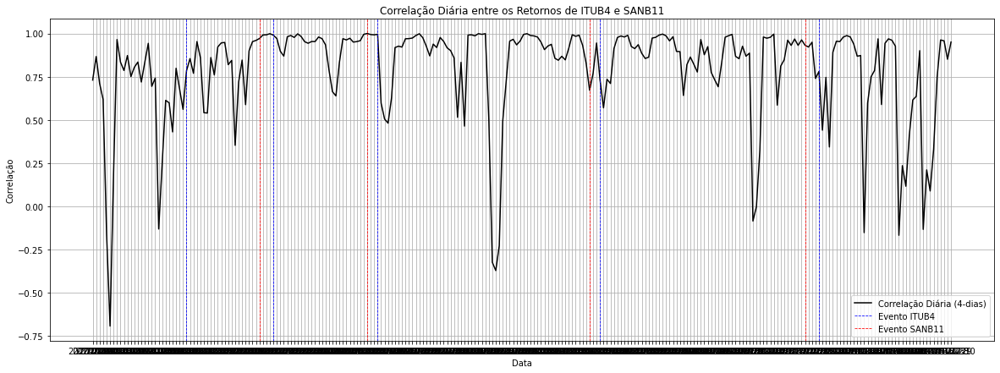

Datas das publicações 'ITUB4':
2020-02-10
2020-03-18
2020-05-04
2020-08-03
2020-11-03

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29
2020-10-27


In [306]:
stock1="ITUB4"
stock2="SANB11"
# Exibir as correlações médias
print(f"Correlação média geral: {overall_corr:.4f}")
print(f"Correlação média durante os períodos de publicação: {event_corr:.4f}")
print(f"Correlação média fora dos períodos de publicação: {non_event_corr:.4f}")
    
# Criar o gráfico
plt.figure(figsize=(20, 7))
    
# Plotar a correlação diária
plt.plot(filtered_data['Date'], filtered_data['Rolling_Correlation'], label=f'Correlação Diária ({window_size}-dias)', color='black')
    
# Adicionar marcações verticais para eventos
event_stock1_dates = filtered_data[filtered_data[f'event_{stock1}'] == 1]['Date'].values
event_stock2_dates = filtered_data[filtered_data[f'event_{stock2}'] == 1]['Date'].values
    
# Adicionar linhas verticais para eventos do stock1
for date in event_stock1_dates:
    plt.axvline(x=date, color='blue', linestyle='--', linewidth=0.8, label=f'Evento {stock1}' if date == event_stock1_dates[0] else "")
    
# Adicionar linhas verticais para eventos do stock2
for date in event_stock2_dates:
    plt.axvline(x=date, color='red', linestyle='--', linewidth=0.8, label=f'Evento {stock2}' if date == event_stock2_dates[0] else "")
    
# Configurar o gráfico
plt.xlabel('Data')
plt.ylabel('Correlação')
plt.title(f'Correlação Diária entre os Retornos de {stock1} e {stock2}')
plt.legend()
plt.grid(True)
    
# Exibir o gráfico
plt.show()

# Imprimir as datas dos eventos
print(f"Datas das publicações '{stock1}':")
for date in event_stock1_dates:
    print(date)
    
print(f"\nDatas das publicações '{stock2}':")
for date in event_stock2_dates:
    print(date)

<ipython-input-312-eec1ee691d38>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Rolling_Correlation'] = filtered_data[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(filtered_data[f'Daily_Return_{stock2}'])


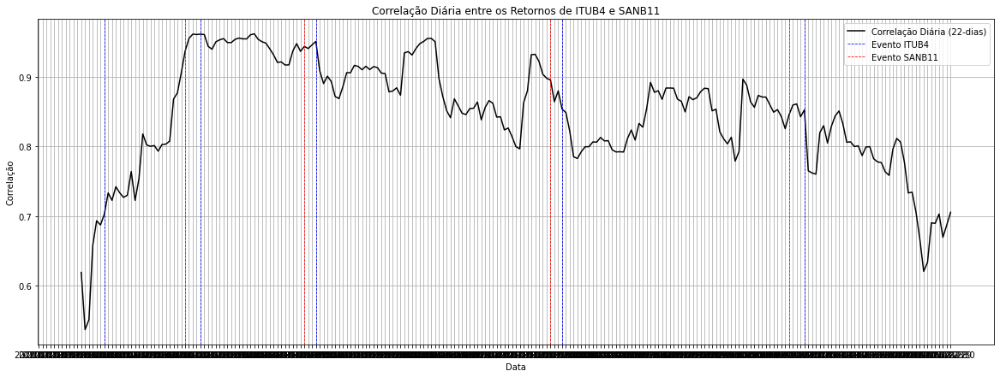

Correlação média geral: 0.8455
Correlação média durante os períodos de publicação: 0.8524
Correlação média fora dos períodos de publicação: 0.7286

Datas das publicações 'ITUB4':
2020-02-10
2020-03-18
2020-05-04
2020-08-03
2020-11-03

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29
2020-10-27


In [312]:
def corr_pair(stock1, stock2, start_date, end_date, window_size):
    # Carregar os dados
    stock1_data = pd.read_csv(f"dataset/prices_processed/{stock1}.SA.csv")
    stock2_data = pd.read_csv(f"dataset/prices_processed/{stock2}.SA.csv")
    
    # Filtrar as colunas relevantes
    stock1_return = stock1_data[['Date', 'event', 'Daily_Return']]
    stock2_return = stock2_data[['Date', 'event', 'Daily_Return']]   
       
    # Mesclar os dados com base na data
    merged_data = pd.merge(stock1_return, stock2_return, on='Date', suffixes=(f'_{stock1}', f'_{stock2}'))
    
    # Filtrar o DataFrame com base nas datas fornecidas
    filtered_data = merged_data[(merged_data['Date'] >= start_date) & (merged_data['Date'] <= end_date)]
    
    # Separar os dados entre os períodos de publicação e fora deles
    period_event = filtered_data[(filtered_data[f'event_{stock1}'] == 1) | (filtered_data[f'event_{stock2}'] == 1)]
    
    #Calcular as janelas de publicação:
    event_window = set()
    event_indices = period_event.index
    for idx in event_indices:
    # Adicionar o intervalo de - (window-1) até + (window-1) em torno do índice do evento
        for offset in range(- (int(window_size) - 1), int(window_size)):
            event_window.add(idx + offset)
    
    #Filtrar os periodos    
    filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')
    filtered_data_event_window = filtered_data.loc[list(event_window)]
    
    # Calcular a correlação móvel entre os retornos diários dos diferentes periodos       
    filtered_data['Rolling_Correlation'] = filtered_data[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(filtered_data[f'Daily_Return_{stock2}'])
    filtered_data_no_event_window['Rolling_Correlation'] = filtered_data_no_event_window[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(filtered_data_no_event_window[f'Daily_Return_{stock2}'])
    filtered_data_event_window['Rolling_Correlation'] = filtered_data_event_window[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(filtered_data_event_window[f'Daily_Return_{stock2}'])
       

    # Calcular correlações médias nos diferentes períodos
    overall_corr = filtered_data['Rolling_Correlation'].mean()    
    non_event_corr = filtered_data_no_event_window['Rolling_Correlation'].mean()
    event_corr = filtered_data_event_window['Rolling_Correlation'].mean()
   
   
    # Criar o gráfico
    plt.figure(figsize=(20, 7))
    
    # Plotar a correlação diária
    plt.plot(filtered_data['Date'], filtered_data['Rolling_Correlation'], label=f'Correlação Diária ({window_size}-dias)', color='black')
    
    # Adicionar marcações verticais para eventos
    event_stock1_dates = filtered_data[filtered_data[f'event_{stock1}'] == 1]['Date'].values
    event_stock2_dates = filtered_data[filtered_data[f'event_{stock2}'] == 1]['Date'].values
    
    # Adicionar linhas verticais para eventos do stock1
    for date in event_stock1_dates:
        plt.axvline(x=date, color='blue', linestyle='--', linewidth=0.8, label=f'Evento {stock1}' if date == event_stock1_dates[0] else "")
    
    # Adicionar linhas verticais para eventos do stock2
    for date in event_stock2_dates:
        plt.axvline(x=date, color='red', linestyle='--', linewidth=0.8, label=f'Evento {stock2}' if date == event_stock2_dates[0] else "")
    
    # Configurar o gráfico
    plt.xlabel('Data')
    plt.ylabel('Correlação')
    plt.title(f'Correlação Diária entre os Retornos de {stock1} e {stock2}')
    plt.legend()
    plt.grid(True)
    
    # Exibir o gráfico
    plt.show()
    # Exibir as correlações médias
    print(f"Correlação média geral: {overall_corr:.4f}")
    print(f"Correlação média durante os períodos de publicação: {event_corr:.4f}")
    print(f"Correlação média fora dos períodos de publicação: {non_event_corr:.4f}")

    # Imprimir as datas dos eventos
    print(f"\nDatas das publicações '{stock1}':")
    for date in event_stock1_dates:
        print(date)
    
    print(f"\nDatas das publicações '{stock2}':")
    for date in event_stock2_dates:
        print(date)

# Chame a função com os parâmetros desejados
corr_pair('ITUB4', 'SANB11', '2020-01-01', '2020-12-31', 22)

<ipython-input-317-cdca6e5cb983>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Rolling_Correlation'] = filtered_data[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(filtered_data[f'Daily_Return_{stock2}'])


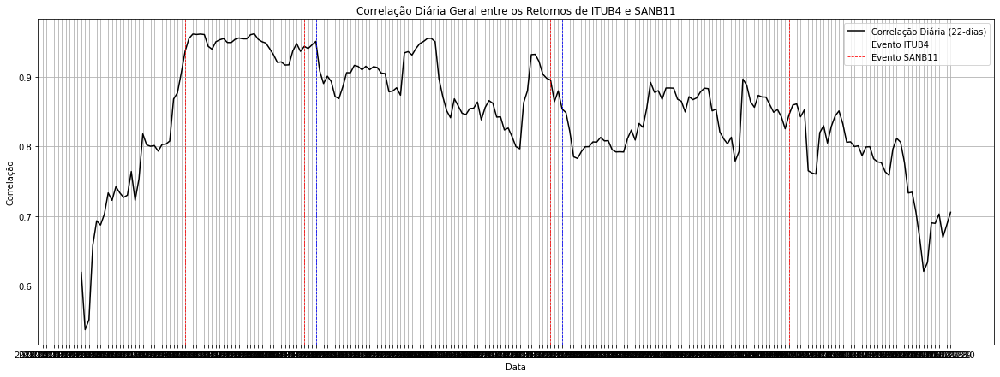

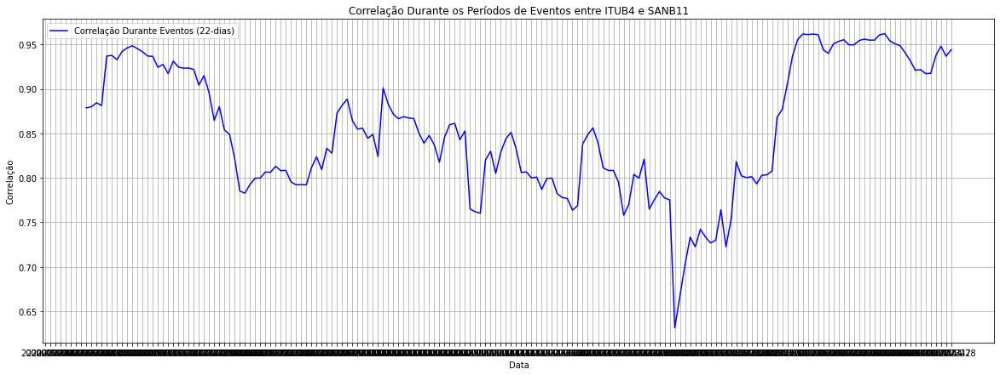

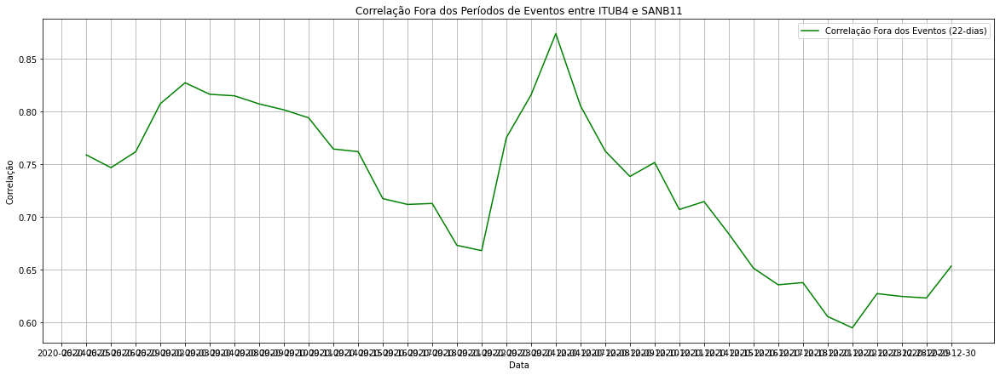

Correlação média geral: 0.8455
Correlação média durante os períodos de publicação: 0.8524
Correlação média fora dos períodos de publicação: 0.7286

Datas das publicações 'ITUB4':
2020-02-10
2020-03-18
2020-05-04
2020-08-03
2020-11-03

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29
2020-10-27


In [317]:
def corr_pair(stock1, stock2, start_date, end_date, window_size):
    # Carregar os dados
    stock1_data = pd.read_csv(f"dataset/prices_processed/{stock1}.SA.csv")
    stock2_data = pd.read_csv(f"dataset/prices_processed/{stock2}.SA.csv")
    
    # Filtrar as colunas relevantes
    stock1_return = stock1_data[['Date', 'event', 'Daily_Return']]
    stock2_return = stock2_data[['Date', 'event', 'Daily_Return']]   
       
    # Mesclar os dados com base na data
    merged_data = pd.merge(stock1_return, stock2_return, on='Date', suffixes=(f'_{stock1}', f'_{stock2}'))
    
    # Filtrar o DataFrame com base nas datas fornecidas
    filtered_data = merged_data[(merged_data['Date'] >= start_date) & (merged_data['Date'] <= end_date)]
    
    # Separar os dados entre os períodos de publicação e fora deles
    period_event = filtered_data[(filtered_data[f'event_{stock1}'] == 1) | (filtered_data[f'event_{stock2}'] == 1)]
    
    # Calcular as janelas de publicação:
    event_window = set()
    event_indices = period_event.index
    for idx in event_indices:
        # Adicionar o intervalo de - (window-1) até + (window-1) em torno do índice do evento
        for offset in range(- (int(window_size) - 1), int(window_size)):
            event_window.add(idx + offset)
    
    # Filtrar os períodos    
    filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')
    filtered_data_event_window = filtered_data.loc[list(event_window)]
    
    # Calcular a correlação móvel entre os retornos diários dos diferentes períodos       
    filtered_data['Rolling_Correlation'] = filtered_data[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(filtered_data[f'Daily_Return_{stock2}'])
    filtered_data_no_event_window['Rolling_Correlation'] = filtered_data_no_event_window[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(filtered_data_no_event_window[f'Daily_Return_{stock2}'])
    filtered_data_event_window['Rolling_Correlation'] = filtered_data_event_window[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(filtered_data_event_window[f'Daily_Return_{stock2}'])
    
    # Calcular correlações médias nos diferentes períodos
    overall_corr = filtered_data['Rolling_Correlation'].mean()    
    non_event_corr = filtered_data_no_event_window['Rolling_Correlation'].mean()
    event_corr = filtered_data_event_window['Rolling_Correlation'].mean()
   
    # Gráfico da correlação diária geral
    plt.figure(figsize=(20, 7))
    plt.plot(filtered_data['Date'], filtered_data['Rolling_Correlation'], label=f'Correlação Diária ({window_size}-dias)', color='black')
    
    # Adicionar marcações verticais para eventos
    event_stock1_dates = filtered_data[filtered_data[f'event_{stock1}'] == 1]['Date'].values
    event_stock2_dates = filtered_data[filtered_data[f'event_{stock2}'] == 1]['Date'].values
    
    for date in event_stock1_dates:
        plt.axvline(x=date, color='blue', linestyle='--', linewidth=0.8, label=f'Evento {stock1}' if date == event_stock1_dates[0] else "")
    
    for date in event_stock2_dates:
        plt.axvline(x=date, color='red', linestyle='--', linewidth=0.8, label=f'Evento {stock2}' if date == event_stock2_dates[0] else "")
    
    plt.xlabel('Data')
    plt.ylabel('Correlação')
    plt.title(f'Correlação Diária Geral entre os Retornos de {stock1} e {stock2}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Gráfico da correlação durante os períodos de eventos
    plt.figure(figsize=(20, 7))
    plt.plot(filtered_data_event_window['Date'], filtered_data_event_window['Rolling_Correlation'], label=f'Correlação Durante Eventos ({window_size}-dias)', color='blue')
    
    plt.xlabel('Data')
    plt.ylabel('Correlação')
    plt.title(f'Correlação Durante os Períodos de Eventos entre {stock1} e {stock2}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Gráfico da correlação fora dos períodos de eventos
    plt.figure(figsize=(20, 7))
    plt.plot(filtered_data_no_event_window['Date'], filtered_data_no_event_window['Rolling_Correlation'], label=f'Correlação Fora dos Eventos ({window_size}-dias)', color='green')
    
    plt.xlabel('Data')
    plt.ylabel('Correlação')
    plt.title(f'Correlação Fora dos Períodos de Eventos entre {stock1} e {stock2}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Exibir as correlações médias
    print(f"Correlação média geral: {overall_corr:.4f}")
    print(f"Correlação média durante os períodos de publicação: {event_corr:.4f}")
    print(f"Correlação média fora dos períodos de publicação: {non_event_corr:.4f}")
    
    # Imprimir as datas dos eventos
    print(f"\nDatas das publicações '{stock1}':")
    for date in event_stock1_dates:
        print(date)
    
    print(f"\nDatas das publicações '{stock2}':")
    for date in event_stock2_dates:
        print(date)

# Chame a função com os parâmetros desejados
corr_pair('ITUB4', 'SANB11', '2020-01-01', '2020-12-31', 22)


Correlação média geral: 0.8175
Correlação média durante os períodos de publicação: 0.8273
Correlação média fora dos períodos de publicação: 0.7849


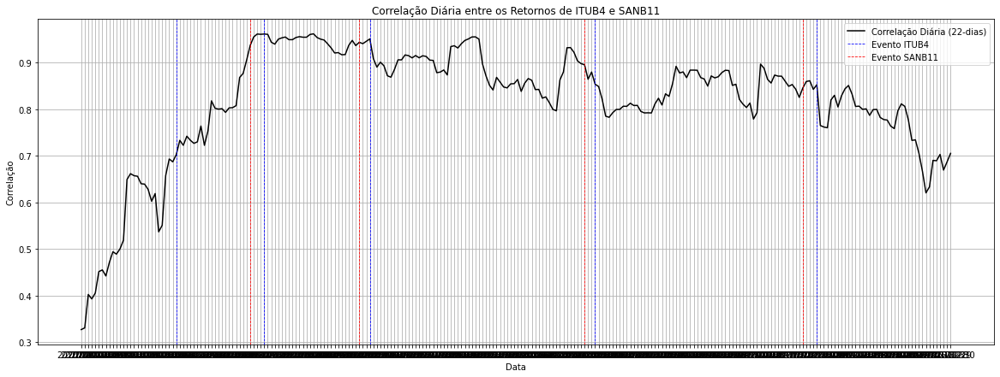

Datas das publicações 'ITUB4':
2020-02-10
2020-03-18
2020-05-04
2020-08-03
2020-11-03

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29
2020-10-27


In [319]:
def corr_pair(stock1, stock2, start_date, end_date, window_size):
    # Carregar os dados
    stock1_data = pd.read_csv(f"dataset/prices_processed/{stock1}.SA.csv")
    stock2_data = pd.read_csv(f"dataset/prices_processed/{stock2}.SA.csv")
    
    # Filtrar as colunas relevantes
    stock1_return = stock1_data[['Date', 'event', 'Daily_Return']]
    stock2_return = stock2_data[['Date', 'event', 'Daily_Return']]   
       
    # Mesclar os dados com base na data
    merged_data = pd.merge(stock1_return, stock2_return, on='Date', suffixes=(f'_{stock1}', f'_{stock2}'))
    
    # Calcular a correlação móvel entre os retornos diários
    merged_data['Rolling_Correlation'] = merged_data[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(merged_data[f'Daily_Return_{stock2}'])
    
    # Filtrar o DataFrame com base nas datas fornecidas
    filtered_data = merged_data[(merged_data['Date'] >= start_date) & (merged_data['Date'] <= end_date)]
    
    # Separar os dados entre os períodos de publicação e fora deles
    period_event = filtered_data[(filtered_data[f'event_{stock1}'] == 1) | (filtered_data[f'event_{stock2}'] == 1)]
    
    #Calcular as janelas de publicação:
    event_window = set()
    event_indices = period_event.index
    for idx in event_indices:
    # Adicionar o intervalo de - (window-1) até + (window-1) em torno do índice do evento
        for offset in range(- (int(window_size) - 1), int(window_size)):
            event_window.add(idx + offset)
    
    #Filtrar os periodos    
    filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')
    filtered_data_event_window = filtered_data.loc[list(event_window)]
        
    # Calcular correlações médias nos diferentes períodos
    overall_corr = filtered_data['Rolling_Correlation'].mean()    
    non_event_corr = filtered_data_no_event_window['Rolling_Correlation'].mean()
    event_corr = filtered_data_event_window['Rolling_Correlation'].mean()
    
    # Exibir as correlações médias
    print(f"Correlação média geral: {overall_corr:.4f}")
    print(f"Correlação média durante os períodos de publicação: {event_corr:.4f}")
    print(f"Correlação média fora dos períodos de publicação: {non_event_corr:.4f}")
    
    # Criar o gráfico
    plt.figure(figsize=(20, 7))
    
    # Plotar a correlação diária
    plt.plot(filtered_data['Date'], filtered_data['Rolling_Correlation'], label=f'Correlação Diária ({window_size}-dias)', color='black')
    
    # Adicionar marcações verticais para eventos
    event_stock1_dates = filtered_data[filtered_data[f'event_{stock1}'] == 1]['Date'].values
    event_stock2_dates = filtered_data[filtered_data[f'event_{stock2}'] == 1]['Date'].values
    
    # Adicionar linhas verticais para eventos do stock1
    for date in event_stock1_dates:
        plt.axvline(x=date, color='blue', linestyle='--', linewidth=0.8, label=f'Evento {stock1}' if date == event_stock1_dates[0] else "")
    
    # Adicionar linhas verticais para eventos do stock2
    for date in event_stock2_dates:
        plt.axvline(x=date, color='red', linestyle='--', linewidth=0.8, label=f'Evento {stock2}' if date == event_stock2_dates[0] else "")
    
    # Configurar o gráfico
    plt.xlabel('Data')
    plt.ylabel('Correlação')
    plt.title(f'Correlação Diária entre os Retornos de {stock1} e {stock2}')
    plt.legend()
    plt.grid(True)
    
    # Exibir o gráfico
    plt.show()

    # Imprimir as datas dos eventos
    print(f"Datas das publicações '{stock1}':")
    for date in event_stock1_dates:
        print(date)
    
    print(f"\nDatas das publicações '{stock2}':")
    for date in event_stock2_dates:
        print(date)

# Chame a função com os parâmetros desejados
corr_pair('ITUB4', 'SANB11', '2020-01-01', '2020-12-31', 22)

In [321]:
filtered_data['Date'] =''

<ipython-input-321-ad29bd9ba058>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Date'] =''


In [9]:
def corr_pair(stock1, stock2, start_date, end_date, window_size):
    # Carregar os dados
    stock1_data = pd.read_csv(f"dataset/prices_processed/{stock1}.SA.csv")
    stock2_data = pd.read_csv(f"dataset/prices_processed/{stock2}.SA.csv")
    
    # Filtrar as colunas relevantes
    stock1_return = stock1_data[['Date', 'event', 'Daily_Return']]
    stock2_return = stock2_data[['Date', 'event', 'Daily_Return']]   
       
    # Mesclar os dados com base na data
    merged_data = pd.merge(stock1_return, stock2_return, on='Date', suffixes=(f'_{stock1}', f'_{stock2}'))
    
    # Filtrar o DataFrame com base nas datas fornecidas
    filtered_data = merged_data[(merged_data['Date'] >= start_date) & (merged_data['Date'] <= end_date)]

    
    # Calcular a correlação móvel entre os retornos diários
    filtered_data['Rolling_Correlation'] = filtered_data[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(filtered_data[f'Daily_Return_{stock2}'])
    
    
    # Separar os dados entre os períodos de publicação e fora deles
    period_event = filtered_data[(filtered_data[f'event_{stock1}'] == 1) | (filtered_data[f'event_{stock2}'] == 1)]
    
    #Calcular as janelas de publicação:
    event_window = set()
    event_indices = period_event.index
    for idx in event_indices:
    # Adicionar o intervalo de - (window-1) até + (window-1) em torno do índice do evento
        for offset in range(- (int(window_size) - 1), int(window_size)):
            event_window.add(idx + offset)
    
    #Filtrar os periodos    
    filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')
    filtered_data_event_window = filtered_data.loc[list(event_window)]
        
    # Calcular correlações médias nos diferentes períodos
    overall_corr = filtered_data['Rolling_Correlation'].mean()    
    non_event_corr = filtered_data_no_event_window['Rolling_Correlation'].mean()
    event_corr = filtered_data_event_window['Rolling_Correlation'].mean()
    
    # Exibir as correlações médias
    print(f"Correlação média geral: {overall_corr:.4f}")
    print(f"Correlação média durante os períodos de publicação: {event_corr:.4f}")
    print(f"Correlação média fora dos períodos de publicação: {non_event_corr:.4f}")
    
    # Criar o gráfico
    plt.figure(figsize=(20, 7))
    
    # Plotar a correlação diária
    plt.plot(filtered_data['Date'], filtered_data['Rolling_Correlation'], label=f'Correlação Diária ({window_size}-dias)', color='black')
    
    # Adicionar marcações verticais para eventos
    event_stock1_dates = filtered_data[filtered_data[f'event_{stock1}'] == 1]['Date'].values
    event_stock2_dates = filtered_data[filtered_data[f'event_{stock2}'] == 1]['Date'].values
    
    # Adicionar linhas verticais para eventos do stock1
    for date in event_stock1_dates:
        plt.axvline(x=date, color='blue', linestyle='--', linewidth=0.8, label=f'Evento {stock1}' if date == event_stock1_dates[0] else "")
    
    # Adicionar linhas verticais para eventos do stock2
    for date in event_stock2_dates:
        plt.axvline(x=date, color='red', linestyle='--', linewidth=0.8, label=f'Evento {stock2}' if date == event_stock2_dates[0] else "")
    
    # Configurar o gráfico
    plt.xlabel('Data')
    plt.ylabel('Correlação')
    plt.title(f'Correlação Diária entre os Retornos de {stock1} e {stock2}')
    plt.legend()
    plt.grid(True)
    
    # Exibir o gráfico
    plt.show()

    # Imprimir as datas dos eventos
    print(f"Datas das publicações '{stock1}':")
    for date in event_stock1_dates:
        print(date)
    
    print(f"\nDatas das publicações '{stock2}':")
    for date in event_stock2_dates:
        print(date)

# Chame a função com os parâmetros desejados


<ipython-input-9-cddfccbfc6ad>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Rolling_Correlation'] = filtered_data[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(filtered_data[f'Daily_Return_{stock2}'])


Correlação média geral: 0.7986
Correlação média durante os períodos de publicação: 0.7936
Correlação média fora dos períodos de publicação: 0.8129


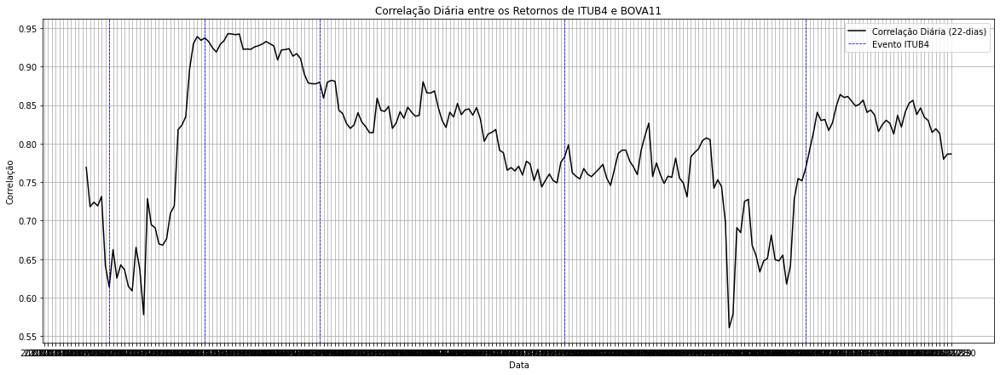

Datas das publicações 'ITUB4':
2020-02-10
2020-03-18
2020-05-04
2020-08-03
2020-11-03

Datas das publicações 'BOVA11':


In [22]:
corr_pair('ITUB4', 'BOVA11', '2020-01-01', '2020-12-32', 22)

<ipython-input-9-cddfccbfc6ad>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Rolling_Correlation'] = filtered_data[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(filtered_data[f'Daily_Return_{stock2}'])


Correlação média geral: 0.7353
Correlação média durante os períodos de publicação: 0.7455
Correlação média fora dos períodos de publicação: 0.7109


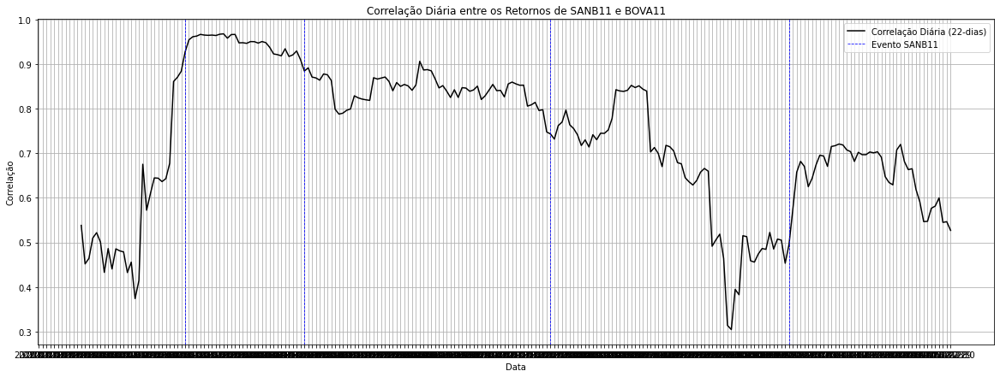

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29
2020-10-27

Datas das publicações 'BOVA11':


In [21]:
corr_pair('SANB11', 'BOVA11', '2020-01-01', '2020-12-32', 22)

<ipython-input-9-cddfccbfc6ad>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Rolling_Correlation'] = filtered_data[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(filtered_data[f'Daily_Return_{stock2}'])


Correlação média geral: 0.7353
Correlação média durante os períodos de publicação: 0.7455
Correlação média fora dos períodos de publicação: 0.7109


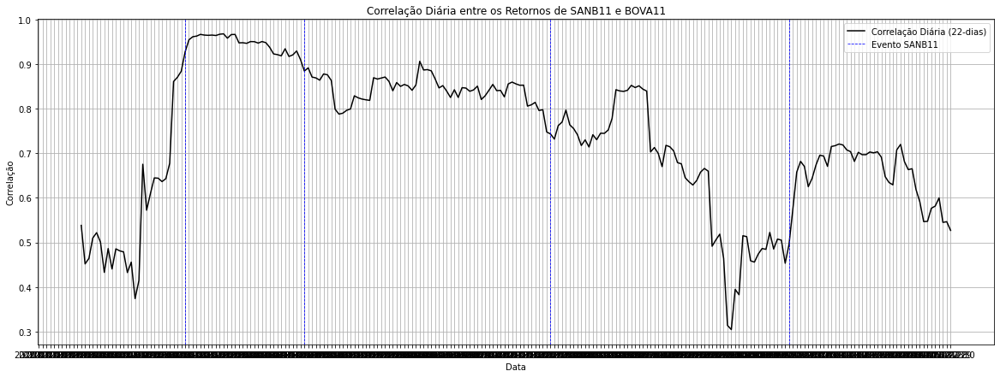

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29
2020-10-27

Datas das publicações 'BOVA11':


In [38]:
corr_pair('SANB11', 'BOVA11', '2020-01-01', '2020-12-32', 22)

<ipython-input-113-4ae8c9c4971e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock_data['Cumulative_Return'] = (1 + stock_data[f'Daily_Return_{stock_name}']).rolling(window=int(window_size)).apply(lambda x: x.prod() - 1)


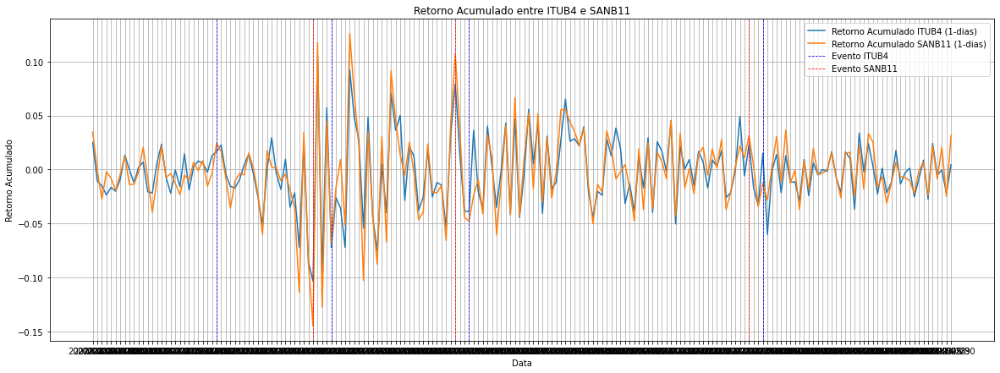

Datas das publicações 'ITUB4':
2020-02-10
2020-03-18
2020-05-04
2020-08-03

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29


In [113]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_cumulative_return(stock_data, stock_name, window_size):
    # Calcular o retorno acumulado
    stock_data['Cumulative_Return'] = (1 + stock_data[f'Daily_Return_{stock_name}']).rolling(window=int(window_size)).apply(lambda x: x.prod() - 1)
    
    # Plotar o retorno acumulado
    plt.plot(stock_data['Date'], stock_data['Cumulative_Return'], label=f'Retorno Acumulado {stock_name} ({window_size}-dias)')

def compare_returns(stock1, stock2, start_date, end_date, window_size):
    # Carregar os dados
    stock1_data = pd.read_csv(f"dataset/prices_processed/{stock1}.SA.csv")
    stock2_data = pd.read_csv(f"dataset/prices_processed/{stock2}.SA.csv")
    
    # Filtrar as colunas relevantes
    stock1_return = stock1_data[['Date', 'event', 'Daily_Return']]
    stock2_return = stock2_data[['Date', 'event', 'Daily_Return']]
       
    # Mesclar os dados com base na data
    merged_data = pd.merge(stock1_return, stock2_return, on='Date', suffixes=(f'_{stock1}', f'_{stock2}'))
    
    # Filtrar o DataFrame com base nas datas fornecidas
    filtered_data = merged_data[(merged_data['Date'] >= start_date) & (merged_data['Date'] <= end_date)]

    # Separar os dados entre os períodos de publicação e fora deles
    period_event = filtered_data[(filtered_data[f'event_{stock1}'] == 1) | (filtered_data[f'event_{stock2}'] == 1)]
    
    # Calcular as janelas de publicação
    event_window = set()
    event_indices = period_event.index
    for idx in event_indices:
        # Adicionar o intervalo de - (window-1) até + (window-1) em torno do índice do evento
        for offset in range(- (int(window_size) - 1), int(window_size)):
            event_window.add(idx + offset)
    
    # Filtrar os períodos
    filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')
    filtered_data_event_window = filtered_data.loc[list(event_window)]

    # Criar o gráfico
    plt.figure(figsize=(20, 7))

    # Plotar o retorno acumulado para as duas ações
    plot_cumulative_return(filtered_data, stock1, window_size)
    plot_cumulative_return(filtered_data, stock2, window_size)
    
    # Adicionar marcações verticais para eventos
    event_stock1_dates = filtered_data[filtered_data[f'event_{stock1}'] == 1]['Date'].values
    event_stock2_dates = filtered_data[filtered_data[f'event_{stock2}'] == 1]['Date'].values
    
    # Adicionar linhas verticais para eventos do stock1
    for date in event_stock1_dates:
        plt.axvline(x=date, color='blue', linestyle='--', linewidth=0.8, label=f'Evento {stock1}' if date == event_stock1_dates[0] else "")
    
    # Adicionar linhas verticais para eventos do stock2
    for date in event_stock2_dates:
        plt.axvline(x=date, color='red', linestyle='--', linewidth=0.8, label=f'Evento {stock2}' if date == event_stock2_dates[0] else "")
    
    # Configurar o gráfico
    plt.xlabel('Data')
    plt.ylabel('Retorno Acumulado')
    plt.title(f'Retorno Acumulado entre {stock1} e {stock2}')
    plt.legend()
    plt.grid(True)
    
    # Exibir o gráfico
    plt.show()

    # Imprimir as datas dos eventos
    print(f"Datas das publicações '{stock1}':")
    for date in event_stock1_dates:
        print(date)
    
    print(f"\nDatas das publicações '{stock2}':")
    for date in event_stock2_dates:
        print(date)

# Chame a função com os parâmetros desejados
compare_returns('ITUB4', 'SANB11', '2020-01-01', '2020-1-31', 1)


<ipython-input-27-b4b48edae0ae>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock_data['Cumulative_Return'] = (1 + stock_data[f'Daily_Return_{stock_name}']).rolling(window=int(window_size)).apply(lambda x: x.prod() - 1)


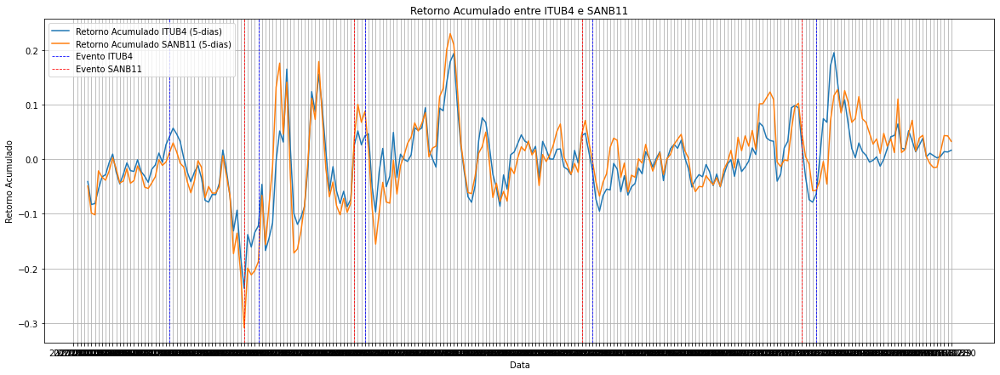

Datas das publicações 'ITUB4':
2020-02-10
2020-03-18
2020-05-04
2020-08-03
2020-11-03

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29
2020-10-27


In [32]:
compare_returns('ITUB4', 'SANB11', '2020-01-01', '2020-12-31', 5)


### Testes

In [1]:
corr_pair('ITUB4', 'SANB11', '2019-01-01', '2012-12-32', 22)

NameError: name 'corr_pair' is not defined

<ipython-input-9-cddfccbfc6ad>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Rolling_Correlation'] = filtered_data[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(filtered_data[f'Daily_Return_{stock2}'])


Correlação média geral: 0.6860
Correlação média durante os períodos de publicação: 0.6858
Correlação média fora dos períodos de publicação: 0.6863


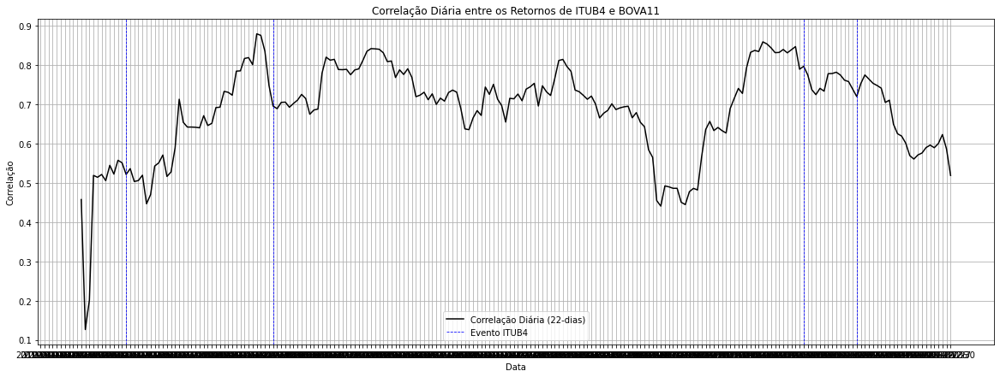

Datas das publicações 'ITUB4':
2019-02-19
2019-05-02
2019-11-04
2019-11-25

Datas das publicações 'BOVA11':


In [54]:
corr_pair('ITUB4', 'BOVA11', '2019-01-01', '2019-12-32', 22)

<ipython-input-9-cddfccbfc6ad>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Rolling_Correlation'] = filtered_data[f'Daily_Return_{stock1}'].rolling(window=int(window_size)).corr(filtered_data[f'Daily_Return_{stock2}'])


Correlação média geral: 0.6001
Correlação média durante os períodos de publicação: 0.5594
Correlação média fora dos períodos de publicação: 0.6055


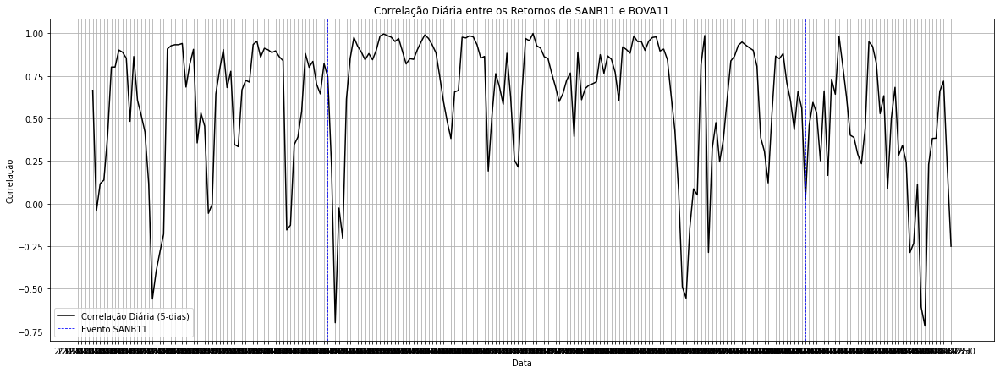

Datas das publicações 'SANB11':
2019-04-30
2019-07-23
2019-10-30

Datas das publicações 'BOVA11':


In [48]:
corr_pair('SANB11', 'BOVA11', '2019-01-01', '2019-12-32', 5)

Setor Bancário:


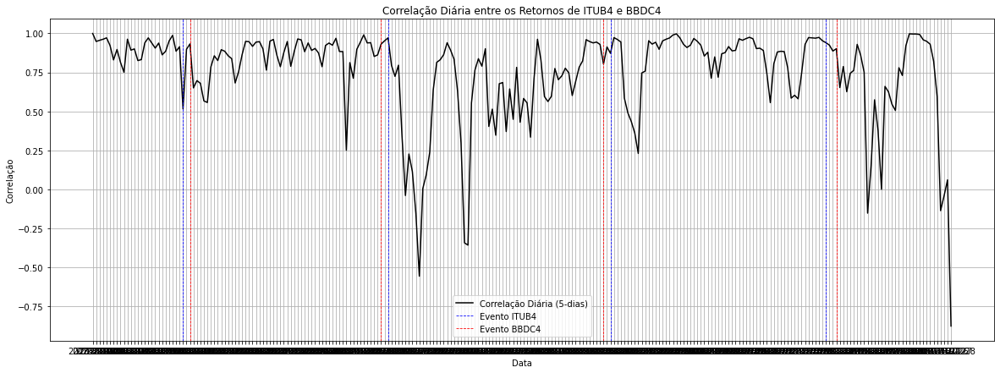

Datas das publicações 'ITUB4':
2023-02-07
2023-05-08
2023-08-07
2023-11-06

Datas das publicações 'BBDC4':
2023-02-09
2023-05-04
2023-08-03
2023-11-09


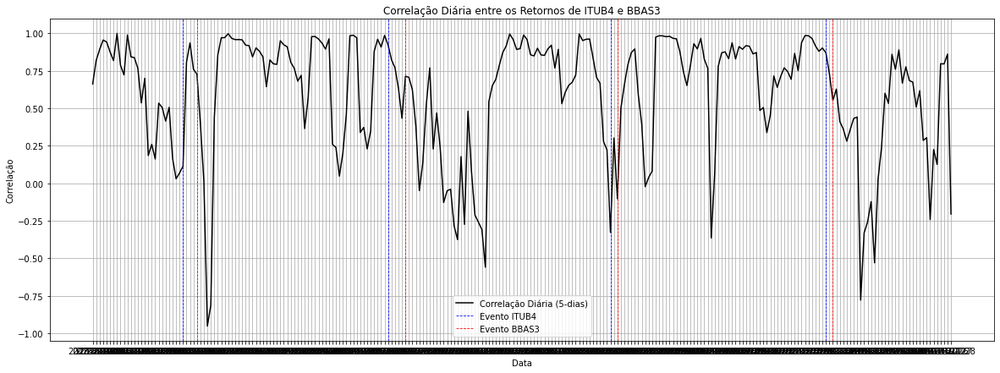

Datas das publicações 'ITUB4':
2023-02-07
2023-05-08
2023-08-07
2023-11-06

Datas das publicações 'BBAS3':
2023-02-13
2023-05-15
2023-08-09
2023-11-08


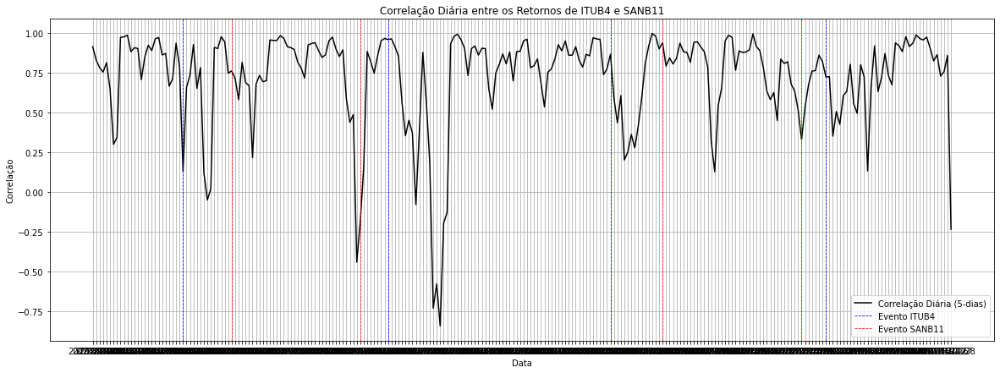

Datas das publicações 'ITUB4':
2023-02-07
2023-05-08
2023-08-07
2023-11-06

Datas das publicações 'SANB11':
2023-03-01
2023-04-25
2023-08-28
2023-10-25


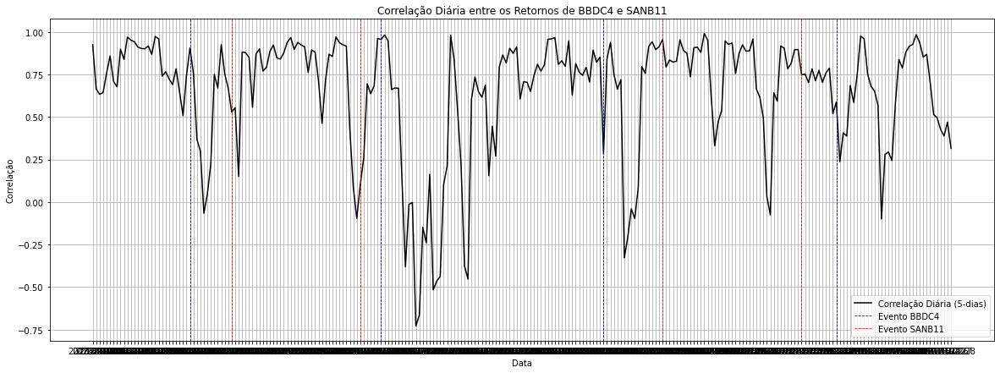

Datas das publicações 'BBDC4':
2023-02-09
2023-05-04
2023-08-03
2023-11-09

Datas das publicações 'SANB11':
2023-03-01
2023-04-25
2023-08-28
2023-10-25


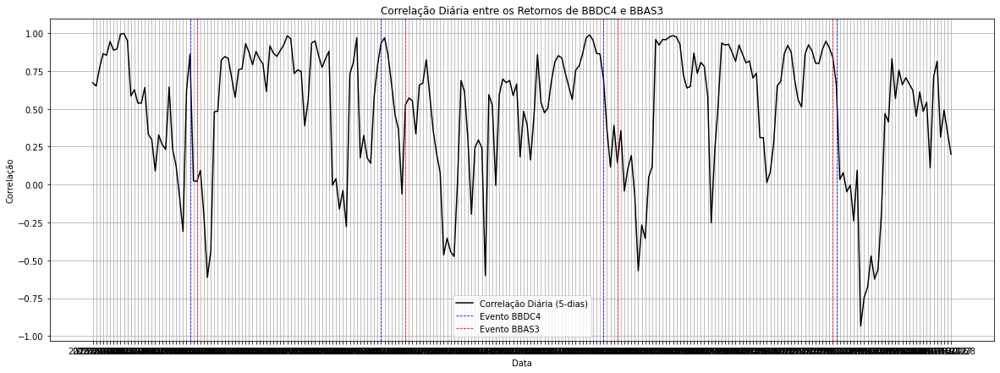

Datas das publicações 'BBDC4':
2023-02-09
2023-05-04
2023-08-03
2023-11-09

Datas das publicações 'BBAS3':
2023-02-13
2023-05-15
2023-08-09
2023-11-08


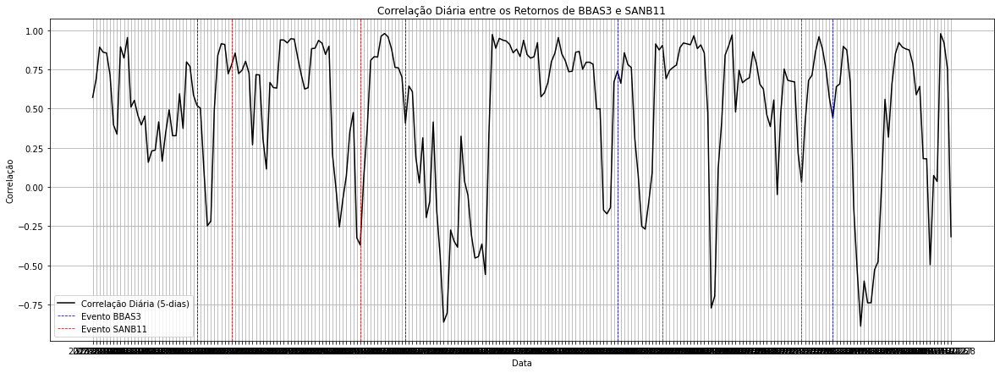

Datas das publicações 'BBAS3':
2023-02-13
2023-05-15
2023-08-09
2023-11-08

Datas das publicações 'SANB11':
2023-03-01
2023-04-25
2023-08-28
2023-10-25


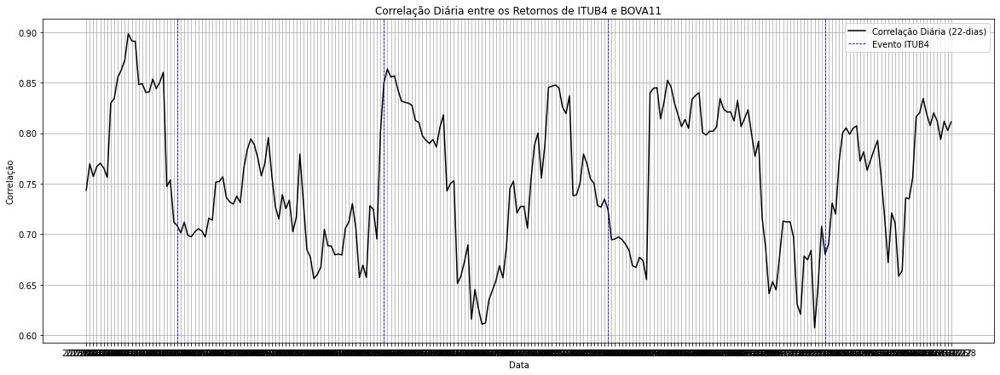

Datas das publicações 'ITUB4':
2023-02-07
2023-05-08
2023-08-07
2023-11-06

Datas das publicações 'BOVA11':


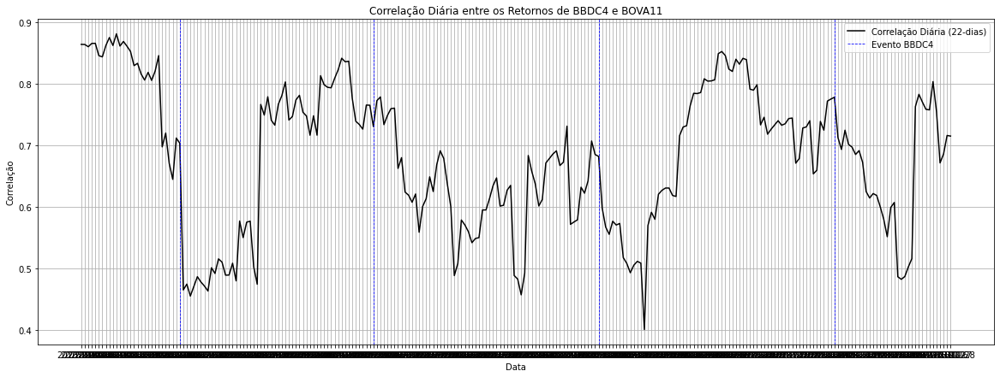

Datas das publicações 'BBDC4':
2023-02-09
2023-05-04
2023-08-03
2023-11-09

Datas das publicações 'BOVA11':


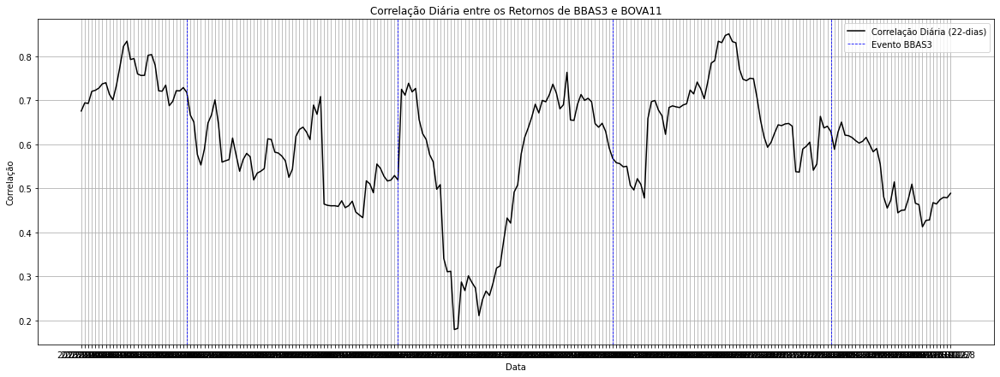

Datas das publicações 'BBAS3':
2023-02-13
2023-05-15
2023-08-09
2023-11-08

Datas das publicações 'BOVA11':


<ipython-input-35-4ae8c9c4971e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock_data['Cumulative_Return'] = (1 + stock_data[f'Daily_Return_{stock_name}']).rolling(window=int(window_size)).apply(lambda x: x.prod() - 1)


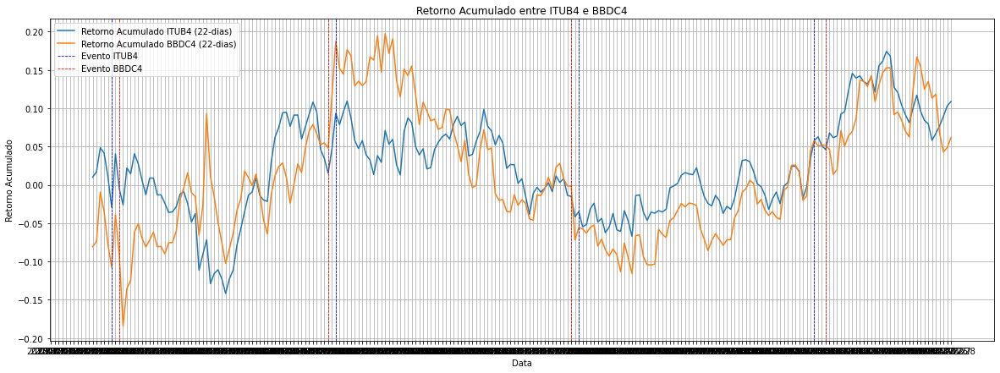

Datas das publicações 'ITUB4':
2023-02-07
2023-05-08
2023-08-07
2023-11-06

Datas das publicações 'BBDC4':
2023-02-09
2023-05-04
2023-08-03
2023-11-09


In [98]:
print("Setor Bancário:")
corr_pair('ITUB4', 'BBDC4', '2023-01-01', '2023-12-31', 5)
corr_pair('ITUB4', 'BBAS3', '2023-01-01', '2023-12-31', 5)
corr_pair('ITUB4', 'SANB11', '2023-01-01', '2023-12-31', 5)
corr_pair('BBDC4', 'SANB11', '2023-01-01', '2023-12-31', 5)
corr_pair('BBDC4', 'BBAS3', '2023-01-01', '2023-12-31', 5)
corr_pair('BBAS3', 'SANB11', '2023-01-01', '2023-12-31', 5)

#corr_pair('ITUB4', 'BOVA11', '2023-01-01', '2023-12-31', 22)
#corr_pair('BBDC4', 'BOVA11', '2023-01-01', '2023-12-31', 22)
#corr_pair('BBAS3', 'BOVA11', '2023-01-01', '2023-12-31', 22)
#compare_returns('ITUB4', 'BBDC4', '2023-01-01', '2023-12-31', 22)

Setor Materiais Básicos:


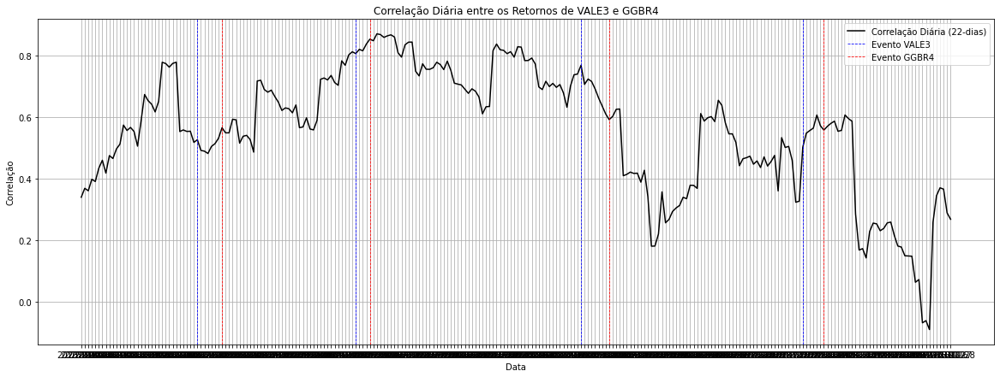

Datas das publicações 'VALE3':
2023-02-16
2023-04-26
2023-07-27
2023-10-26

Datas das publicações 'GGBR4':
2023-03-01
2023-05-03
2023-08-08
2023-11-06


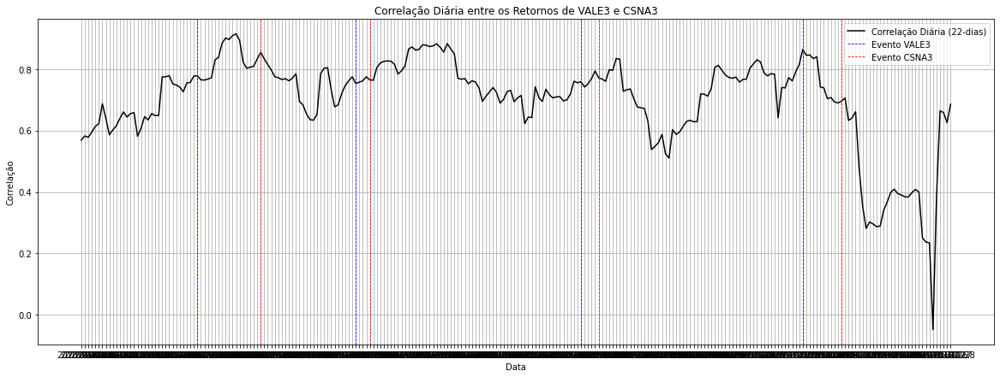

Datas das publicações 'VALE3':
2023-02-16
2023-04-26
2023-07-27
2023-10-26

Datas das publicações 'CSNA3':
2023-03-16
2023-05-03
2023-08-03
2023-11-13


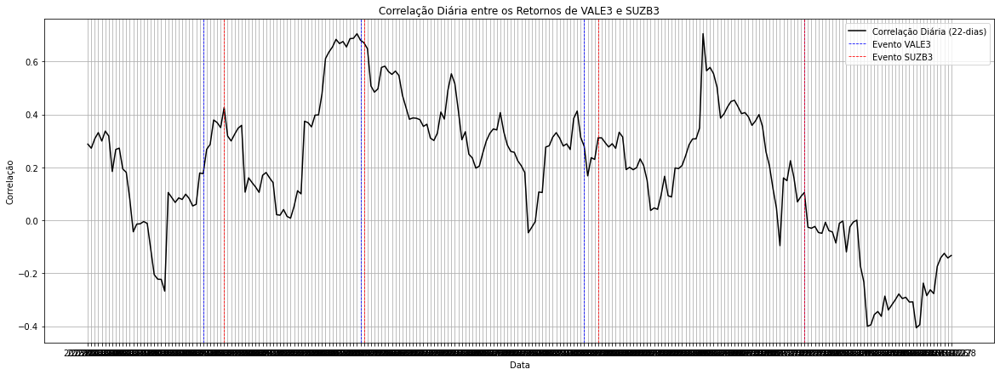

Datas das publicações 'VALE3':
2023-02-16
2023-04-26
2023-07-27
2023-10-26

Datas das publicações 'SUZB3':
2023-02-28
2023-04-27
2023-08-02
2023-10-26


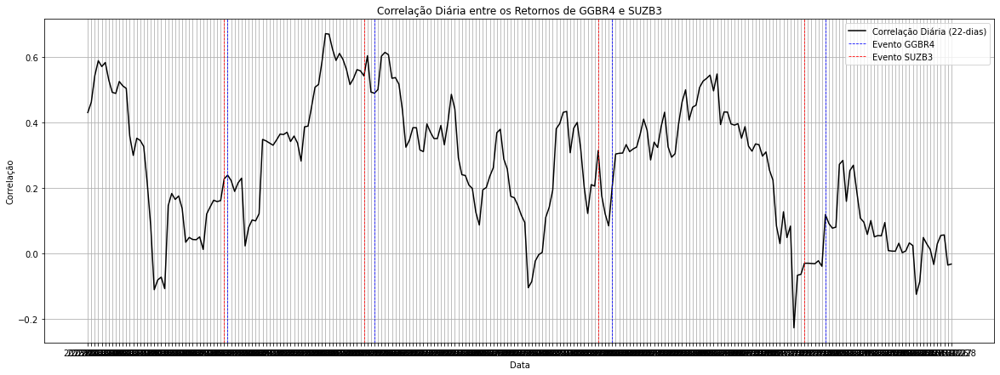

Datas das publicações 'GGBR4':
2023-03-01
2023-05-03
2023-08-08
2023-11-06

Datas das publicações 'SUZB3':
2023-02-28
2023-04-27
2023-08-02
2023-10-26


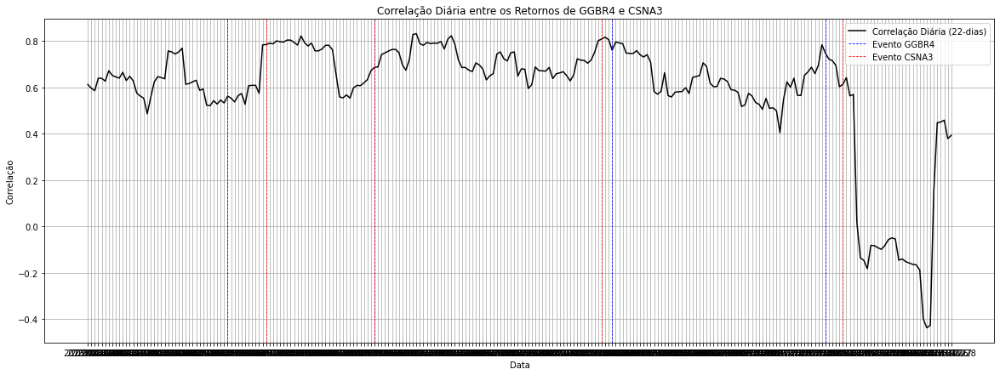

Datas das publicações 'GGBR4':
2023-03-01
2023-05-03
2023-08-08
2023-11-06

Datas das publicações 'CSNA3':
2023-03-16
2023-05-03
2023-08-03
2023-11-13


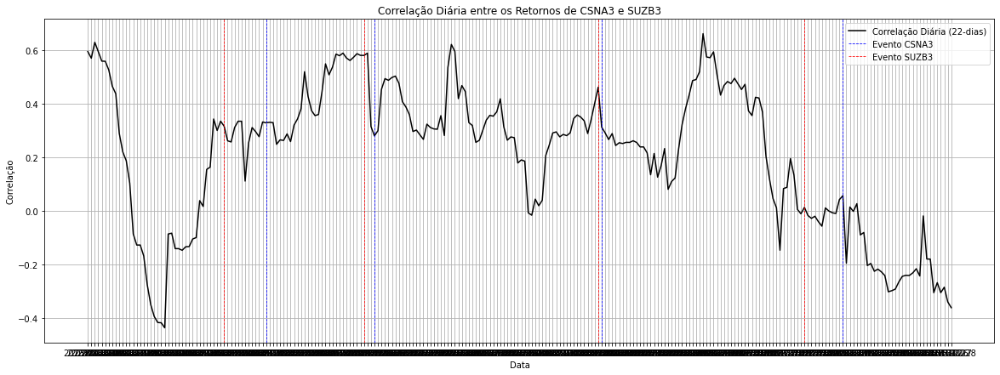

Datas das publicações 'CSNA3':
2023-03-16
2023-05-03
2023-08-03
2023-11-13

Datas das publicações 'SUZB3':
2023-02-28
2023-04-27
2023-08-02
2023-10-26
Setor Materiais Básicos:


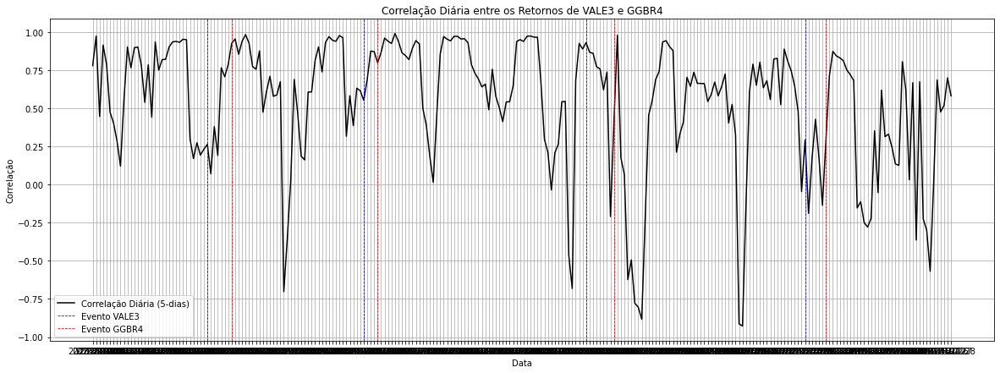

Datas das publicações 'VALE3':
2023-02-16
2023-04-26
2023-07-27
2023-10-26

Datas das publicações 'GGBR4':
2023-03-01
2023-05-03
2023-08-08
2023-11-06


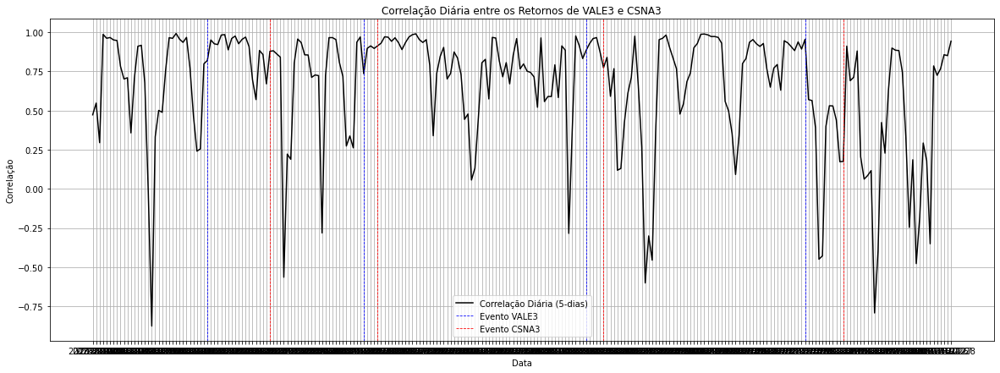

Datas das publicações 'VALE3':
2023-02-16
2023-04-26
2023-07-27
2023-10-26

Datas das publicações 'CSNA3':
2023-03-16
2023-05-03
2023-08-03
2023-11-13


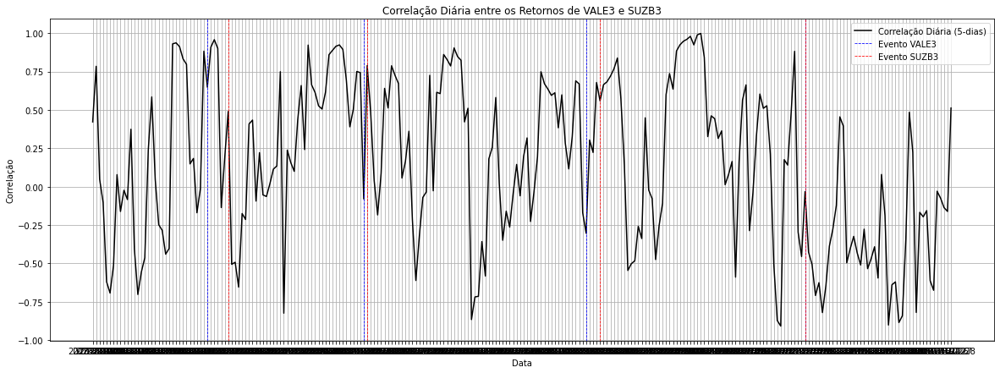

Datas das publicações 'VALE3':
2023-02-16
2023-04-26
2023-07-27
2023-10-26

Datas das publicações 'SUZB3':
2023-02-28
2023-04-27
2023-08-02
2023-10-26


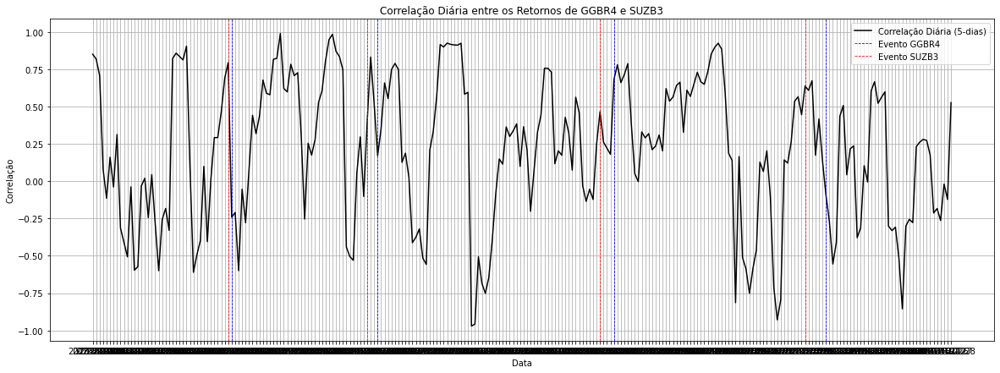

Datas das publicações 'GGBR4':
2023-03-01
2023-05-03
2023-08-08
2023-11-06

Datas das publicações 'SUZB3':
2023-02-28
2023-04-27
2023-08-02
2023-10-26


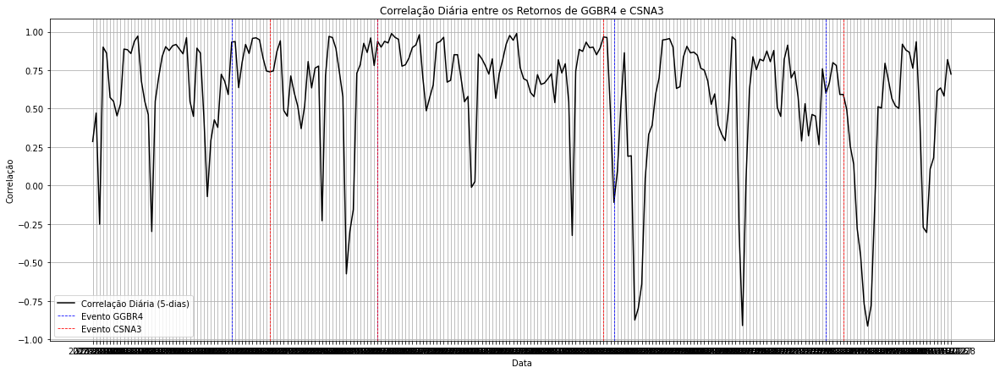

Datas das publicações 'GGBR4':
2023-03-01
2023-05-03
2023-08-08
2023-11-06

Datas das publicações 'CSNA3':
2023-03-16
2023-05-03
2023-08-03
2023-11-13


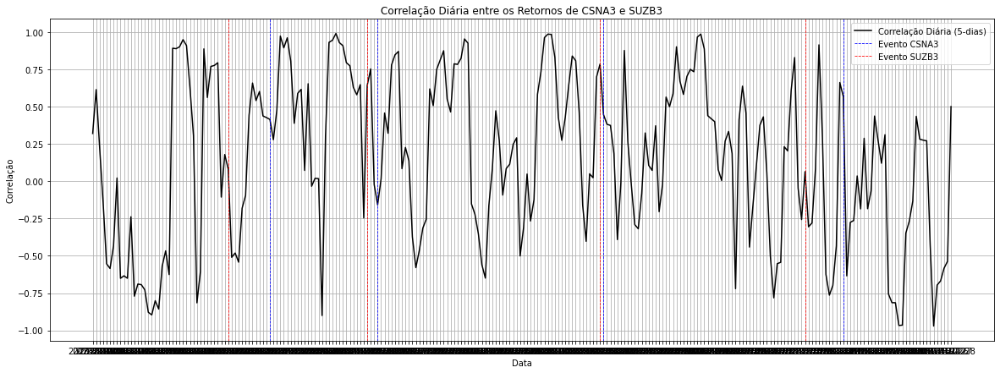

Datas das publicações 'CSNA3':
2023-03-16
2023-05-03
2023-08-03
2023-11-13

Datas das publicações 'SUZB3':
2023-02-28
2023-04-27
2023-08-02
2023-10-26


In [100]:
print("Setor Materiais Básicos:")
corr_pair('VALE3', 'GGBR4', '2023-01-01', '2023-12-31', 22)
corr_pair('VALE3', 'CSNA3', '2023-01-01', '2023-12-31', 22)
corr_pair('VALE3', 'SUZB3', '2023-01-01', '2023-12-31', 22)
corr_pair('GGBR4', 'SUZB3', '2023-01-01', '2023-12-31', 22)
corr_pair('GGBR4', 'CSNA3', '2023-01-01', '2023-12-31', 22)
corr_pair('CSNA3', 'SUZB3', '2023-01-01', '2023-12-31', 22)

print("Setor Materiais Básicos:")
corr_pair('VALE3', 'GGBR4', '2023-01-01', '2023-12-31', 5)
corr_pair('VALE3', 'CSNA3', '2023-01-01', '2023-12-31', 5)
corr_pair('VALE3', 'SUZB3', '2023-01-01', '2023-12-31', 5)
corr_pair('GGBR4', 'SUZB3', '2023-01-01', '2023-12-31', 5)
corr_pair('GGBR4', 'CSNA3', '2023-01-01', '2023-12-31', 5)
corr_pair('CSNA3', 'SUZB3', '2023-01-01', '2023-12-31', 5)

Setor Saude:


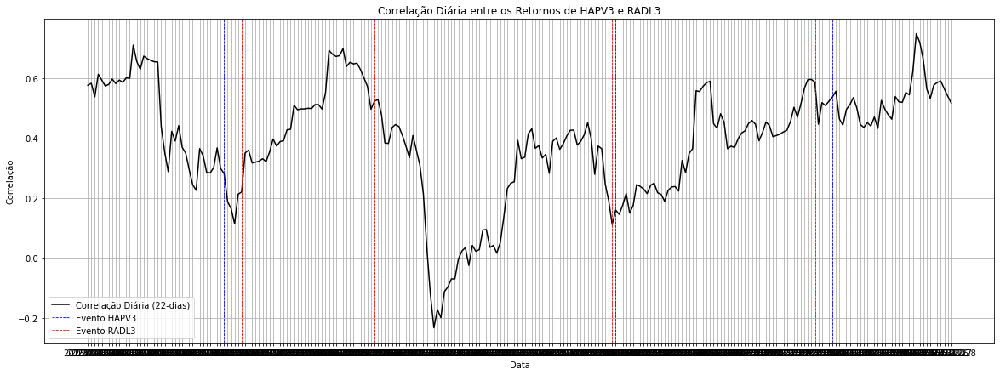

Datas das publicações 'HAPV3':
2023-02-28
2023-05-15
2023-08-09
2023-11-08

Datas das publicações 'RADL3':
2023-03-07
2023-05-03
2023-08-08
2023-10-31


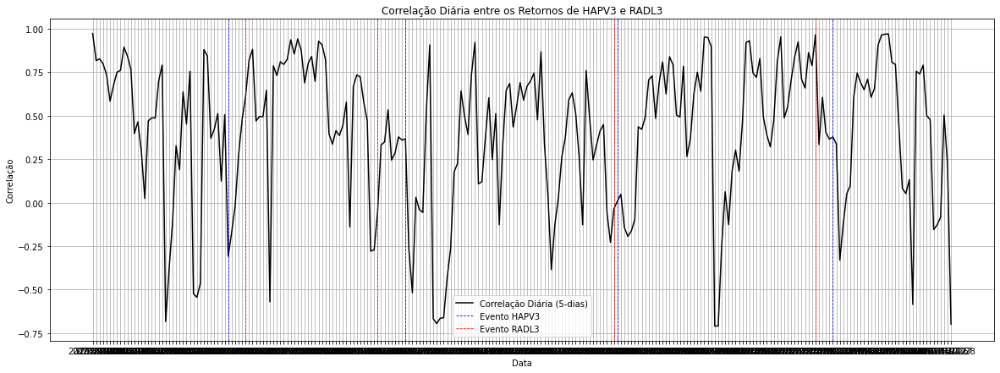

Datas das publicações 'HAPV3':
2023-02-28
2023-05-15
2023-08-09
2023-11-08

Datas das publicações 'RADL3':
2023-03-07
2023-05-03
2023-08-08
2023-10-31


In [101]:
print("Setor Saude:")
corr_pair('HAPV3', 'RADL3', '2023-01-01', '2023-12-31', 22)
corr_pair('HAPV3', 'RADL3', '2023-01-01', '2023-12-31', 5)


### Analise dentro de uma janela especifica:

In [194]:
## Media movel ponderada pelo volume
stock1_data = pd.read_csv(f"dataset/prices_processed/itub4.SA.csv")

In [195]:
stock1_data

,Date,event,Open,High,Low,Close,Adj Close,Volume,WClose,Daily_Return,Week_Return,Month_Return,Cumulative_std_Daily_Return,Cumulative_std_Week_Return,Cumulative_std_Month_Return,Indicator_Daily_Return,Indicator_Week_Return,Indicator_Month_Return
0,2010-01-04,0,17.708261,18.436810,17.708261,18.268333,10.207858,11843397,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
1,2010-01-05,0,18.313868,18.386723,18.168158,18.386723,10.274011,8593315,NaN,0.006460,NaN,NaN,NaN,NaN,NaN,0,0,0
2,2010-01-06,0,18.327526,18.436810,18.077089,18.227352,10.184958,10602572,NaN,-0.008706,NaN,NaN,0.010723,NaN,NaN,-1,0,0
3,2010-01-07,0,18.099855,18.236460,18.008787,18.040663,10.080639,9966567,NaN,-0.010295,NaN,NaN,0.009249,NaN,NaN,-1,0,0
4,2010-01-08,0,18.113516,18.113516,17.721922,17.767456,9.927980,9748709,NaN,-0.015260,NaN,NaN,0.009366,NaN,NaN,-1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3468,2023-12-21,0,32.750000,32.869999,32.549999,32.790001,31.130529,21813000,34.060576,0.006732,0.005812,0.074295,0.019700,0.045765,0.088128,1,1,1
3469,2023-12-22,0,32.820000,33.540001,32.799999,33.310001,31.624207,32650500,35.998260,0.015734,0.013297,0.083859,0.019699,0.045759,0.088125,1,1,1
3470,2023-12-26,0,33.369999,33.779999,33.230000,33.650002,31.947004,23135400,36.629509,0.010156,0.027721,0.095310,0.019697,0.045754,0.088125,1,1,1
3471,2023-12-27,0,33.610001,33.950001,33.570000,33.880001,32.165359,18176500,37.201332,0.006812,0.029656,0.107648,0.019694,0.045750,0.088129,1,1,1


<ipython-input-190-f0df257afbd0>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock_data['Cumulative_Return'] = (1 + stock_data[f'Daily_Return_{stock_name}']).rolling(window=int(window_size)).apply(lambda x: x.prod() - 1)


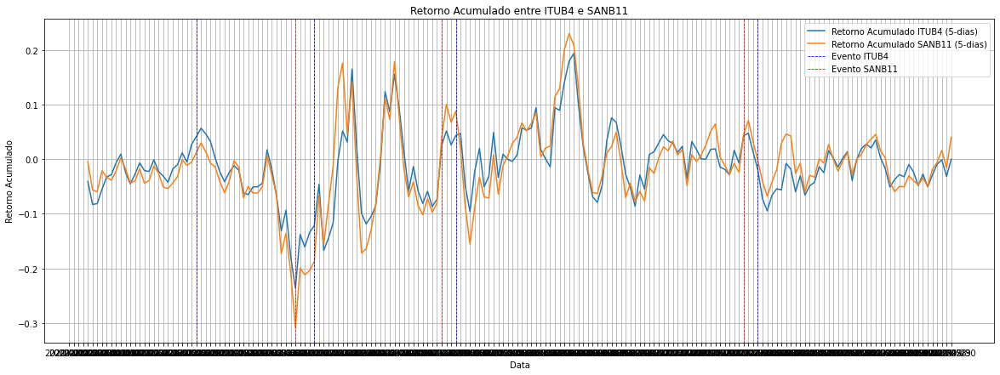

Datas das publicações 'ITUB4':
2020-02-10
2020-03-18
2020-05-04
2020-08-03

Datas das publicações 'SANB11':
2020-03-12
2020-04-28
2020-07-29


In [190]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_cumulative_return(stock_data, stock_name, window_size):
    # Calcular o retorno acumulado
    stock_data['Cumulative_Return'] = (1 + stock_data[f'Daily_Return_{stock_name}']).rolling(window=int(window_size)).apply(lambda x: x.prod() - 1)
    
    # Plotar o retorno acumulado
    plt.plot(stock_data['Date'], stock_data['Cumulative_Return'], label=f'Retorno Acumulado {stock_name} ({window_size}-dias)')

def compare_returns(stock1, stock2, start_date, end_date, window_size):
    # Carregar os dados
    stock1_data = pd.read_csv(f"dataset/prices_processed/{stock1}.SA.csv")
    stock2_data = pd.read_csv(f"dataset/prices_processed/{stock2}.SA.csv")
    
    # Filtrar as colunas relevantes
    stock1_return = stock1_data[['Date', 'event', 'Daily_Return']]
    stock2_return = stock2_data[['Date', 'event', 'Daily_Return']]
       
    # Mesclar os dados com base na data
    merged_data = pd.merge(stock1_return, stock2_return, on='Date', suffixes=(f'_{stock1}', f'_{stock2}'))
    
    # Filtrar o DataFrame com base nas datas fornecidas
    filtered_data = merged_data[(merged_data['Date'] >= start_date) & (merged_data['Date'] <= end_date)]

    # Separar os dados entre os períodos de publicação e fora deles
    period_event = filtered_data[(filtered_data[f'event_{stock1}'] == 1) | (filtered_data[f'event_{stock2}'] == 1)]
    
    # Calcular as janelas de publicação
    event_window = set()
    event_indices = period_event.index
    for idx in event_indices:
        # Adicionar o intervalo de - (window-1) até + (window-1) em torno do índice do evento
        for offset in range(- (int(window_size) - 1), int(window_size)):
            event_window.add(idx + offset)
    
    # Filtrar os períodos
    filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')
    filtered_data_event_window = filtered_data.loc[list(event_window)]

    # Criar o gráfico
    plt.figure(figsize=(20, 7))

    # Plotar o retorno acumulado para as duas ações
    plot_cumulative_return(filtered_data, stock1, window_size)
    plot_cumulative_return(filtered_data, stock2, window_size)
    
    # Adicionar marcações verticais para eventos
    event_stock1_dates = filtered_data[filtered_data[f'event_{stock1}'] == 1]['Date'].values
    event_stock2_dates = filtered_data[filtered_data[f'event_{stock2}'] == 1]['Date'].values
    
    # Adicionar linhas verticais para eventos do stock1
    for date in event_stock1_dates:
        plt.axvline(x=date, color='blue', linestyle='--', linewidth=0.8, label=f'Evento {stock1}' if date == event_stock1_dates[0] else "")
    
    # Adicionar linhas verticais para eventos do stock2
    for date in event_stock2_dates:
        plt.axvline(x=date, color='red', linestyle='--', linewidth=0.8, label=f'Evento {stock2}' if date == event_stock2_dates[0] else "")
    
    # Configurar o gráfico
    plt.xlabel('Data')
    plt.ylabel('Retorno Acumulado')
    plt.title(f'Retorno Acumulado entre {stock1} e {stock2}')
    plt.legend()
    plt.grid(True)
    
    # Exibir o gráfico
    plt.show()

    # Imprimir as datas dos eventos
    print(f"Datas das publicações '{stock1}':")
    for date in event_stock1_dates:
        print(date)
    
    print(f"\nDatas das publicações '{stock2}':")
    for date in event_stock2_dates:
        print(date)

# Chame a função com os parâmetros desejados
compare_returns('ITUB4', 'SANB11', '2020-01-01', '2020-1-31', 5)


## Análise de apenas uma empresa:

In [213]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import statsmodels.formula.api as smf
from tabulate import tabulate

# Função para realizar os testes estatísticos, sem o teste de Chow
def perform_tests(group1, group2, label1, label2):
    results = {}

    # Shapiro-Wilk Test
    shapiro_group1 = stats.shapiro(group1)
    shapiro_group2 = stats.shapiro(group2)
    results['Shapiro-Wilk Test'] = [shapiro_group1[0], shapiro_group1[1], shapiro_group2[0], shapiro_group2[1]]

    # Kolmogorov-Smirnov Test
    ks_stat, ks_p_value = stats.ks_2samp(group1, group2)
    results['Kolmogorov-Smirnov Test'] = [ks_stat, ks_p_value, None, None]

    # Levene Test
    levene_stat, levene_p_value = stats.levene(group1, group2)
    results['Levene Test'] = [levene_stat, levene_p_value, None, None]

    # Student's t-test
    t_stat, t_p_value = stats.ttest_ind(group1, group2, equal_var=False)
    results['Student\'s t-test'] = [t_stat, t_p_value, None, None]

    return results

# Função para realizar a análise completa
def analyze_groups(tests):
    results = {}
    for label1, label2, group1, group2 in tests:
        key = f'{label1} vs {label2}'
        results[key] = perform_tests(group1, group2, label1, label2)

    # Convertendo os resultados em DataFrame para exibição
    columns = ['Comparison', 'Test', 'Statistic_1', 'p-value_1', 'Statistic_2', 'p-value_2']
    data = []
    for key, value in results.items():
        for test, result in value.items():
            row = [test] + result
            row.insert(0, key)
            data.append(row)

    results_df = pd.DataFrame(data, columns=['Comparison', 'Test', 'Statistic_1', 'p-value_1', 'Statistic_2', 'p-value_2'])

    # Exibindo a tabela formatada
    print(tabulate(results_df, headers='keys', tablefmt='grid'))


### Análise do retorno ajustado

In [6]:

import pandas as pd
import numpy as np
import scipy.stats as stats
import statsmodels.formula.api as smf
from tabulate import tabulate

def separate_returns(stock1, start_date, end_date, window_size):
    # Carregar os dados
    stock1_data = pd.read_csv(f"dataset/prices_processed/{stock1}.SA.csv")
        
    # Filtrar as colunas relevantes
    stock1_return = stock1_data[['Date', 'event', 'Daily_Return']]
    
    # Converter a coluna de datas para o tipo datetime
    stock1_return['Date'] = pd.to_datetime(stock1_return['Date'])
    
    # Filtrar o DataFrame com base nas datas fornecidas
    filtered_data = stock1_return[(stock1_return['Date'] >= start_date) & (stock1_return['Date'] <= end_date)]

    # Separar os dados entre os períodos de publicação (event == 1)
    period_event = filtered_data[filtered_data['event'] == 1]
    
    # Calcular as janelas de publicação
    event_window = set()
    event_indices = period_event.index
    for idx in event_indices:
        # Adicionar o intervalo de -(window-1) até + (window-1) em torno do índice do evento
        for offset in range(- (int(window_size) - 1), int(window_size)):
            event_window.add(idx + offset)               
    
    # Garantir que os índices da janela de eventos sejam válidos
    event_window = set(filter(lambda x: x in filtered_data.index, event_window))
    
    # Filtrar os retornos fora das janelas de publicação
    filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')
    
    # Filtrar os retornos dentro das janelas de publicação
    filtered_data_event_window = filtered_data.loc[list(event_window)]
    
    # Retornar duas distribuições: fora das janelas de eventos e dentro delas
    return filtered_data_no_event_window['Daily_Return'], filtered_data_event_window['Daily_Return']



<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [215]:
returns_no_event_window, returns_event_window = separate_returns('ITUB4', '2020-01-01', '2020-12-31', 5)

# Visualizar as distribuições
print("Retornos fora das janelas de eventos:")
print(returns_no_event_window.describe())

print("\nRetornos dentro das janelas de eventos:")
print(returns_event_window.describe())



Retornos fora das janelas de eventos:
count    203.000000
mean      -0.000331
std        0.026072
min       -0.084940
25%       -0.016938
50%       -0.000298
75%        0.015357
max        0.070991
Name: Daily_Return, dtype: float64

Retornos dentro das janelas de eventos:
count    45.000000
mean     -0.001486
std       0.045279
min      -0.103367
25%      -0.028908
50%      -0.001173
75%       0.023245
max       0.104894
Name: Daily_Return, dtype: float64


<ipython-input-214-2642dfabbfa1>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock1_return['Date'] = pd.to_datetime(stock1_return['Date'])


In [216]:
tests = [
    ('Retornos fora das janelas de eventos', 'Retornos dentro das janelas de eventos', returns_no_event_window, returns_event_window)]

analyze_groups(tests)


+----+--------------------------------------------------------------------------------+-------------------------+---------------+-------------+---------------+-------------+
|    | Comparison                                                                     | Test                    |   Statistic_1 |   p-value_1 |   Statistic_2 |   p-value_2 |
+====+================================================================================+=========================+===============+=============+===============+=============+
|  0 | Retornos fora das janelas de eventos vs Retornos dentro das janelas de eventos | Shapiro-Wilk Test       |      0.991902 | 0.320954    |      0.983137 |    0.747378 |
+----+--------------------------------------------------------------------------------+-------------------------+---------------+-------------+---------------+-------------+
|  1 | Retornos fora das janelas de eventos vs Retornos dentro das janelas de eventos | Kolmogorov-Smirnov Test |      0.175588 | 

### Análise do preço ajustado:
###### Métrica WClose (preço ajustado ponderado pelo volume)
stock1_data['WClose'] = stock1_data['Adj Close'] * stock1_data['Volume'] / stock1_data['Volume'].mean()

###### Suavizar WClose usando o window_size fornecido
stock1_data['WClose'] = stock1_data['WClose'].rolling(window=window_size).mean()


In [232]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import statsmodels.formula.api as smf
from tabulate import tabulate

def separate_wclose(stock1, start_date, end_date, window_size):
    # Carregar os dados
    stock1_data = pd.read_csv(f"dataset/prices_processed/{stock1}.SA.csv")
    
    # Filtrar as colunas relevantes
    stock1_data = stock1_data[['Date', 'event', 'Adj Close', 'Volume']]
    
    # Converter a coluna de datas para o tipo datetime
    stock1_data['Date'] = pd.to_datetime(stock1_data['Date'])
    
    # Calcular a métrica WClose (preço ajustado ponderado pelo volume)
    WClose_ADJV = stock1_data['Adj Close'] * stock1_data['Volume'] 
        
    # Suavizar WClose usando o window_size fornecido
    VOL = stock1_data['Volume'].rolling(window=window_size).mean()  
    stock1_data['WClose'] = WClose_ADJV/VOL
    
    # Filtrar o DataFrame com base nas datas fornecidas
    filtered_data = stock1_data[(stock1_data['Date'] >= start_date) & (stock1_data['Date'] <= end_date)]
    
    # Separar os dados entre os períodos de publicação (event == 1)
    period_event = filtered_data[filtered_data['event'] == 1]
    
    # Calcular as janelas de publicação
    event_window = set()
    event_indices = period_event.index
    for idx in event_indices:
        # Adicionar o intervalo de -(window-1) até + (window-1) em torno do índice do evento
        for offset in range(- (int(window_size) - 1), int(window_size)):
            event_window.add(idx + offset)
    
    # Garantir que os índices da janela de eventos sejam válidos
    event_window = set(filter(lambda x: x in filtered_data.index, event_window))
    
    # Filtrar os valores de WClose fora das janelas de publicação
    filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')
    
    # Filtrar os valores de WClose dentro das janelas de publicação
    filtered_data_event_window = filtered_data.loc[list(event_window)]
    
    # Retornar duas distribuições: fora das janelas de eventos e dentro delas
    return filtered_data_no_event_window['WClose'], filtered_data_event_window['WClose']

<Axes: >

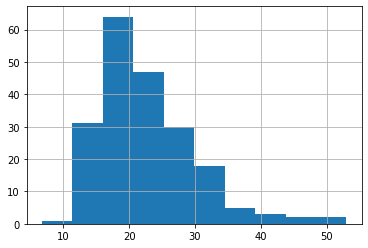

In [235]:
wclose_no_event_window.hist()

<Axes: >

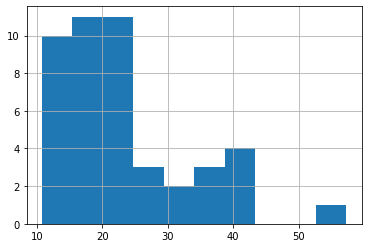

In [236]:
wclose_event_window.hist()

In [237]:
# Chamada da função com os parâmetros fornecidos
wclose_no_event_window, wclose_event_window = separate_wclose('ITUB4', '2020-01-01', '2020-12-31', 5)
# Visualizar as distribuições
print("Preço fora das janelas de eventos:")
print(wclose_no_event_window.describe())

print("\Preço dentro das janelas de eventos:")
print(wclose_event_window.describe())

Preço fora das janelas de eventos:
count    203.000000
mean      22.498970
std        7.465254
min        6.766344
25%       17.578670
50%       21.147455
75%       26.971590
max       52.996138
Name: WClose, dtype: float64
\Preço dentro das janelas de eventos:
count    45.000000
mean     23.249718
std       9.859362
min      10.793776
25%      16.544984
50%      20.390575
75%      26.253009
max      57.291555
Name: WClose, dtype: float64


In [233]:
# Chamada da função com os parâmetros fornecidos
wclose_no_event_window, wclose_event_window = separate_wclose('ITUB4', '2020-01-01', '2020-12-31', 5)
# Visualizar as distribuições
print("Preço fora das janelas de eventos:")
print(wclose_no_event_window.describe())

print("\Preço dentro das janelas de eventos:")
print(wclose_event_window.describe())

Preço fora das janelas de eventos:
count    203.000000
mean      22.498970
std        7.465254
min        6.766344
25%       17.578670
50%       21.147455
75%       26.971590
max       52.996138
Name: WClose, dtype: float64
\Preço dentro das janelas de eventos:
count    45.000000
mean     23.249718
std       9.859362
min      10.793776
25%      16.544984
50%      20.390575
75%      26.253009
max      57.291555
Name: WClose, dtype: float64


In [239]:
tests = [
    ('Preço ponderado fora da janela', 'Preço ponderado na janela', wclose_no_event_window, wclose_event_window)]

analyze_groups(tests)


+----+-------------------------------------------------------------+-------------------------+---------------+-------------+---------------+---------------+
|    | Comparison                                                  | Test                    |   Statistic_1 |   p-value_1 |   Statistic_2 |     p-value_2 |
+====+=============================================================+=========================+===============+=============+===============+===============+
|  0 | Preço ponderado fora da janela vs Preço ponderado na janela | Shapiro-Wilk Test       |      0.924873 | 1.10745e-08 |      0.860719 |   6.99306e-05 |
+----+-------------------------------------------------------------+-------------------------+---------------+-------------+---------------+---------------+
|  1 | Preço ponderado fora da janela vs Preço ponderado na janela | Kolmogorov-Smirnov Test |      0.131034 | 0.505739    |    nan        | nan           |
+----+----------------------------------------------------

### Analise usando retorno ponderado

In [208]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import statsmodels.formula.api as smf
from tabulate import tabulate

def separate_wreturn(stock1, start_date, end_date, window_size, period):
    # Carregar os dados
    stock1_data = pd.read_csv(f"dataset/prices_processed/{stock1}.SA.csv")
    
    # Calcular a métrica WClose (preço ajustado ponderado pelo volume)
    stock1_data['WClose'] = stock1_data['Adj Close'] * stock1_data['Volume'] / stock1_data['Volume'].mean()
    
    # Suavizar WClose usando o window_size fornecido
    stock1_data['WClose'] = stock1_data['WClose'].rolling(window=window_size).mean()
    
    # Calcular o retorno logarítmico de WClose
    stock1_data['WClose_Return'] = np.log(stock1_data['WClose'] / stock1_data['WClose'].shift(period))
    
    # Filtrar as colunas relevantes
    stock1_return = stock1_data[['Date', 'event', 'WClose_Return']]
    
    # Converter a coluna de datas para o tipo datetime
    stock1_return['Date'] = pd.to_datetime(stock1_return['Date'])
    
    # Filtrar o DataFrame com base nas datas fornecidas
    filtered_data = stock1_return[(stock1_return['Date'] >= start_date) & (stock1_return['Date'] <= end_date)]

    # Separar os dados entre os períodos de publicação (event == 1)
    period_event = filtered_data[filtered_data['event'] == 1]
    
    # Calcular as janelas de publicação
    event_window = set()
    event_indices = period_event.index
    for idx in event_indices:
        # Adicionar o intervalo de -(window-1) até + (window-1) em torno do índice do evento
        for offset in range(- (int(window_size) - 1), int(window_size)):
            event_window.add(idx + offset)               
    
    # Garantir que os índices da janela de eventos sejam válidos
    event_window = set(filter(lambda x: x in filtered_data.index, event_window))
    
    # Filtrar os retornos fora das janelas de publicação
    filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')
    
    # Filtrar os retornos dentro das janelas de publicação
    filtered_data_event_window = filtered_data.loc[list(event_window)]
    
    # Retornar duas distribuições: fora das janelas de eventos e dentro delas
    return filtered_data_no_event_window['WClose_Return'], filtered_data_event_window['WClose_Return']


In [227]:
# Chamada da função com os parâmetros fornecidos
w_return_no_event_window, wreturn_event_window = separate_wreturn('ITUB4', '2020-01-01', '2020-12-31', 5, 1)
print("Preço fora das janelas de eventos:")
print(w_return_no_event_window.describe())

print("\Preço dentro das janelas de eventos:")
print(wreturn_event_window.describe())

Preço fora das janelas de eventos:
count    203.000000
mean      -0.007218
std        0.102270
min       -0.355293
25%       -0.058568
50%       -0.005806
75%        0.054988
max        0.322638
Name: WClose_Return, dtype: float64
\Preço dentro das janelas de eventos:
count    45.000000
mean      0.035338
std       0.123162
min      -0.152044
25%      -0.055891
50%       0.015779
75%       0.091487
max       0.421638
Name: WClose_Return, dtype: float64


<ipython-input-208-ffdd29b20b4a>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock1_return['Date'] = pd.to_datetime(stock1_return['Date'])


In [229]:
tests = [
    ('Retorno ponderado fora da janela', 'Retorno ponderado na janela', w_return_no_event_window, wreturn_event_window)]

analyze_groups(tests)

+----+-----------------------------------------------------------------+-------------------------+---------------+-------------+---------------+-------------+
|    | Comparison                                                      | Test                    |   Statistic_1 |   p-value_1 |   Statistic_2 |   p-value_2 |
+====+=================================================================+=========================+===============+=============+===============+=============+
|  0 | Retorno ponderado fora da janela vs Retorno ponderado na janela | Shapiro-Wilk Test       |      0.980827 |  0.00714822 |      0.947328 |   0.0402715 |
+----+-----------------------------------------------------------------+-------------------------+---------------+-------------+---------------+-------------+
|  1 | Retorno ponderado fora da janela vs Retorno ponderado na janela | Kolmogorov-Smirnov Test |      0.168363 |  0.219652   |    nan        | nan         |
+----+----------------------------------------

### Analise do volume

In [240]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import statsmodels.formula.api as smf
from tabulate import tabulate

def separate_wclose(stock1, start_date, end_date, window_size):
    # Carregar os dados
    stock1_data = pd.read_csv(f"dataset/prices_processed/{stock1}.SA.csv")
    
    # Filtrar as colunas relevantes
    stock1_data = stock1_data[['Date', 'event', 'Adj Close', 'Volume']]
    
    # Converter a coluna de datas para o tipo datetime
    stock1_data['Date'] = pd.to_datetime(stock1_data['Date'])
    
    # Calcular a métrica WClose (preço ajustado ponderado pelo volume)
    #WClose_ADJV = stock1_data['Adj Close'] * stock1_data['Volume'] 
        
    # Suavizar WClose usando o window_size fornecido
    VOL = stock1_data['Volume'].rolling(window=window_size).mean()  
    stock1_data['Adj_Vol'] = stock1_data['Volume']/VOL
    
    # Filtrar o DataFrame com base nas datas fornecidas
    filtered_data = stock1_data[(stock1_data['Date'] >= start_date) & (stock1_data['Date'] <= end_date)]
    
    # Separar os dados entre os períodos de publicação (event == 1)
    period_event = filtered_data[filtered_data['event'] == 1]
    
    # Calcular as janelas de publicação
    event_window = set()
    event_indices = period_event.index
    for idx in event_indices:
        # Adicionar o intervalo de -(window-1) até + (window-1) em torno do índice do evento
        for offset in range(- (int(window_size) - 1), int(window_size)):
            event_window.add(idx + offset)
    
    # Garantir que os índices da janela de eventos sejam válidos
    event_window = set(filter(lambda x: x in filtered_data.index, event_window))
    
    # Filtrar os valores de WClose fora das janelas de publicação
    filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')
    
    # Filtrar os valores de WClose dentro das janelas de publicação
    filtered_data_event_window = filtered_data.loc[list(event_window)]
    
    # Retornar duas distribuições: fora das janelas de eventos e dentro delas
    return filtered_data_no_event_window['Adj_Vol'], filtered_data_event_window['Adj_Vol']

In [244]:
stock1_data = pd.read_csv(f"dataset/prices_processed/ITUB4.SA.csv")
stock1_data = stock1_data[['Date', 'event', 'Adj Close', 'Volume']]
# Calcular a métrica WClose (preço ajustado ponderado pelo volume)
#WClose_ADJV = stock1_data['Adj Close'] * stock1_data['Volume'] 
    
# Suavizar WClose usando o window_size fornecido
VOL = stock1_data['Volume'].rolling(window=5).mean()  
stock1_data['Adj_Vol'] = stock1_data['Volume']/VOL

In [250]:
stock1_data.head()

,Date,event,Adj Close,Volume,Adj_Vol
0,2010-01-04,0,10.207858,11843397,NaN
1,2010-01-05,0,10.274011,8593315,NaN
2,2010-01-06,0,10.184958,10602572,NaN
3,2010-01-07,0,10.080639,9966567,NaN
4,2010-01-08,0,9.927980,9748709,0.960378


In [256]:
len(stock1_data[stock1_data.Volume>0])

3439

In [241]:
# Chamada da função com os parâmetros fornecidos
w_vol_no_event_window, w_vol_event_window = separate_wreturn('ITUB4', '2020-01-01', '2020-12-31', 5, 1)
print("Preço fora das janelas de eventos:")
print(w_vol_no_event_window.describe())

print("\Preço dentro das janelas de eventos:")
print(w_vol_event_window.describe())

<ipython-input-208-ffdd29b20b4a>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock1_return['Date'] = pd.to_datetime(stock1_return['Date'])


Preço fora das janelas de eventos:
count    203.000000
mean      -0.007218
std        0.102270
min       -0.355293
25%       -0.058568
50%       -0.005806
75%        0.054988
max        0.322638
Name: WClose_Return, dtype: float64
\Preço dentro das janelas de eventos:
count    45.000000
mean      0.035338
std       0.123162
min      -0.152044
25%      -0.055891
50%       0.015779
75%       0.091487
max       0.421638
Name: WClose_Return, dtype: float64


In [32]:
import numpy as np
stock1_data = pd.read_csv(f"dataset/prices_processed/ITUB4.SA.csv")
start_date = '2020-01-01'
end_date = '2020-12-31'
window_size = 5

# Calcular a métrica WClose (preço ajustado ponderado pelo volume)
stock1_data['WClose'] = stock1_data['Adj Close'] * stock1_data['Volume'] / stock1_data['Volume'].mean()
    
# Suavizar WClose usando o window_size fornecido
stock1_data['WClose'] = stock1_data['WClose'].rolling(window=window_size).mean()
    
# Calcular o retorno logarítmico de WClose
stock1_data['WClose_Return'] = np.log(stock1_data['WClose'] / stock1_data['WClose'].shift(1))
    
# Filtrar as colunas relevantes
stock1_return = stock1_data[['Date', 'event', 'WClose_Return']]
    
# Converter a coluna de datas para o tipo datetime
stock1_return['Date'] = pd.to_datetime(stock1_return['Date'])
    
# Filtrar o DataFrame com base nas datas fornecidas
filtered_data = stock1_return[(stock1_return['Date'] >= start_date) & (stock1_return['Date'] <= end_date)]

<ipython-input-32-5044591a6fab>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock1_return['Date'] = pd.to_datetime(stock1_return['Date'])


In [33]:
filtered_data


,Date,event,WClose_Return
2480,2020-01-02,0,-0.044385
2481,2020-01-03,0,0.173529
2482,2020-01-06,0,0.065733
2483,2020-01-07,0,0.063532
2484,2020-01-08,0,0.149572
...,...,...,...
2723,2020-12-22,0,-0.038633
2724,2020-12-23,0,-0.173001
2725,2020-12-28,0,-0.019771
2726,2020-12-29,0,-0.147686


In [34]:
analyze_event_impact(filtered_data,5)

<ipython-input-28-221c8df04cb0>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Rank'] = df[column_name].rank(method='first')  # Ranking simples
<ipython-input-28-221c8df04cb0>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Magnitude_Ponderada'] = df['Rank'] * df[column_name].abs()  # Ponderação pela magnitude do retorno


,Event_Date,Event_Mean_Rank,Non_Event_Mean_Rank,Mann-Whitney_U,p_value
0,2020-02-10,48.956167,13.940259,6.0,0.285714
1,2020-03-18,16.384415,12.515222,5.0,0.571429
2,2020-05-04,2.329063,7.297830,1.0,0.571429
3,2020-08-03,3.571646,18.514326,4.0,1.000000
4,2020-11-03,2.287887,13.927343,0.0,0.333333


In [16]:
from statsmodels.tsa.stattools import grangercausalitytests

# Passo 2: Verificar se o DataFrame está organizado corretamente
# Filtrar apenas as colunas relevantes
data = filtered_data[['Date', 'event', 'WClose_Return']]

# Passo 3: Configurar a série temporal
# O teste de Granger precisa que os dados estejam em formato de array
# Organize os dados colocando 'WClose_Return' e 'event' lado a lado.
# A primeira coluna será a série a ser prevista (WClose_Return) e a segunda será o evento.
data_for_test = data[['WClose_Return', 'event']]

# Passo 4: Aplicar o teste de Granger
# O parâmetro 'maxlag' define quantos períodos anteriores serão considerados (lag).
# Aqui, testamos até 3 lags como exemplo.
granger_result = grangercausalitytests(data_for_test, maxlag=12, verbose=True)

# Passo 5: Interpretar o resultado
# O teste de Granger retornará os p-valores para cada lag testado.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=32.7790 , p=0.0000  , df_denom=992, df_num=1
ssr based chi2 test:   chi2=32.8782 , p=0.0000  , df=1
likelihood ratio test: chi2=32.3466 , p=0.0000  , df=1
parameter F test:         F=32.7790 , p=0.0000  , df_denom=992, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=17.2225 , p=0.0000  , df_denom=989, df_num=2
ssr based chi2 test:   chi2=34.6191 , p=0.0000  , df=2
likelihood ratio test: chi2=34.0298 , p=0.0000  , df=2
parameter F test:         F=17.2225 , p=0.0000  , df_denom=989, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=11.6030 , p=0.0000  , df_denom=986, df_num=3
ssr based chi2 test:   chi2=35.0562 , p=0.0000  , df=3
likelihood ratio test: chi2=34.4516 , p=0.0000  , df=3
parameter F test:         F=11.6030 , p=0.0000  , df_denom=986, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=8.7823  , p=0.0000  

### Nova proposta de analise

######
Pensei em criar uma nova metodologia para verificar a anormalidade dos retornos, considerando 
que terei poucas amostras. Considerando que os retornos podem ser complexos, pensei em uma abordagem que fosse mais robusta e não linear. Primeiro, faço o rank dos log-retornos, mas excluindo os retornos relacionados como próximos a divulgação do balanço: a ideia é comparar se essa amostra relacionada aos retornos com o restante. Depois, pego os valores relacionados a divulgação dos resultados e verifico suas posições no rank. Assim, por exemplo, fazendo uma média dessas posições eu teria uma indicação da posição média. Se dividirmos esse valor médio pela quantidade de valores no rank, teremos um valor que será no máximo 1 e no mínimo 0, sendo 0.5 indicando um valor normal e esperado pela amostra. Critique essa abordagem como se fosse um especialista na área e verifica se é boa e inovadora.



In [220]:
#Funções de posição de rank e analise
#1° Separar em retornos sem influência e retornos com influência
#2° Fazer o ranking dos log retornos sem influência
#3° Verificar a posição dos logretornos com influência no ranking dos logretornos sem influência
#4° Fazer uma média da posição dos log retornos com influência
#5° Dividir a média pela quantidade de valores do ranking
#6° Se 0.5: Valor normal, diferente de 0.5 tem influência.


def find_position_in_rank(filtered_data_event_window, data_rank_no_event):
    # Verifica se as colunas necessárias existem nos DataFrames
    if 'WClose_Return' not in filtered_data_event_window.columns or 'WClose_Return' not in data_rank_no_event.columns:
        raise ValueError("Filtered data or data rank does not contain 'WClose_Return' column.")

    # Fazendo o merge com base nos retornos
    positions = filtered_data_event_window.merge(data_rank_no_event[['WClose_Return', 'rank']], on='WClose_Return', how='left')

    # Renomeando a coluna 'rank' para indicar que é a posição no ranking
    positions = positions.rename(columns={'rank': 'position_in_rank'})

    # Encontrando a posição sucessora para valores que não estão em data_rank_no_event
    # Criar uma máscara para os NaN
    nan_mask = positions['position_in_rank'].isna()
    
    data_rank_no_event_order=data_rank_no_event.sort_values(by='rank')

    if nan_mask.any():  # Se existirem valores NaN
        # Para os valores que não estão no rank, encontramos a posição sucessora
        for index in positions[nan_mask].index:
            current_value = positions.at[index, 'WClose_Return']
            # Encontrar o menor número no data_rank_no_event que seja maior que o valor atual
            greater_than_value = data_rank_no_event_order[data_rank_no_event_order['WClose_Return'] > current_value]
            if not greater_than_value.empty:
                # Pegar a primeira posição maior
                position = greater_than_value['rank'].min()  # A menor posição entre os maiores
                positions.at[index, 'position_in_rank'] = position - 1  # Atribui a posição sucessora
            else:
                last_rank = data_rank_no_event_order['rank'].max()  # Última posição do rank
                positions.at[index, 'position_in_rank'] = last_rank  # Atribui a última posição                

    return positions


def analyze_rank(stock, start_date, end_date, window_size):
    # Converter window_size para inteiro
    window_size = int(window_size)  # Converte window_size para inteiro

    # Carregar os dados
    stock_data = pd.read_csv(f"dataset/prices_processed/{stock}.SA.csv")
    
    # Calcular a métrica WClose (preço ajustado ponderado pelo volume)
    stock_data['WClose'] = stock_data['Adj Close'] * stock_data['Volume'] / stock_data['Volume'].mean()
    
    # Suavizar WClose usando o window_size fornecido
    stock_data['WClose'] = stock_data['WClose'].rolling(window=window_size).mean()
    
    # Calcular o retorno logarítmico de WClose
    stock_data['WClose_Return'] = np.log(stock_data['WClose'] / stock_data['WClose'].shift(1))
    stock_return = stock_data[['Date', 'event', 'WClose_Return']]
    
    # Filtrar o DataFrame com base nas datas fornecidas
    filtered_data = stock_return[(stock_return['Date'] >= start_date) & (stock_return['Date'] <= end_date)]
    
    # Separar os dados entre os períodos de publicação e fora deles
    period_event = filtered_data[filtered_data['event'] == 1]

    # Calcular as janelas de publicação:
    event_window = set()
    event_indices = period_event.index
    for idx in event_indices:    
        # Adicionar o intervalo de - (window-1) até + (window-1) em torno do índice do evento
        for offset in range(-(window_size - 1), window_size):
            event_window.add(idx + offset)
    
    # Filtrar os períodos    
    filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')
    filtered_data_event_window = filtered_data.loc[list(event_window)]
    
    # Rank dos log retornos sem influência
    data_rank_no_event = filtered_data_no_event_window.copy()  # Cria uma cópia para evitar o SettingWithCopyWarning
    data_rank_no_event['rank'] = data_rank_no_event['WClose_Return'].rank(method='first', pct=False)
    
    # Posição dos log retornos com influência
    data_rank_event = find_position_in_rank(filtered_data_event_window, data_rank_no_event)
    
    # Média das posições
    data_rank_event_mean = data_rank_event['position_in_rank'].mean()
    data_rank_event_std = data_rank_event['position_in_rank'].std()
    
    
    
    # Divisão pela quantidade de retornos
    factor = data_rank_event_mean / len(data_rank_no_event)
    
    return factor, data_rank_event_mean, data_rank_event, data_rank_no_event, filtered_data_event_window, data_rank_event_std


### Testes:

In [221]:
factor, data_rank_event_mean, data_rank_event, data_rank_no_event, filtered_data_event_window, data_rank_event_std = analyze_rank("BBAS3", '2012-01-01', '2022-12-31', '5')

In [218]:
data_rank_event_std

729.6140713276883

In [222]:
data_rank_no_event['rank'].std()

751.5656990576406

In [209]:
data_rank_no_event.sort_values(by='WClose_Return')

,Date,event,WClose_Return,rank
1546,2016-04-06,0,-3.156494,1.0
1223,2014-12-09,0,-2.050662,2.0
1545,2016-04-05,0,-0.844451,3.0
1222,2014-12-08,0,-0.762691,4.0
1035,2014-03-11,0,-0.519637,5.0
...,...,...,...,...
1030,2014-02-28,0,0.549725,2599.0
1552,2016-04-14,0,0.636418,2600.0
2760,2021-02-22,0,0.648739,2601.0
1217,2014-12-01,0,1.939353,2602.0


In [201]:
data_rank_event.sort_values(by='position_in_rank')

,Date,event,WClose_Return,position_in_rank
155,2021-10-29,0,-0.293377,30.0
227,2022-11-08,0,-0.275552,43.0
128,2013-04-26,0,-0.280208,43.0
237,2014-11-03,0,-0.271918,45.0
332,2017-05-09,0,-0.258356,55.0
...,...,...,...,...
212,2022-08-09,0,0.413652,2360.0
59,2020-02-11,0,0.421638,2360.0
356,2018-02-06,0,0.445388,2363.0
176,2022-02-11,0,0.439829,2363.0


In [210]:
factor

0.503515479696809

array([[<Axes: title={'center': 'event'}>,
        <Axes: title={'center': 'WClose_Return'}>],
       [<Axes: title={'center': 'position_in_rank'}>, <Axes: >]],
      dtype=object)

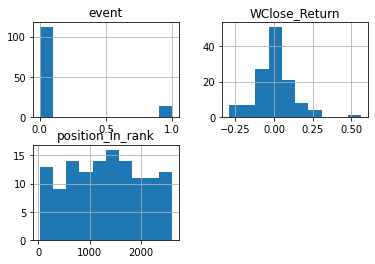

In [211]:
data_rank_event.hist()

array([[<Axes: title={'center': 'event'}>,
        <Axes: title={'center': 'WClose_Return'}>],
       [<Axes: title={'center': 'rank'}>, <Axes: >]], dtype=object)

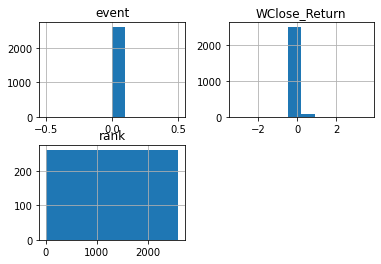

In [212]:
data_rank_no_event.hist()

### Melhorias sugeridas pelo chatgpt:

1 - Magnitude ponderada: O ranking agora é ponderado pela magnitude dos retornos, como sugerido.

2 - Percentil ao invés de rank puro: Adicionamos a consideração do percentil, que é mais robusto para distribuições assimétricas e caudas pesadas.

3 - Distribuição acumulada: Calculamos a proporção de eventos que estão acima ou abaixo de certos percentis para dar uma visão mais granular dos eventos.

In [9]:
# Funções
# Função para remover outliers acima de 3 desvios-padrão
def remove_outliers(df, column_name, threshold=3):
    mean = df[column_name].mean()
    std = df[column_name].std()
    df_filtered = df[(df[column_name] > (mean - threshold * std)) & 
                     (df[column_name] < (mean + threshold * std))]
    return df_filtered

# Função para calcular ranking ponderado pela magnitude dos retornos
def calculate_rankings(df, column_name):
    df['Rank'] = df[column_name].rank(method='first')  # Ranking simples
    df['Magnitude_Ponderada'] = df['Rank'] * df[column_name].abs()  # Ponderação pela magnitude do retorno
    df['Percentil'] = df[column_name].rank(pct=True)  # Percentil para capturar caudas pesadas
    return df

# Função para calcular a posição no ranking considerando os eventos
def find_position_in_rank(filtered_data_event_window, data_rank_no_event):
    if 'WClose_Return' not in filtered_data_event_window.columns or 'WClose_Return' not in data_rank_no_event.columns:
        raise ValueError("Filtered data or data rank does not contain 'WClose_Return' column.")
    
    positions = filtered_data_event_window.merge(data_rank_no_event[['WClose_Return', 'Percentil', 'rank']], 
                                                 on='WClose_Return', how='left')

    positions = positions.rename(columns={'rank': 'position_in_rank', 'Percentil': 'position_in_percentile'})
    
    # Atribuir posição sucessora para valores não encontrados no ranking (posição de fallback)
    nan_mask = positions['position_in_rank'].isna()
    data_rank_no_event_order = data_rank_no_event.sort_values(by='rank')

    if nan_mask.any():
        for index in positions[nan_mask].index:
            current_value = positions.at[index, 'WClose_Return']
            greater_than_value = data_rank_no_event_order[data_rank_no_event_order['WClose_Return'] > current_value]
            if not greater_than_value.empty:
                position = greater_than_value['rank'].min()
                positions.at[index, 'position_in_rank'] = position - 1
            else:
                last_rank = data_rank_no_event_order['rank'].max()
                positions.at[index, 'position_in_rank'] = last_rank

    return positions

# Função principal para analisar o impacto dos eventos
def analyze_rank(stock, start_date, end_date, window_size):
    window_size = int(window_size)

    # Carregar os dados
    stock_data = pd.read_csv(f"dataset/prices_processed/{stock}.SA.csv")
    
    # Calcular WClose e retorno logarítmico
    stock_data['WClose'] = stock_data['Adj Close'] * stock_data['Volume'] / stock_data['Volume'].mean()
    stock_data['WClose'] = stock_data['WClose'].rolling(window=window_size).mean()
    stock_data['WClose_Return'] = np.log(stock_data['WClose'] / stock_data['WClose'].shift(1))
    
    stock_return = stock_data[['Date', 'event', 'WClose_Return']]
    
    # Filtrar o DataFrame com base nas datas fornecidas
    filtered_data = stock_return[(stock_return['Date'] >= start_date) & (stock_return['Date'] <= end_date)]
    
    # Separar dados de períodos de eventos e fora de eventos
    period_event = filtered_data[filtered_data['event'] == 1]

    # Definir janela de publicação
    event_window = set()
    event_indices = period_event.index
    for idx in event_indices:
        for offset in range(-(window_size - 1), window_size):
            event_window.add(idx + offset)
    
    # Filtrar períodos de eventos e fora deles
    filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')
    filtered_data_event_window = filtered_data.loc[list(event_window)]
    
    # Calcular rank e percentil dos retornos fora de eventos
    data_rank_no_event = filtered_data_no_event_window.copy()
    #data_rank_no_event = calculate_rankings(data_rank_no_event, 'WClose_Return')
    data_rank_no_event['rank'] = data_rank_no_event['WClose_Return'].rank(method='first', pct=False)
        
    # Calcular posição dos log retornos dentro do evento
    data_rank_event = find_position_in_rank(filtered_data_event_window, data_rank_no_event)
    
    # Média das posições e dos percentis
    data_rank_event_mean = data_rank_event['position_in_rank'].mean()
    data_rank_event_percentile_mean = data_rank_event['position_in_percentile'].mean()

    # Proporção de eventos acima do 75º percentil e abaixo do 25º percentil
    above_75_percentile = len(data_rank_event[data_rank_event['position_in_percentile'] >= 0.75]) / len(data_rank_event)
    below_25_percentile = len(data_rank_event[data_rank_event['position_in_percentile'] <= 0.25]) / len(data_rank_event)

    # Fator normalizado pela quantidade de retornos fora do evento
    factor = data_rank_event_mean / len(data_rank_no_event)
    
    return {
        "factor": factor,
        "mean_rank_event": data_rank_event_mean,
        "mean_percentile_event": data_rank_event_percentile_mean,
        "above_75_percentile": above_75_percentile,
        "below_25_percentile": below_25_percentile,
        "data_rank_event": data_rank_event,
        "data_rank_no_event": data_rank_no_event
    }




In [18]:
stock_data = pd.read_csv(f"dataset/prices_processed/ITUB4.SA.csv")
stock_data.head()

,Date,event,Open,High,Low,Close,Adj Close,Volume,WClose,Daily_Return,Week_Return,Month_Return,Cumulative_std_Daily_Return,Cumulative_std_Week_Return,Cumulative_std_Month_Return,Indicator_Daily_Return,Indicator_Week_Return,Indicator_Month_Return
0,2010-01-04,0,17.708261,18.436810,17.708261,18.268333,10.145151,11843397,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
1,2010-01-05,0,18.313868,18.386723,18.168158,18.386723,10.210890,8593315,NaN,0.006459,NaN,NaN,NaN,NaN,NaN,0,0,0
2,2010-01-06,0,18.327526,18.436810,18.077089,18.227352,10.122394,10602572,NaN,-0.008705,NaN,NaN,0.010722,NaN,NaN,-1,0,0
3,2010-01-07,0,18.099855,18.236460,18.008787,18.040663,10.018710,9966567,NaN,-0.010296,NaN,NaN,0.009248,NaN,NaN,-1,0,0
4,2010-01-08,0,18.113516,18.113516,17.721922,17.767456,9.866985,9748709,NaN,-0.015260,NaN,NaN,0.009365,NaN,NaN,-1,0,0


In [25]:
import pandas as pd
import numpy as np


# Função para remover outliers acima de um limite de desvios-padrão
def remove_outliers(df, column_name, threshold=3):
    mean = df[column_name].mean()
    std = df[column_name].std()
    df_filtered = df[(df[column_name] > (mean - threshold * std)) &
                     (df[column_name] < (mean + threshold * std))].copy()
    return df_filtered


# Função para calcular rankings e percentis
def calculate_rankings(df, column_name):
    df = df.copy()  # Evitar alterações no DataFrame original
    df['rank'] = df[column_name].rank(method='first')  # Ranking simples
    df['Percentil'] = df[column_name].rank(pct=True)  # Percentil para capturar caudas pesadas
    return df


# Função principal para análise de impacto de eventos
def analyze_rank(stock, start_date, end_date, window_size):
    window_size = int(window_size)

    # Carregar dados
    stock_data = pd.read_csv(f"dataset/prices_processed/{stock}.SA.csv")
    
    # Calcular WClose e retornos logarítmicos
    stock_data['WClose'] = (stock_data['Adj Close'] * stock_data['Volume']) / stock_data['Volume'].mean()
    stock_data['WClose'] = stock_data['WClose'].rolling(window=window_size).mean()
    stock_data['WClose_Return'] = np.log(stock_data['WClose'] / stock_data['WClose'].shift(1))
    
    stock_return = stock_data[['Date', 'event', 'WClose_Return']]
    stock_return['Date'] = pd.to_datetime(stock_return['Date'])  # Garantir formato de data
    
    # Filtrar dados pelas datas fornecidas
    filtered_data = stock_return[(stock_return['Date'] >= start_date) & (stock_return['Date'] <= end_date)].copy()
    
    # Separar períodos de eventos
    period_event = filtered_data[filtered_data['event'] == 1]
    event_window = set()
    for idx in period_event.index:
        for offset in range(-(window_size - 1), window_size):
            event_window.add(idx + offset)
    
    filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')
    filtered_data_event_window = filtered_data.loc[list(event_window)]
    
    # Calcular rankings fora de eventos
    data_rank_no_event = calculate_rankings(filtered_data_no_event_window, 'WClose_Return')
    
    # Calcular posições nos rankings para eventos
    data_rank_event = find_position_in_rank(filtered_data_event_window, data_rank_no_event)
    
    # Estatísticas dos rankings e percentis
    data_rank_event_mean = data_rank_event['position_in_rank'].mean()
    data_rank_event_percentile_mean = data_rank_event['position_in_percentile'].mean()
    above_75_percentile = len(data_rank_event[data_rank_event['position_in_percentile'] >= 0.75]) / len(data_rank_event)
    below_25_percentile = len(data_rank_event[data_rank_event['position_in_percentile'] <= 0.25]) / len(data_rank_event)
    
    # Fator normalizado
    factor = data_rank_event_mean / len(data_rank_no_event)
    
    return {
        "factor": factor,
        "mean_rank_event": data_rank_event_mean,
        "mean_percentile_event": data_rank_event_percentile_mean,
        "above_75_percentile": above_75_percentile,
        "below_25_percentile": below_25_percentile,
        "data_rank_event": data_rank_event,
        "data_rank_no_event": data_rank_no_event
    }

def find_position_in_rank(filtered_data_event_window, data_rank_no_event):
    if 'WClose_Return' not in filtered_data_event_window.columns or 'WClose_Return' not in data_rank_no_event.columns:
        raise ValueError("Filtered data or data rank does not contain 'WClose_Return' column.")
    
    # Verifica se os ranks e percentis foram calculados
    if 'rank' not in data_rank_no_event.columns or 'Percentil' not in data_rank_no_event.columns:
        raise KeyError("The 'rank' or 'Percentil' column is missing in data_rank_no_event. Ensure rankings and percentiles are calculated.")
    
    # Merge para associar posição e percentil
    positions = filtered_data_event_window.merge(
        data_rank_no_event[['WClose_Return', 'Percentil', 'rank']],
        on='WClose_Return', how='left'
    ).rename(columns={'rank': 'position_in_rank', 'Percentil': 'position_in_percentile'})
    
    # Preencher valores NaN com interpolação baseada no WClose_Return
    nan_mask = positions['position_in_rank'].isna()
    if nan_mask.any():
        data_rank_no_event_sorted = data_rank_no_event.sort_values(by='WClose_Return')
        for index in positions[nan_mask].index:
            current_value = positions.at[index, 'WClose_Return']
            # Encontrar valor mais próximo
            closest_row = data_rank_no_event_sorted.iloc[(data_rank_no_event_sorted['WClose_Return'] - current_value).abs().argsort()[:1]]
            if not closest_row.empty:
                positions.at[index, 'position_in_rank'] = closest_row['rank'].values[0]
                positions.at[index, 'position_in_percentile'] = closest_row['Percentil'].values[0]
    
    return positions

In [26]:
# Aplicar a função com uma janela de 5 dias antes e depois do evento
result = analyze_rank("ITUB4", '2020-01-01', '2020-04-01', '5')
print(result)

{'factor': 0.6506172839506174, 'mean_rank_event': 29.27777777777778, 'mean_percentile_event': 0.6506172839506172, 'above_75_percentile': 0.4444444444444444, 'below_25_percentile': 0.16666666666666666, 'data_rank_event':          Date  event  WClose_Return  position_in_percentile  position_in_rank
0  2020-03-12      0       0.075730                0.800000              36.0
1  2020-03-13      0       0.201235                0.977778              44.0
2  2020-03-16      0       0.021598                0.622222              28.0
3  2020-03-17      0       0.063346                0.733333              33.0
4  2020-03-18      1       0.081514                0.822222              37.0
5  2020-03-19      0       0.033233                0.666667              30.0
6  2020-03-20      0      -0.082411                0.244444              11.0
7  2020-02-04      0      -0.013345                0.533333              24.0
8  2020-02-05      0       0.117771                0.866667              39.0


<ipython-input-25-7592b9bfe179>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock_return['Date'] = pd.to_datetime(stock_return['Date'])  # Garantir formato de data


In [ ]:
## QQ plot
# Ordena os dados
data1_sorted = np.sort(data1)
data2_sorted = np.sort(data2)

# Calcula os quantis
quantiles = np.linspace(0, 1, len(data1_sorted))
data1_quantiles = np.quantile(data1_sorted, quantiles)
data2_quantiles = np.quantile(data2_sorted, quantiles)

In [ ]:

# Adicionar linha de referência
abline(0, 1, col = "red", lty = 2)
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot_2samples

# Gerar dois conjuntos de dados
np.random.seed(123)
data1 = np.random.normal(0, 1, 1000)  # Normal(0, 1)
data2 = np.random.uniform(-1, 1, 1000)  # Uniforme(-1, 1)

# Criar o QQ plot
fig, ax = plt.subplots(figsize=(8, 8))
qqplot_2samples(data1, data2, line="45", ax=ax)
ax.set_title("QQ Plot entre duas distribuições")
ax.set_xlabel("Quantis da Distribuição 1")
ax.set_ylabel("Quantis da Dis

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


# Função para remover outliers acima de um limite de desvios-padrão
def remove_outliers(df, column_name, threshold=3):
    mean = df[column_name].mean()
    std = df[column_name].std()
    df_filtered = df[(df[column_name] > (mean - threshold * std)) & 
                     (df[column_name] < (mean + threshold * std))].copy()
    return df_filtered


# Função para calcular rankings e percentis
def calculate_rankings(df, column_name):
    df = df.copy()  # Evitar alterações no DataFrame original
    df['rank'] = df[column_name].rank(method='first')  # Ranking simples
    df['Percentil'] = df[column_name].rank(pct=True)  # Percentil para capturar caudas pesadas
    return df


# Função gráfica para exibir resultados
def plot_results(data_rank_event, title="Impacto de Eventos no Ranking"):
    plt.figure(figsize=(10, 6))
    
    # Gráfico de posição no ranking
    plt.subplot(2, 1, 1)
    plt.plot(data_rank_event['Date'], data_rank_event['position_in_rank'], label="Posição no Ranking", marker='o')
    plt.axhline(y=data_rank_event['position_in_rank'].mean(), color='r', linestyle='--', label='Média do Ranking')
    plt.title(f"Posição no Ranking - {title}")
    plt.xlabel("Data")
    plt.ylabel("Ranking")
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    
    # Gráfico de percentis
    plt.subplot(2, 1, 2)
    plt.plot(data_rank_event['Date'], data_rank_event['position_in_percentile'], label="Percentil", marker='o', color='g')
    plt.axhline(y=data_rank_event['position_in_percentile'].mean(), color='r', linestyle='--', label='Média do Percentil')
    plt.title(f"Distribuição de Percentis - {title}")
    plt.xlabel("Data")
    plt.ylabel("Percentil")
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()


# Função principal para análise de impacto de eventos
def analyze_rank(stock, start_date, end_date, window_size):
    window_size = int(window_size)

    # Carregar dados
    stock_data = pd.read_csv(f"dataset/prices_processed/{stock}.SA.csv")
    
    # Calcular WClose e retornos logarítmicos
    stock_data['WClose'] = (stock_data['Adj Close'] * stock_data['Volume']) / stock_data['Volume'].mean()
    stock_data['WClose'] = stock_data['WClose'].rolling(window=window_size).mean()
    stock_data['WClose_Return'] = np.log(stock_data['WClose'] / stock_data['WClose'].shift(1))
    
    stock_return = stock_data[['Date', 'event', 'WClose_Return']]
    stock_return['Date'] = pd.to_datetime(stock_return['Date'])  # Garantir formato de data
    
    # Filtrar dados pelas datas fornecidas
    filtered_data = stock_return[(stock_return['Date'] >= start_date) & (stock_return['Date'] <= end_date)].copy()
    
    # Separar períodos de eventos
    period_event = filtered_data[filtered_data['event'] == 1]
    event_window = set()
    for idx in period_event.index:
        for offset in range(-(window_size - 1), window_size):
            event_window.add(idx + offset)
    
    filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')
    filtered_data_event_window = filtered_data.loc[list(event_window)]
    
    # Calcular rankings fora de eventos
    data_rank_no_event = calculate_rankings(filtered_data_no_event_window, 'WClose_Return')
    
    # Calcular posições nos rankings para eventos
    data_rank_event = find_position_in_rank(filtered_data_event_window, data_rank_no_event)
    
    # Estatísticas dos rankings e percentis
    data_rank_event_mean = data_rank_event['position_in_rank'].mean()
    data_rank_event_percentile_mean = data_rank_event['position_in_percentile'].mean()
    above_75_percentile = len(data_rank_event[data_rank_event['position_in_percentile'] >= 0.75]) / len(data_rank_event)
    below_25_percentile = len(data_rank_event[data_rank_event['position_in_percentile'] <= 0.25]) / len(data_rank_event)
    
    # Fator normalizado
    factor = data_rank_event_mean / len(data_rank_no_event)
    
    # Plotar resultados
    plot_results(data_rank_event, title=f"{stock} ({start_date} a {end_date})")
    
    return {
        "factor": factor,
        "mean_rank_event": data_rank_event_mean,
        "mean_percentile_event": data_rank_event_percentile_mean,
        "above_75_percentile": above_75_percentile,
        "below_25_percentile": below_25_percentile,
        "data_rank_event": data_rank_event,
        "data_rank_no_event": data_rank_no_event
    }


<ipython-input-30-7a52e890e732>:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock_return['Date'] = pd.to_datetime(stock_return['Date'])  # Garantir formato de data


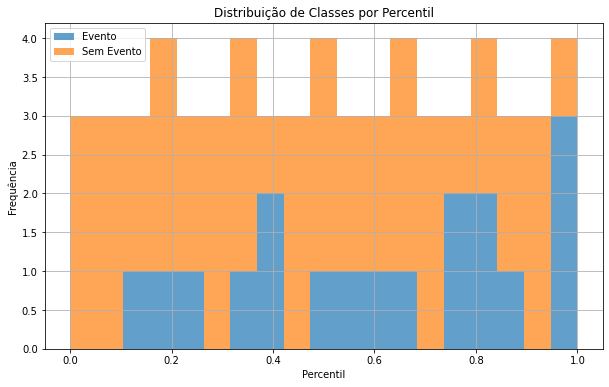

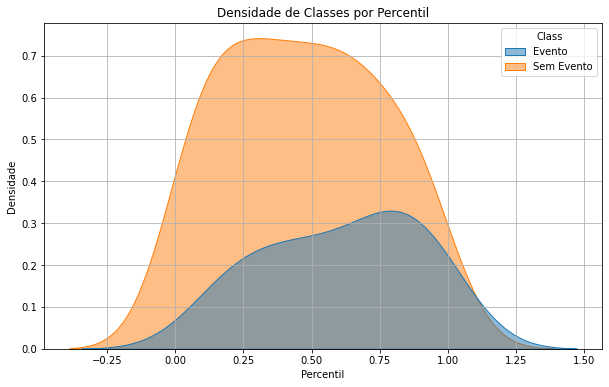

<ipython-input-30-7a52e890e732>:49: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(x='Percentil', y='Class', data=data, scale='width')


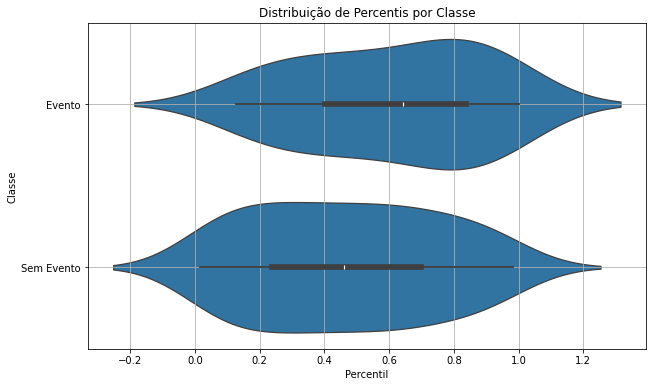

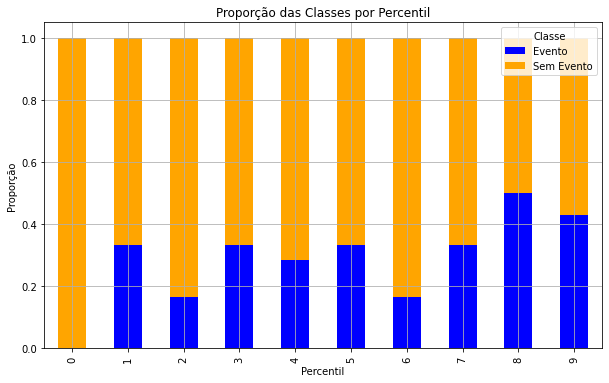

           Date  event  WClose_Return       Class  Percentil  Percentile Bin
2528 2020-03-12      0       0.075730      Evento   0.746032               7
2529 2020-03-13      0       0.201235      Evento   0.952381               9
2530 2020-03-16      0       0.021598      Evento   0.555556               5
2531 2020-03-17      0       0.063346      Evento   0.682540               6
2532 2020-03-18      1       0.081514      Evento   0.761905               7
...         ...    ...            ...         ...        ...             ...
2538 2020-03-26      0      -0.070965  Sem Evento   0.238095               2
2539 2020-03-27      0      -0.112638  Sem Evento   0.142857               1
2540 2020-03-30      0      -0.069473  Sem Evento   0.253968               2
2541 2020-03-31      0      -0.043932  Sem Evento   0.365079               3
2542 2020-04-01      0      -0.017760  Sem Evento   0.428571               4

[63 rows x 6 columns]


In [31]:
# Aplicar a função com uma janela de 5 dias antes e depois do evento
result = analyze_rank("ITUB4", '2020-01-01', '2020-04-01', '5')
print(result)

In [30]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Função para remover outliers acima de um limite de desvios-padrão
def remove_outliers(df, column_name, threshold=3):
    mean = df[column_name].mean()
    std = df[column_name].std()
    df_filtered = df[(df[column_name] > (mean - threshold * std)) &
                     (df[column_name] < (mean + threshold * std))].copy()
    return df_filtered

# Função para calcular rankings e percentis
def calculate_rankings(df, column_name):
    df = df.copy()  # Evitar alterações no DataFrame original
    df['rank'] = df[column_name].rank(method='first')  # Ranking simples
    df['Percentil'] = df[column_name].rank(pct=True)  # Percentil para capturar caudas pesadas
    return df

# Função gráfica 1: Histograma empilhado
def plot_stacked_histogram(data, title="Distribuição de Classes por Percentil"):
    bins = np.linspace(0, 1, 20)
    classes = data['Class'].unique()
    class_data = [data[data['Class'] == cls]['Percentil'] for cls in classes]
    
    plt.figure(figsize=(10, 6))
    plt.hist(class_data, bins=bins, stacked=True, label=classes, alpha=0.7)
    plt.title(title)
    plt.xlabel("Percentil")
    plt.ylabel("Frequência")
    plt.legend()
    plt.grid()
    plt.show()

# Função gráfica 2: Gráfico de densidade com classes
def plot_density(data, title="Densidade de Classes por Percentil"):
    plt.figure(figsize=(10, 6))
    sns.kdeplot(data=data, x='Percentil', hue='Class', fill=True, alpha=0.5)
    plt.title(title)
    plt.xlabel('Percentil')
    plt.ylabel('Densidade')
    plt.grid()
    plt.show()

# Função gráfica 3: Gráfico de violino
def plot_violin(data, title="Distribuição de Percentis por Classe"):
    plt.figure(figsize=(10, 6))
    sns.violinplot(x='Percentil', y='Class', data=data, scale='width')
    plt.title(title)
    plt.xlabel("Percentil")
    plt.ylabel("Classe")
    plt.grid()
    plt.show()

# Função gráfica 4: Proporção por bins
def plot_stacked_bar(data, title="Proporção das Classes por Percentil"):
    data['Percentile Bin'] = pd.cut(data['Percentil'], bins=10, labels=False)
    counts = data.groupby(['Percentile Bin', 'Class']).size().unstack(fill_value=0)
    proportions = counts.div(counts.sum(axis=1), axis=0)
    
    proportions.plot(kind='bar', stacked=True, color=['blue', 'orange'], figsize=(10, 6))
    plt.title(title)
    plt.xlabel("Percentil")
    plt.ylabel("Proporção")
    plt.legend(title="Classe")
    plt.grid()
    plt.show()

# Função principal para análise de impacto de eventos
def analyze_rank(stock, start_date, end_date, window_size):
    window_size = int(window_size)

    # Carregar dados
    stock_data = pd.read_csv(f"dataset/prices_processed/{stock}.SA.csv")
    
    # Calcular WClose e retornos logarítmicos
    stock_data['WClose'] = (stock_data['Adj Close'] * stock_data['Volume']) / stock_data['Volume'].mean()
    stock_data['WClose'] = stock_data['WClose'].rolling(window=window_size).mean()
    stock_data['WClose_Return'] = np.log(stock_data['WClose'] / stock_data['WClose'].shift(1))
    
    stock_return = stock_data[['Date', 'event', 'WClose_Return']]
    stock_return['Date'] = pd.to_datetime(stock_return['Date'])  # Garantir formato de data
    
    # Filtrar dados pelas datas fornecidas
    filtered_data = stock_return[(stock_return['Date'] >= start_date) & (stock_return['Date'] <= end_date)].copy()
    
    # Separar períodos de eventos
    period_event = filtered_data[filtered_data['event'] == 1]
    event_window = set()
    for idx in period_event.index:
        for offset in range(-(window_size - 1), window_size):
            event_window.add(idx + offset)
    
    filtered_data_no_event_window = filtered_data.drop(event_window, errors='ignore')
    filtered_data_event_window = filtered_data.loc[list(event_window)]
    
    # Calcular rankings fora de eventos
    data_rank_no_event = calculate_rankings(filtered_data_no_event_window, 'WClose_Return')
    
    # Adicionar classes para análise gráfica
    filtered_data_event_window['Class'] = 'Evento'
    filtered_data_no_event_window['Class'] = 'Sem Evento'
    combined_data = pd.concat([filtered_data_event_window, filtered_data_no_event_window])
    combined_data['Percentil'] = combined_data['WClose_Return'].rank(pct=True)
    
    # Gerar gráficos
    plot_stacked_histogram(combined_data)
    plot_density(combined_data)
    plot_violin(combined_data)
    plot_stacked_bar(combined_data)
    
    return combined_data
